### Business Context

Buying and selling used phones and tablets used to be something that happened on a handful of online marketplace sites. But the used and refurbished device market has grown considerably over the past decade, and a new IDC (International Data Corporation) forecast predicts that the used phone market would be worth \\$52.7bn by 2023 with a compound annual growth rate (CAGR) of 13.6% from 2018 to 2023. This growth can be attributed to an uptick in demand for used phones and tablets that offer considerable savings compared with new models.

Refurbished and used devices continue to provide cost-effective alternatives to both consumers and businesses that are looking to save money when purchasing one. There are plenty of other benefits associated with the used device market. Used and refurbished devices can be sold with warranties and can also be insured with proof of purchase. Third-party vendors/platforms, such as Verizon, Amazon, etc., provide attractive offers to customers for refurbished devices. Maximizing the longevity of devices through second-hand trade also reduces their environmental impact and helps in recycling and reducing waste. The impact of the COVID-19 outbreak may further boost this segment as consumers cut back on discretionary spending and buy phones and tablets only for immediate needs.

 
### Objective

The rising potential of this comparatively under-the-radar market fuels the need for an ML-based solution to develop a dynamic pricing strategy for used and refurbished devices. ReCell, a startup aiming to tap the potential in this market, has hired you as a data scientist. They want you to analyze the data provided and build a linear regression model to predict the price of a used phone/tablet and identify factors that significantly influence it.

 
### Data Description

The data contains the different attributes of used/refurbished phones and tablets. The data was collected in the year 2021. The detailed data dictionary is given below.


- brand_name: Name of manufacturing brand
- os: OS on which the device runs
- screen_size: Size of the screen in cm
- 4g: Whether 4G is available or not
- 5g: Whether 5G is available or not
- main_camera_mp: Resolution of the rear camera in megapixels
- selfie_camera_mp: Resolution of the front camera in megapixels
- int_memory: Amount of internal memory (ROM) in GB
- ram: Amount of RAM in GB
- battery: Energy capacity of the device battery in mAh
- weight: Weight of the device in grams
- release_year: Year when the device model was released
- days_used: Number of days the used/refurbished device has been used
- normalized_new_price: Normalized price of a new device of the same model in euros
- normalized_used_price: Normalized price of the used/refurbished device in euros

## Data Overview

In [3]:
df.shape

(3454, 15)

In [4]:
df.duplicated().sum()

0

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3454 entries, 0 to 3453
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   brand_name             3454 non-null   object 
 1   os                     3454 non-null   object 
 2   screen_size            3454 non-null   float64
 3   4g                     3454 non-null   object 
 4   5g                     3454 non-null   object 
 5   main_camera_mp         3275 non-null   float64
 6   selfie_camera_mp       3452 non-null   float64
 7   int_memory             3450 non-null   float64
 8   ram                    3450 non-null   float64
 9   battery                3448 non-null   float64
 10  weight                 3447 non-null   float64
 11  release_year           3454 non-null   int64  
 12  days_used              3454 non-null   int64  
 13  normalized_used_price  3454 non-null   float64
 14  normalized_new_price   3454 non-null   float64
dtypes: f

In [6]:
df.isnull().sum()

brand_name                 0
os                         0
screen_size                0
4g                         0
5g                         0
main_camera_mp           179
selfie_camera_mp           2
int_memory                 4
ram                        4
battery                    6
weight                     7
release_year               0
days_used                  0
normalized_used_price      0
normalized_new_price       0
dtype: int64

In [7]:
df.describe(include='all')

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
count,3454,3454,3454.000000,3454,3454,3275.000000,3452.000000,3450.000000,3450.000000,3448.000000,3447.000000,3454.000000,3454.000000,3454.000000,3454.000000
unique,34,4,NaN,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Others,Android,NaN,yes,no,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,502,3214,NaN,2335,3302,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,13.713115,NaN,NaN,9.460208,6.554229,54.573099,4.036122,3133.402697,182.751871,2015.965258,674.869716,4.364712,5.233107
std,NaN,NaN,3.805280,NaN,NaN,4.815461,6.970372,84.972371,1.365105,1299.682844,88.413228,2.298455,248.580166,0.588914,0.683637
min,NaN,NaN,5.080000,NaN,NaN,0.080000,0.000000,0.010000,0.020000,500.000000,69.000000,2013.000000,91.000000,1.536867,2.901422
25%,NaN,NaN,12.700000,NaN,NaN,5.000000,2.000000,16.000000,4.000000,2100.000000,142.000000,2014.000000,533.500000,4.033931,4.790342
50%,NaN,NaN,12.830000,NaN,NaN,8.000000,5.000000,32.000000,4.000000,3000.000000,160.000000,2015.500000,690.500000,4.405133,5.245892
75%,NaN,NaN,15.340000,NaN,NaN,13.000000,8.000000,64.000000,4.000000,4000.000000,185.000000,2018.000000,868.750000,4.755700,5.673718


#### Observations

- 3454 number of entries in each of a total of 15 columns of data.
- No duplicated values.
- Object/ categorical variables here are `brand_name`, `os`, `4g`, `5g`. While the rest are numerical columns.
- Some missing values detected.
- 34 unique `brand_name`.
- 4 unique `os`, Android devices are the most in terms of number.
- Average `screen_size` is around 13.7cm, close to the median of 12.83cm. Ranging between 5.08cm to 30.71cm.
- Most of the devices have `4g` but not the case for `5g` .
- `main_camera_mp` has an average of 9.46mp,  ranging between 0.08mp to 48.0mp.
- `selfie_camera_mp` has an average of 6.55mp, ranging between 0.0mp to 32.0mp.
- `int_memory` average 54.57GB, ranging between 0.01GB to 1024GB.
- `ram` on average 4GB, the smallest being 0.02GB and the largest being 12GB.
- `battery` are averaged at 3133.4mAh, minimum of 500mAh and a maximum of 9720mAh.
- `weight` averages at 182.75g, minimum 69g to a maximum 855g.
- `release_year` as early as 2013 till the latest at 2020.
- `days_used` on average is 674.86 days. Ranging between 91 days to 1094 days.
- `normalized_used_price` averages at EUR4.36. Ranging between EUR0.59 to EUR6.62.
- `normalized_new_price` averages at EUR5.23. Ranging between EUR0.68 to EUR7.85.

## Exploratory Data Analysis (EDA)

### Univariate Analysis

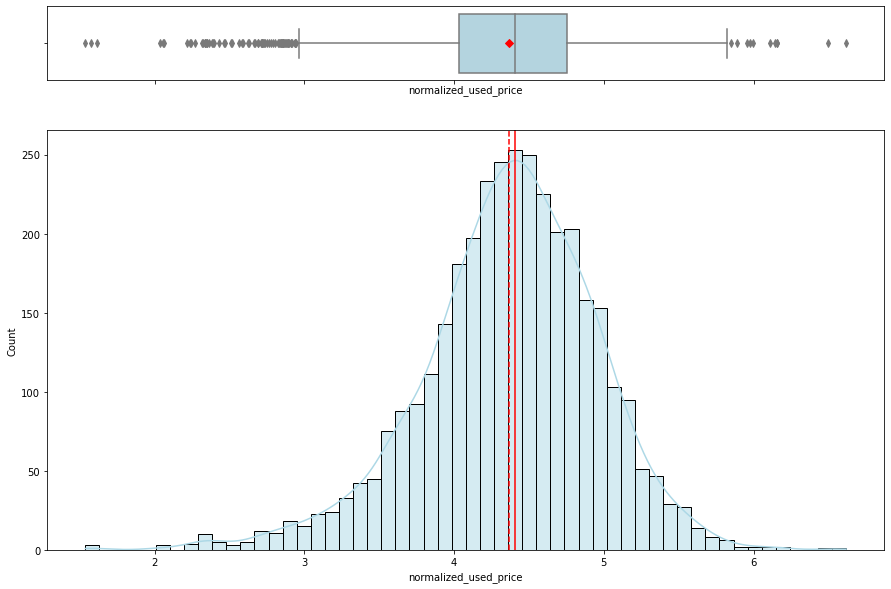

In [151]:
histogram_boxplot(df, "normalized_used_price",kde=True)

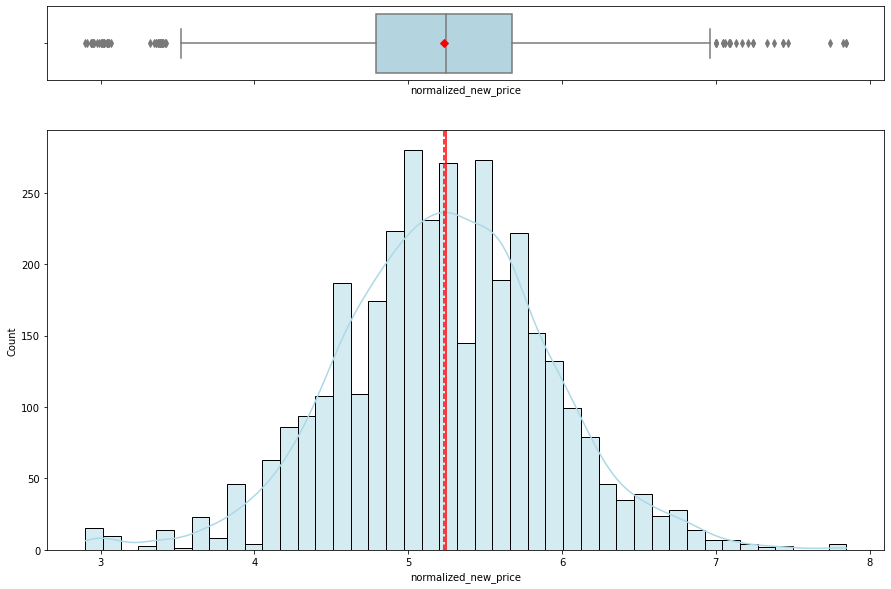

In [152]:
histogram_boxplot(df, "normalized_new_price",kde=True)

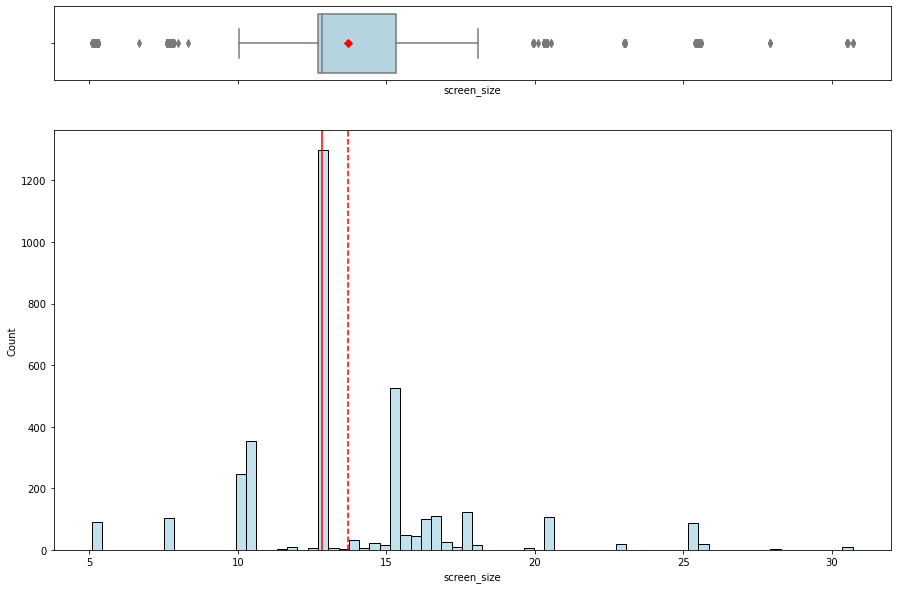

In [153]:
histogram_boxplot(df, "screen_size")

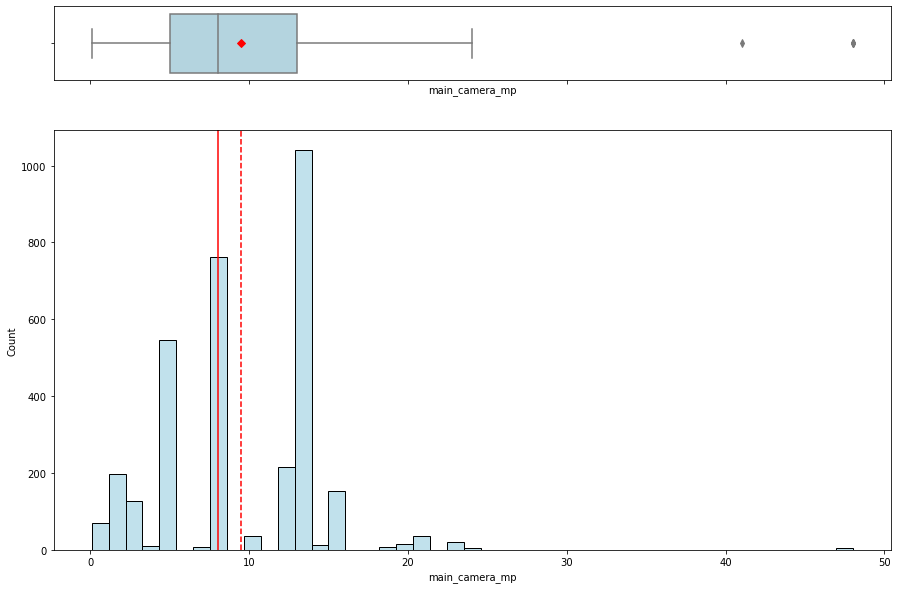

In [154]:
histogram_boxplot(df, "main_camera_mp")

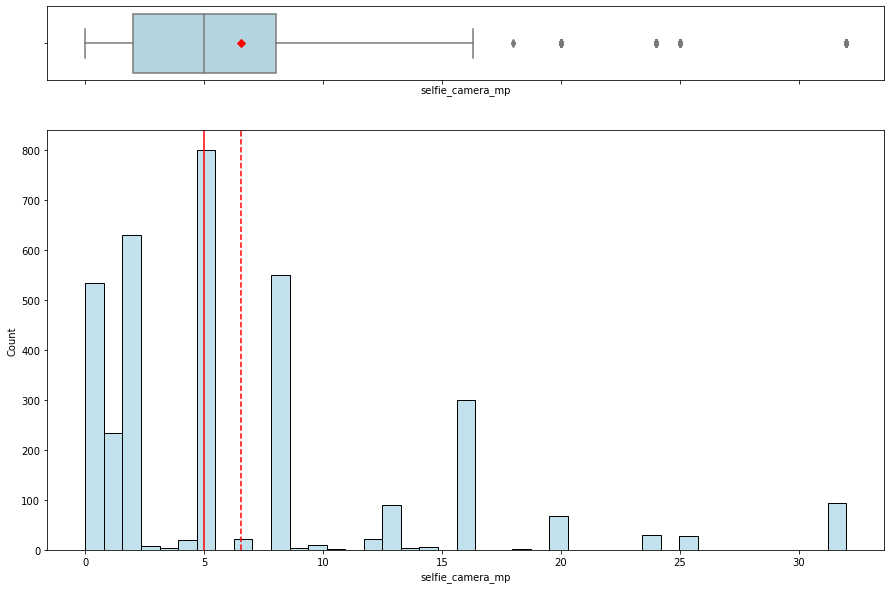

In [155]:
histogram_boxplot(df, "selfie_camera_mp")

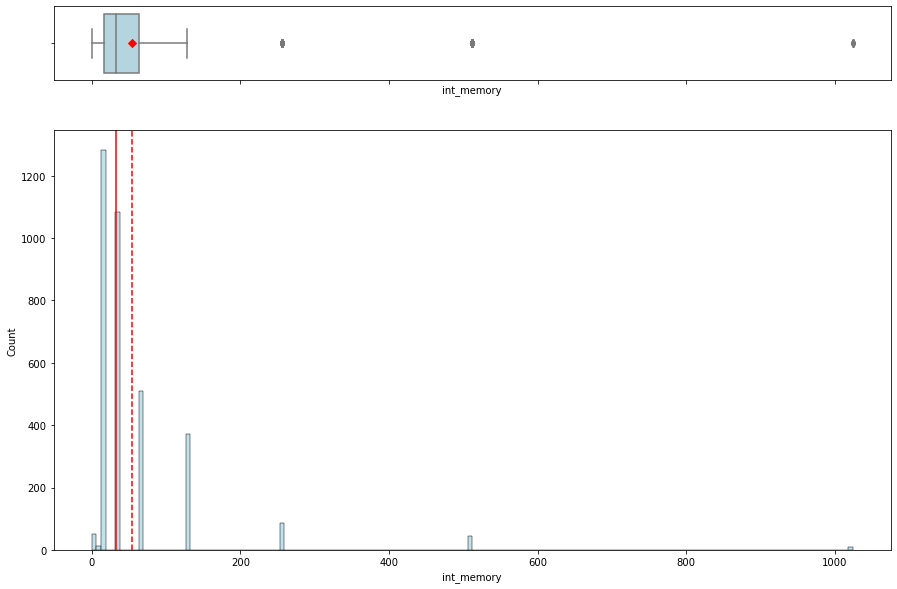

In [156]:
histogram_boxplot(df, "int_memory")

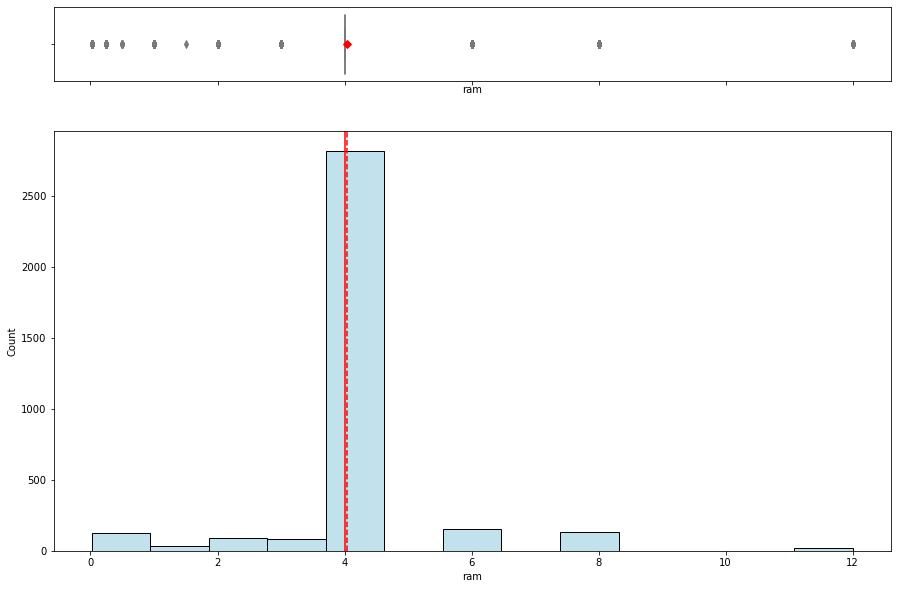

In [157]:
histogram_boxplot(df, "ram")

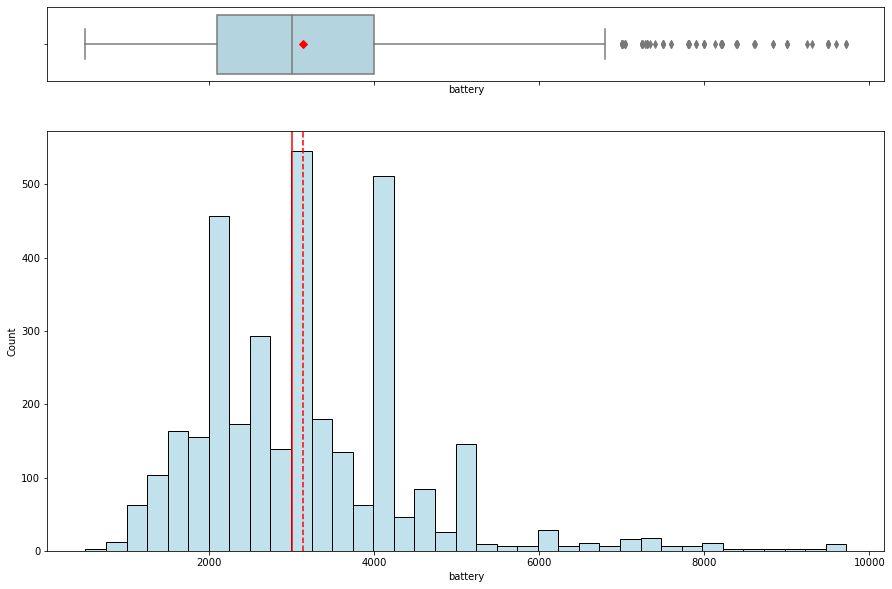

In [158]:
histogram_boxplot(df, "battery")

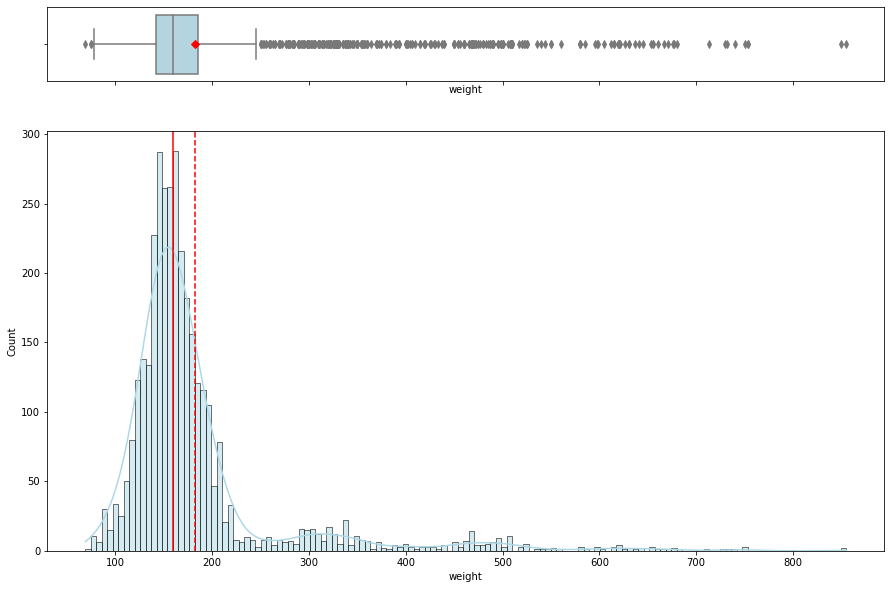

In [159]:
histogram_boxplot(df, "weight",kde=True)

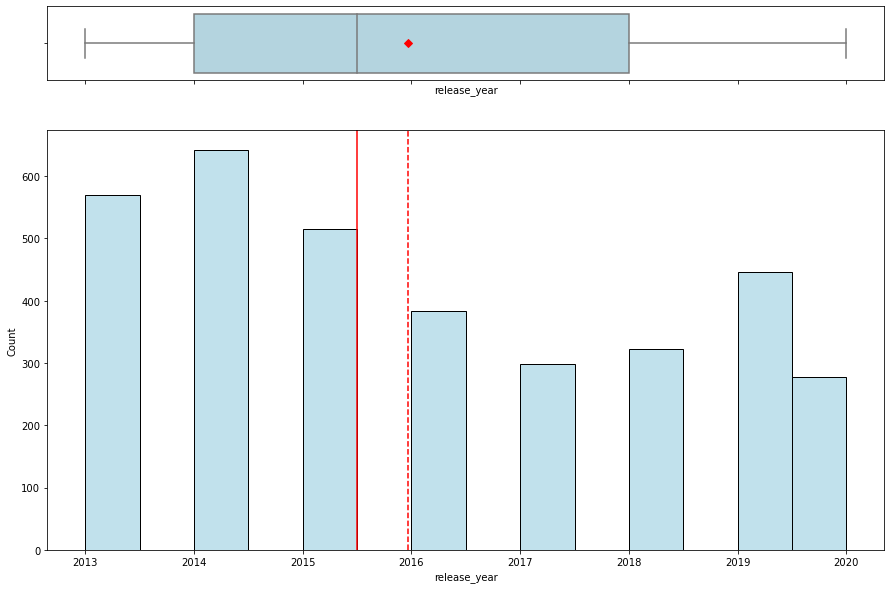

In [160]:
histogram_boxplot(df, "release_year")

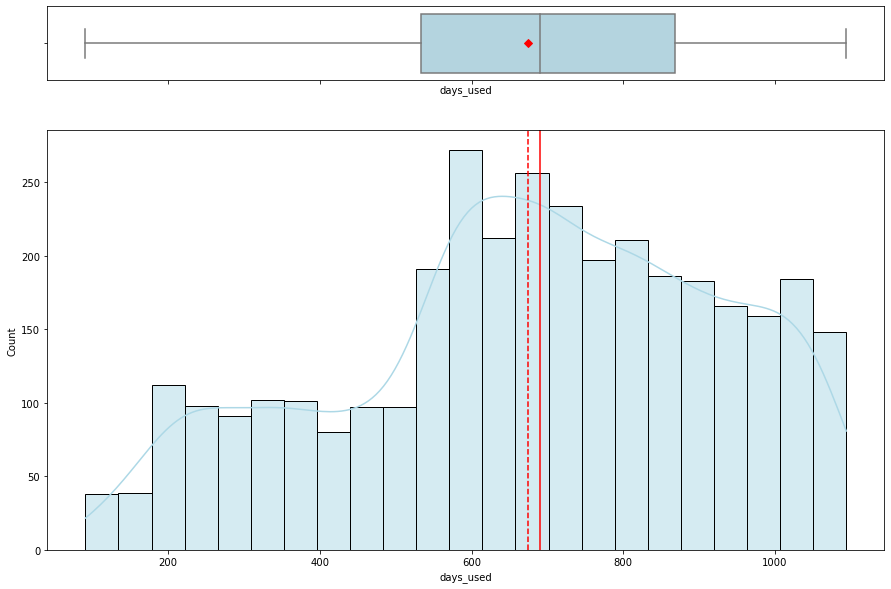

In [161]:
histogram_boxplot(df, "days_used",kde=True)

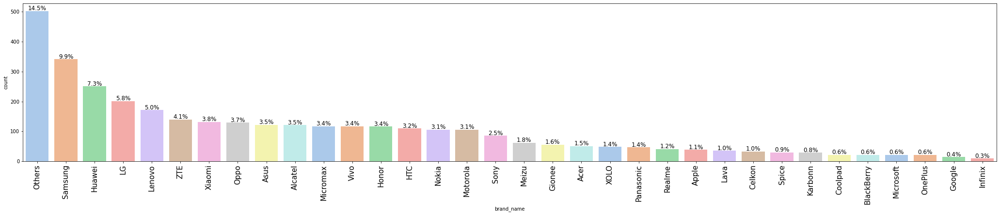

In [162]:
labeled_barplot(df, "brand_name", perc=True, n=None)

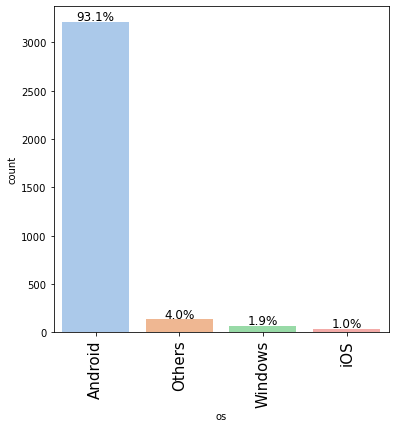

In [163]:
labeled_barplot(df, "os", perc=True)

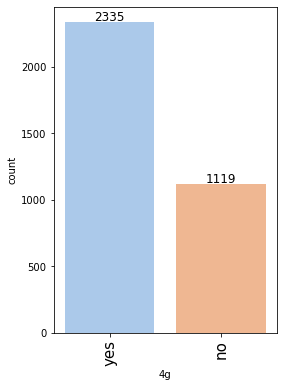

In [164]:
labeled_barplot(df, "4g")

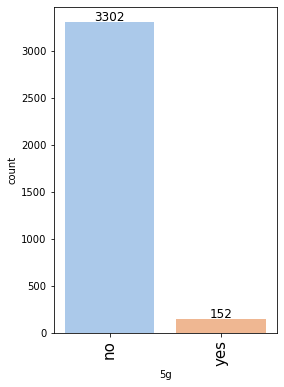

In [165]:
labeled_barplot(df, "5g")

#### Observations

- (1) `normalized_used_price` and `normalized_new_price` looks very close to a normal distribution
- `screen_size` has a lot of outliers and heavily right-skewed. Similarly for `main_camera_mp`, `selfie_camera_mp`, `int_memory`, `ram`, `battery` and `weight`.
- `release_year` is only a slight right-skewed, no outliers.
- `days_used` is left-skewed and no outliers.
- 14.5% of the devices are categorized as 'Others', while the top 3 branded device are Samsung, Huawei and LG with 9.9%, 7.3%, and 5.8% respectively.
- (2) There are 93% of the used devices are androids.
- Again 2335 of the used devices has 4G but 3302 of them doesn't have 5G.

### Multivariate Analysis

We first study the relationship of the company's objective variable `normalized_used_price`

(****Please refer to appendix for more selected analysis on different features.****)

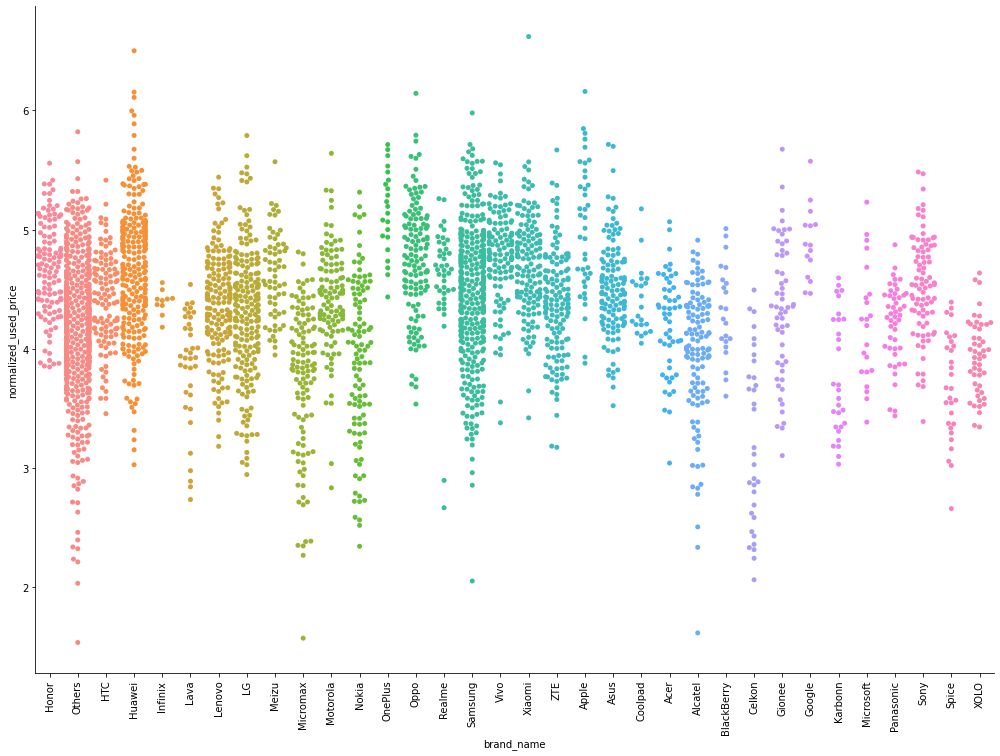

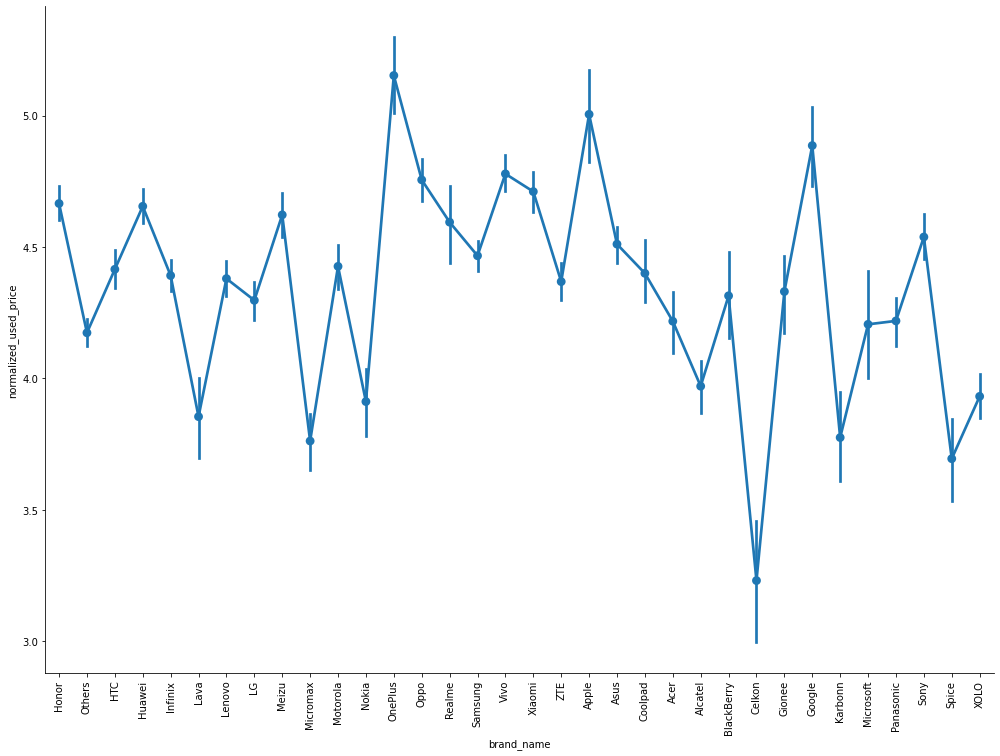

In [166]:
sns.catplot(data=df, kind="swarm", y="normalized_used_price", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=df, kind="point", y="normalized_used_price", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

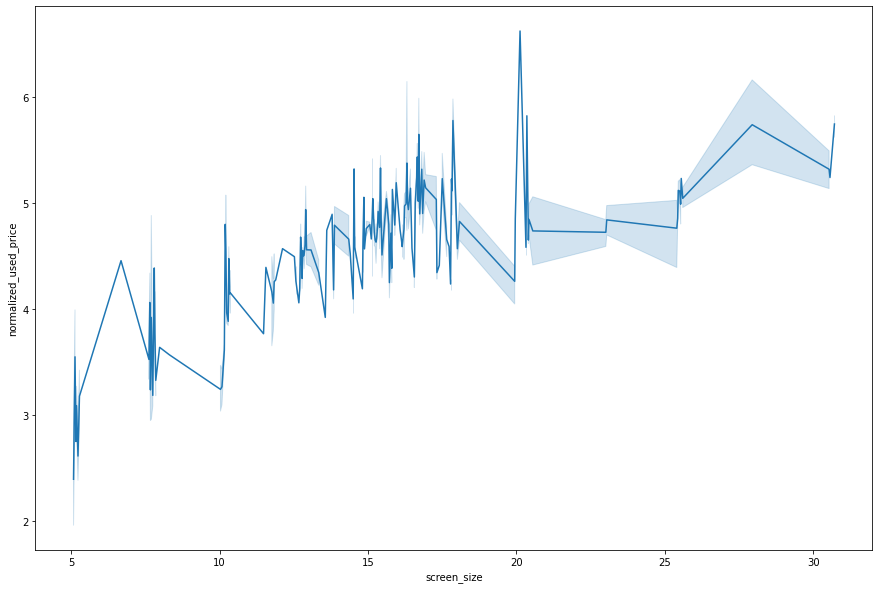

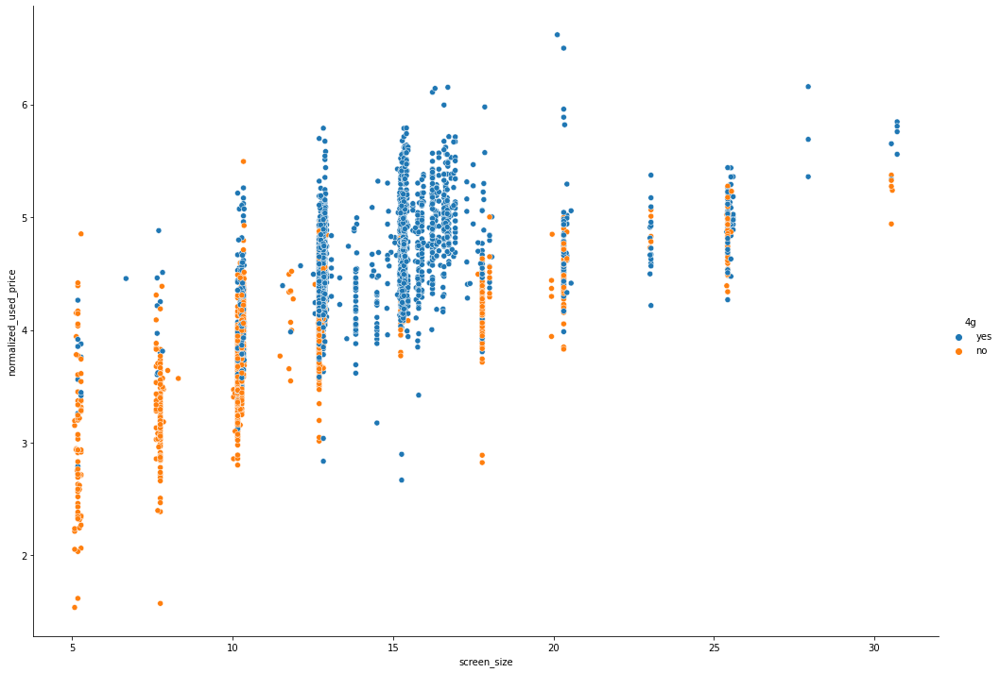

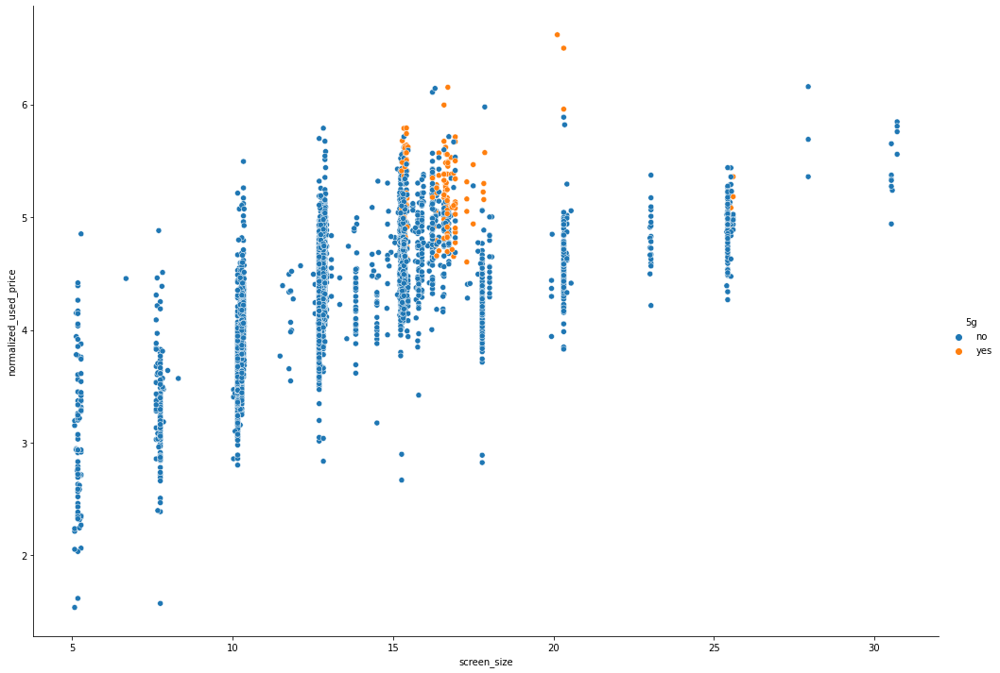

In [167]:
plt.figure(figsize=(15,10))
sns.lineplot(data=df, y="normalized_used_price", x="screen_size")
plt.show()

sns.relplot(data=df, y="normalized_used_price", x="screen_size",hue='4g',height=10, aspect=1.4)
plt.show()

sns.relplot(data=df, y="normalized_used_price", x="screen_size",hue='5g',height=10, aspect=1.4)
plt.show()

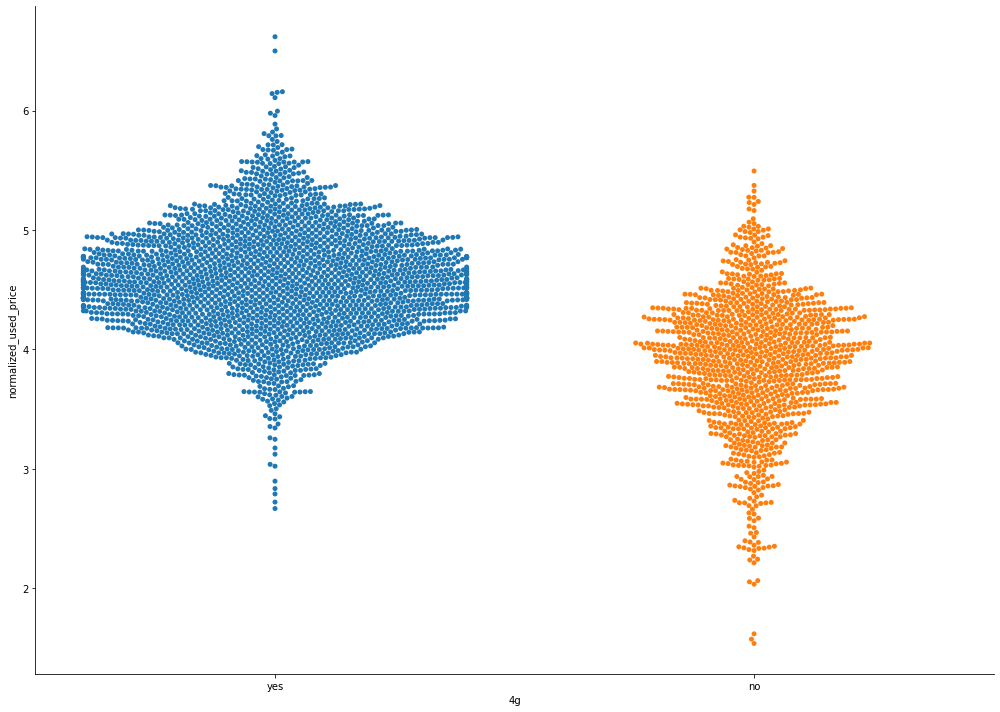

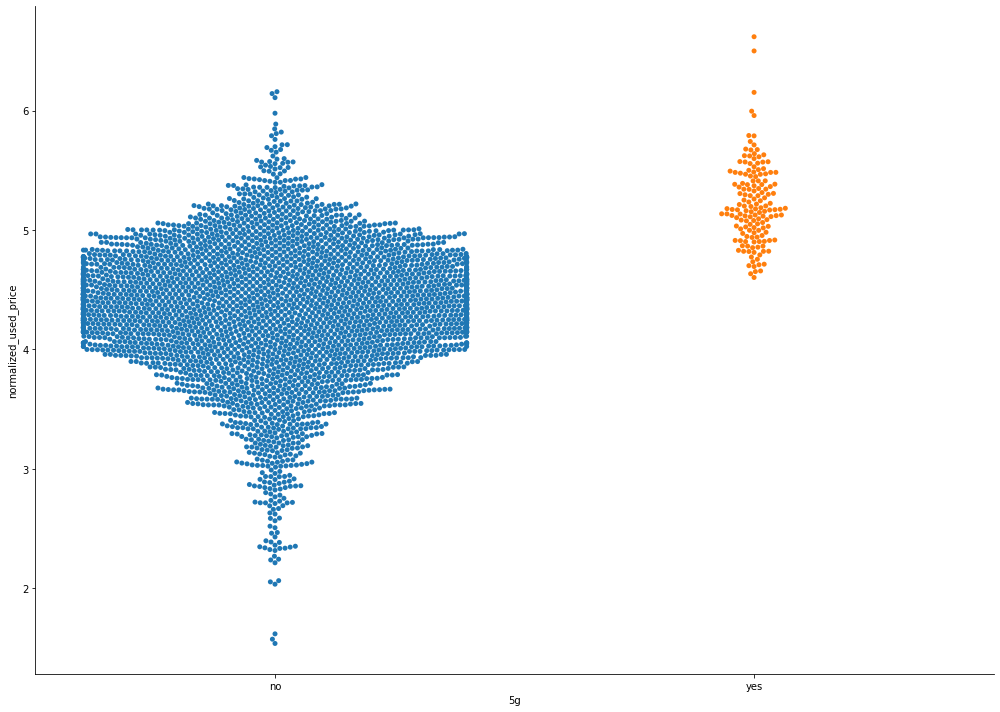

In [168]:
sns.catplot(data=df, kind="swarm", y="normalized_used_price", x="4g",height=10, aspect=1.4)
plt.show()

sns.catplot(data=df, kind="swarm", y="normalized_used_price", x="5g",height=10, aspect=1.4)
plt.show()

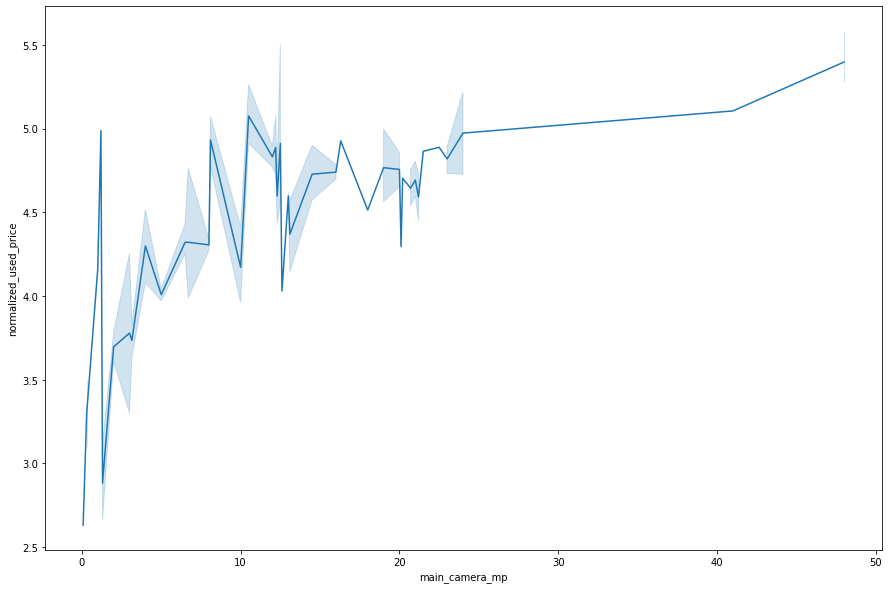

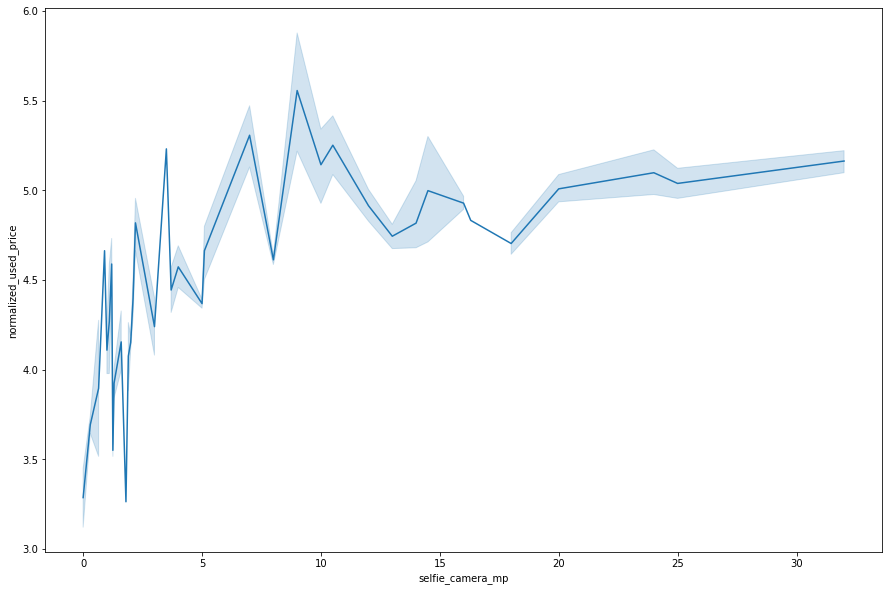

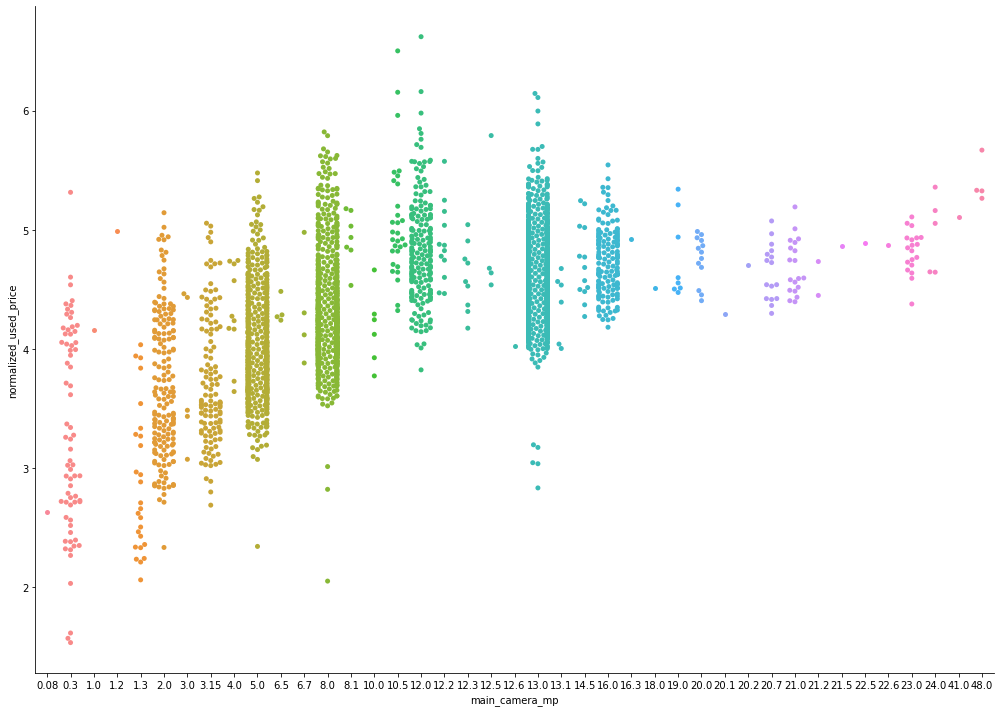

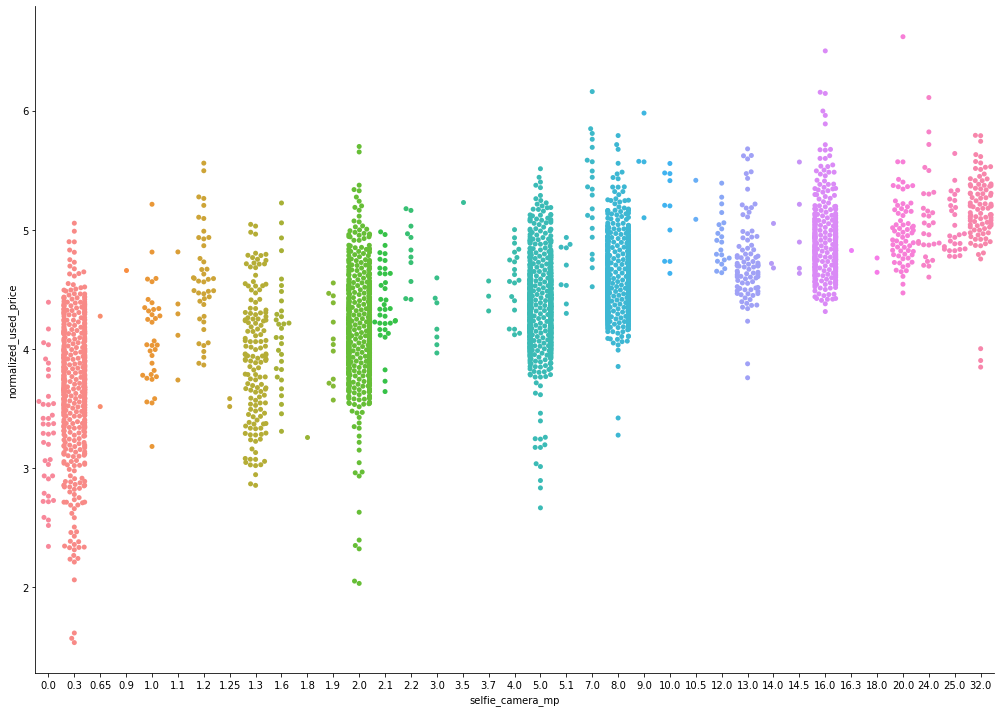

In [169]:
plt.figure(figsize=(15,10))
sns.lineplot(data=df, y="normalized_used_price", x="main_camera_mp")
plt.show()

plt.figure(figsize=(15,10))
sns.lineplot(data=df, y="normalized_used_price", x="selfie_camera_mp")
plt.show()

sns.catplot(data=df, kind="swarm", y="normalized_used_price", x="main_camera_mp",height=10, aspect=1.4)
plt.show()

sns.catplot(data=df, kind="swarm", y="normalized_used_price", x="selfie_camera_mp",height=10, aspect=1.4)
plt.show()

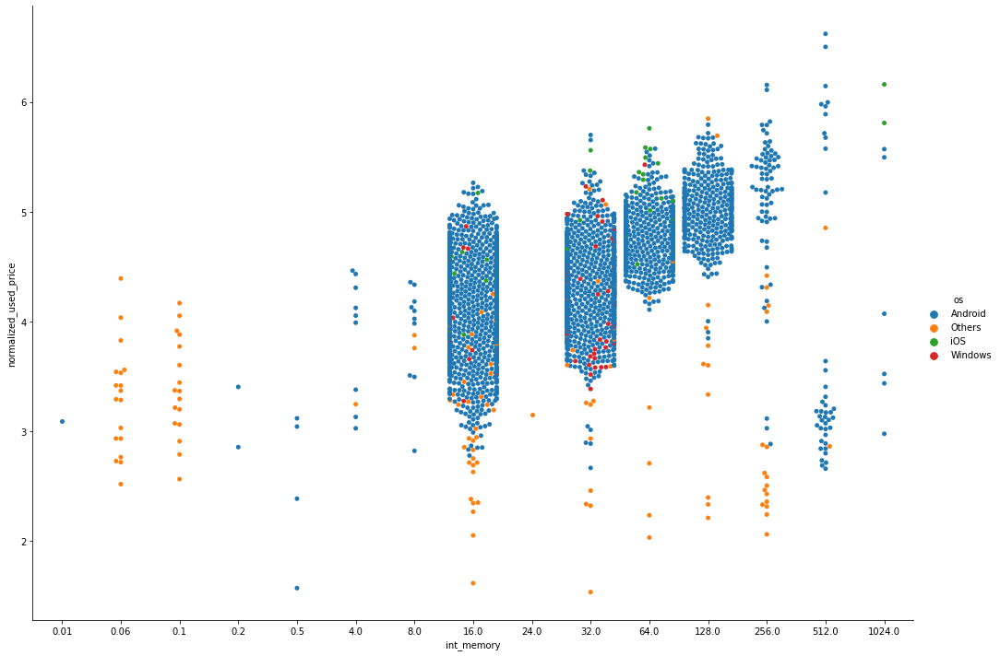

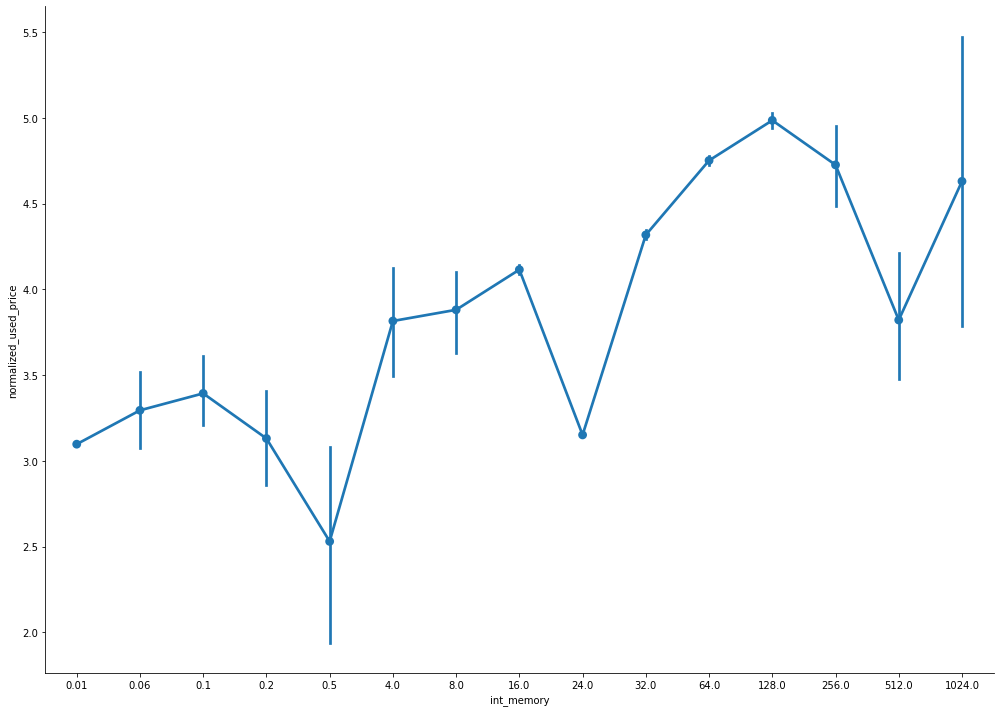

In [170]:
sns.catplot(data=df, kind="swarm", y="normalized_used_price", x="int_memory",hue='os',height=10, aspect=1.4)
plt.show()

sns.catplot(data=df, kind="point", y="normalized_used_price", x="int_memory",height=10, aspect=1.4)
plt.show()

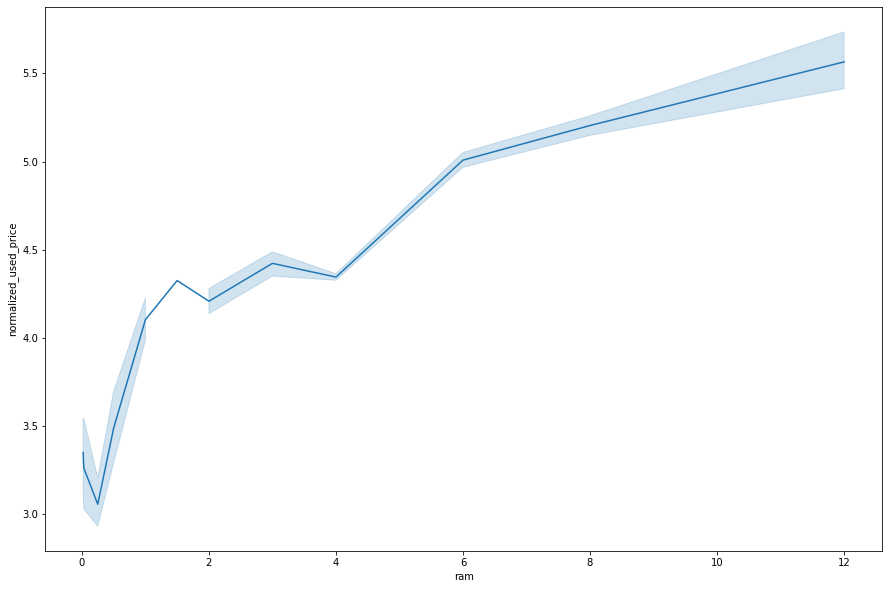

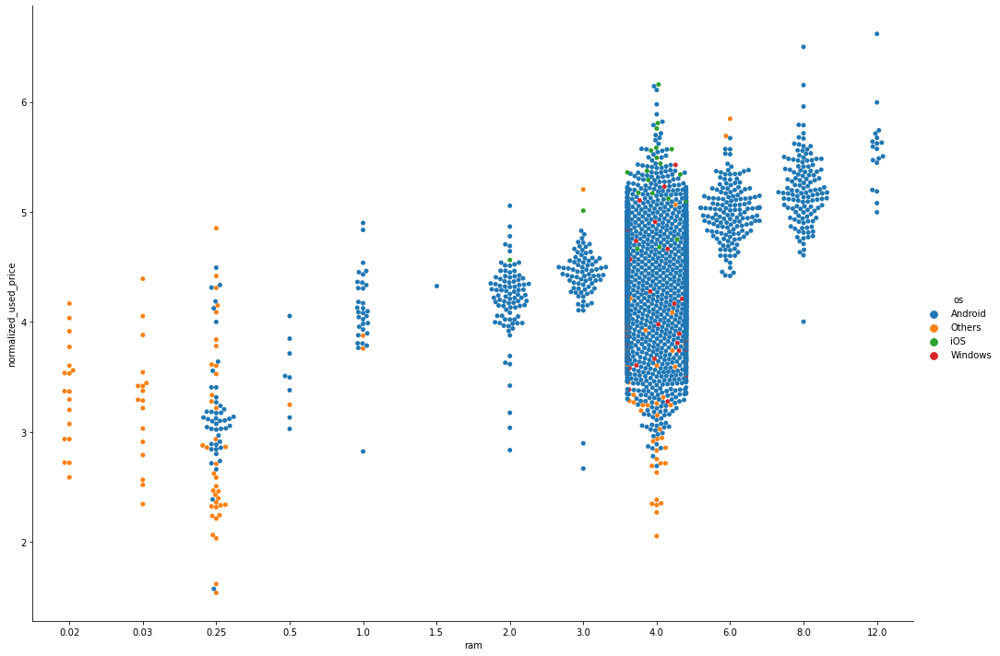

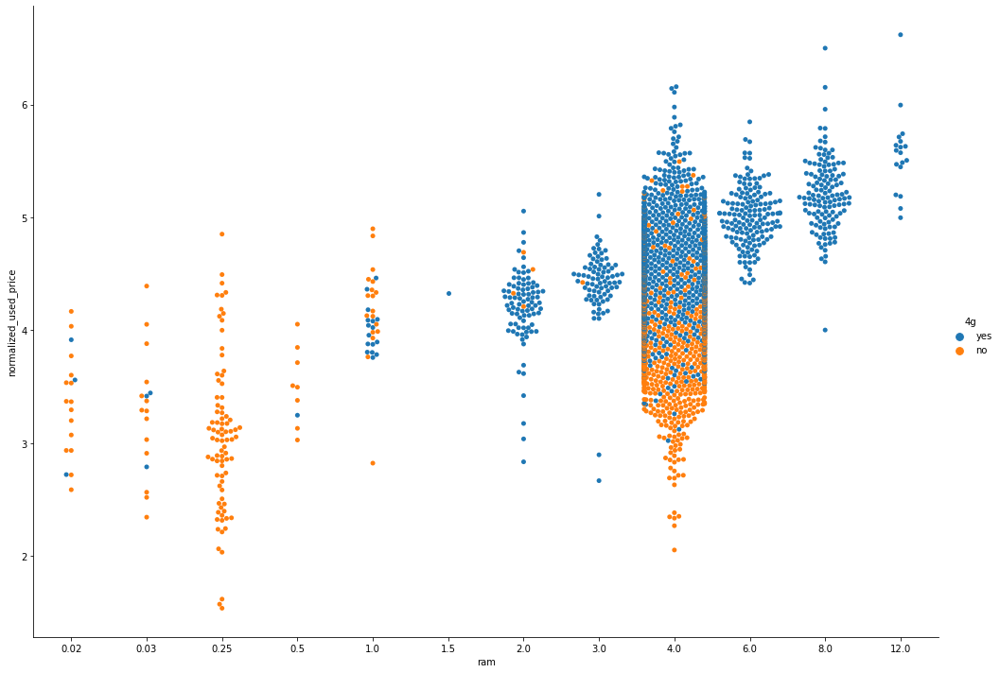

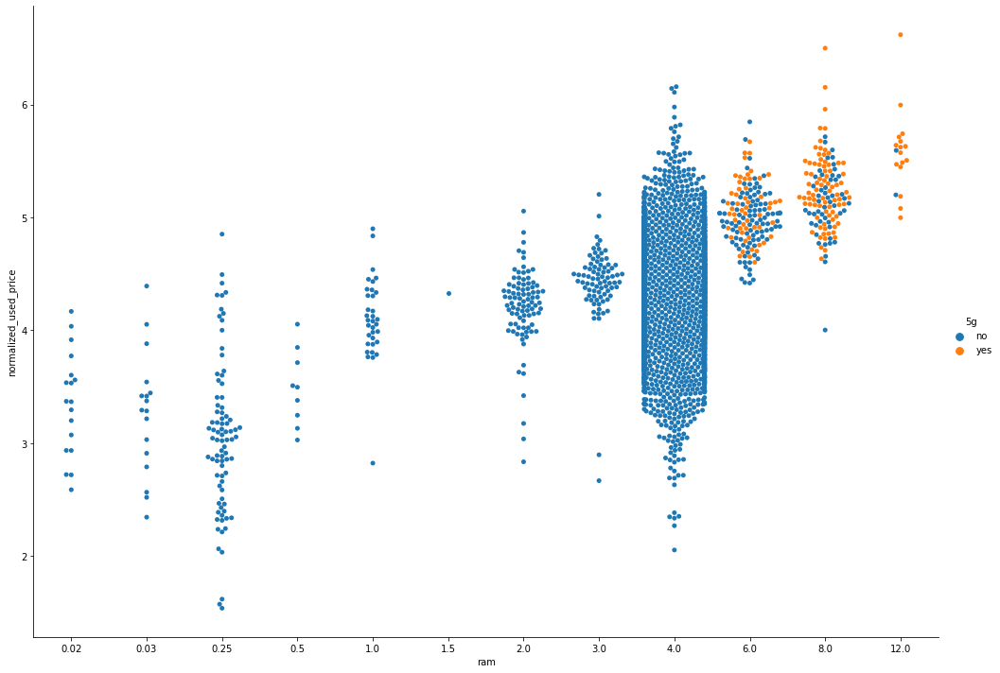

In [171]:
plt.figure(figsize=(15,10))
sns.lineplot(data=df, y="normalized_used_price", x="ram")
plt.show()

sns.catplot(data=df, kind="swarm", y="normalized_used_price", x="ram",hue='os',height=10, aspect=1.4)
plt.show()

sns.catplot(data=df, kind="swarm", y="normalized_used_price", x="ram",hue='4g',height=10, aspect=1.4)
plt.show()

sns.catplot(data=df, kind="swarm", y="normalized_used_price", x="ram",hue='5g',height=10, aspect=1.4)
plt.show()

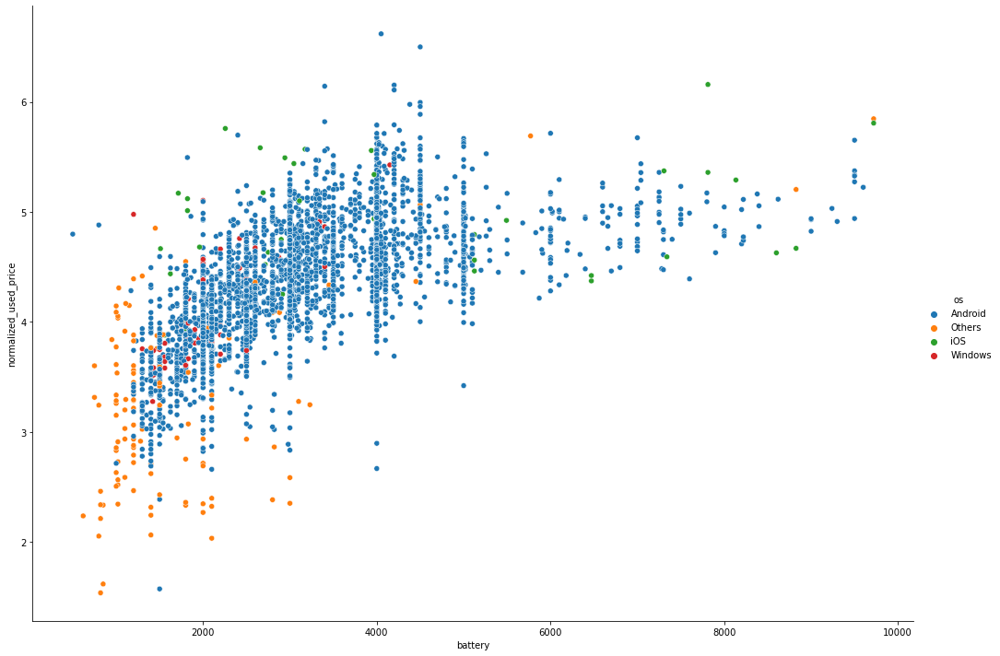

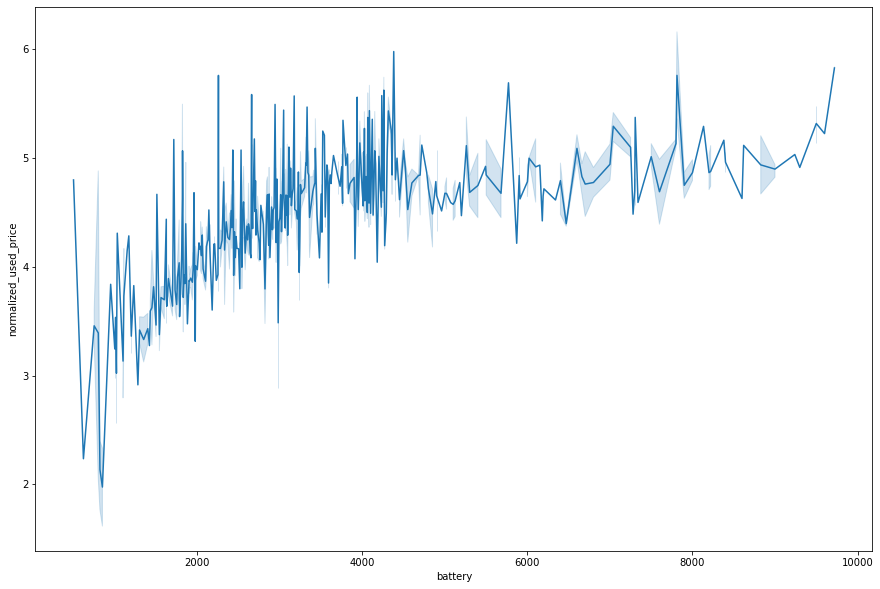

In [172]:
sns.relplot(data=df,y='normalized_used_price',x='battery',hue='os',height=10, aspect=1.4)
plt.show()

plt.figure(figsize=(15,10))
sns.lineplot(data=df, y="normalized_used_price", x="battery")
plt.show()

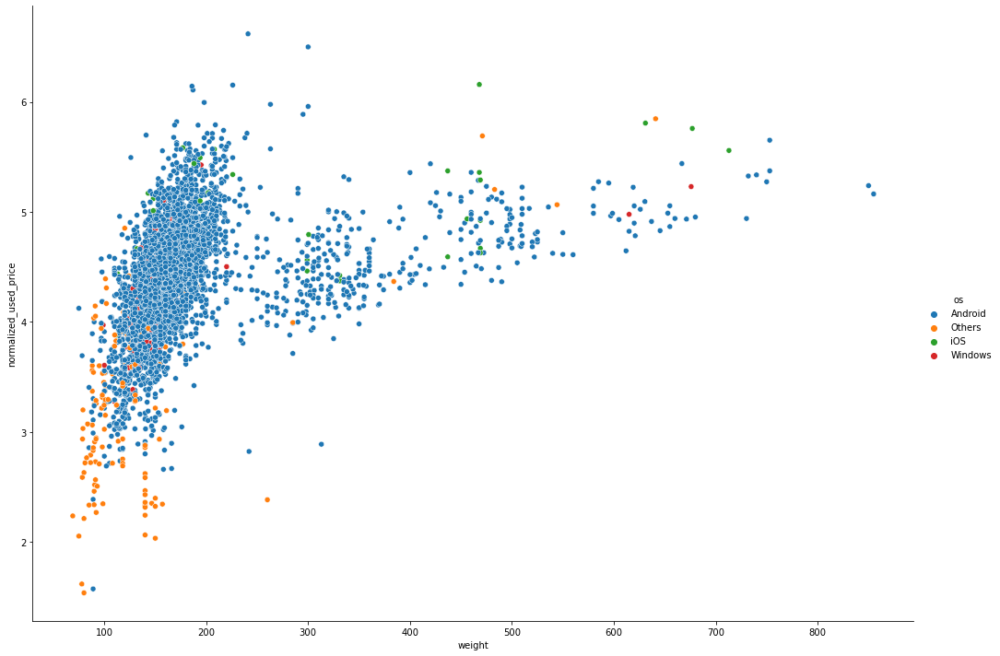

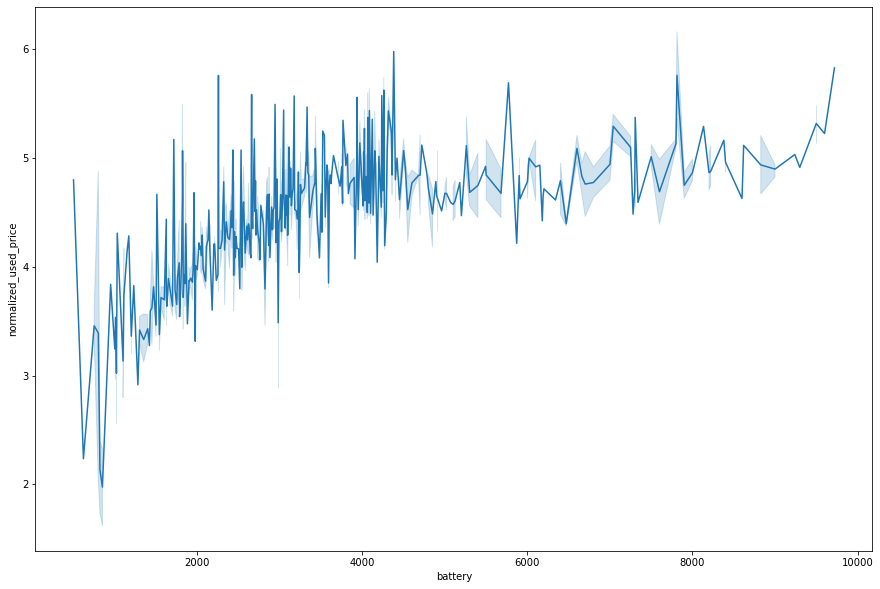

In [173]:
sns.relplot(data=df,y='normalized_used_price',x='weight',hue='os',height=10, aspect=1.4)
plt.show()

plt.figure(figsize=(15,10))
sns.lineplot(data=df, y="normalized_used_price", x="battery")
plt.show()

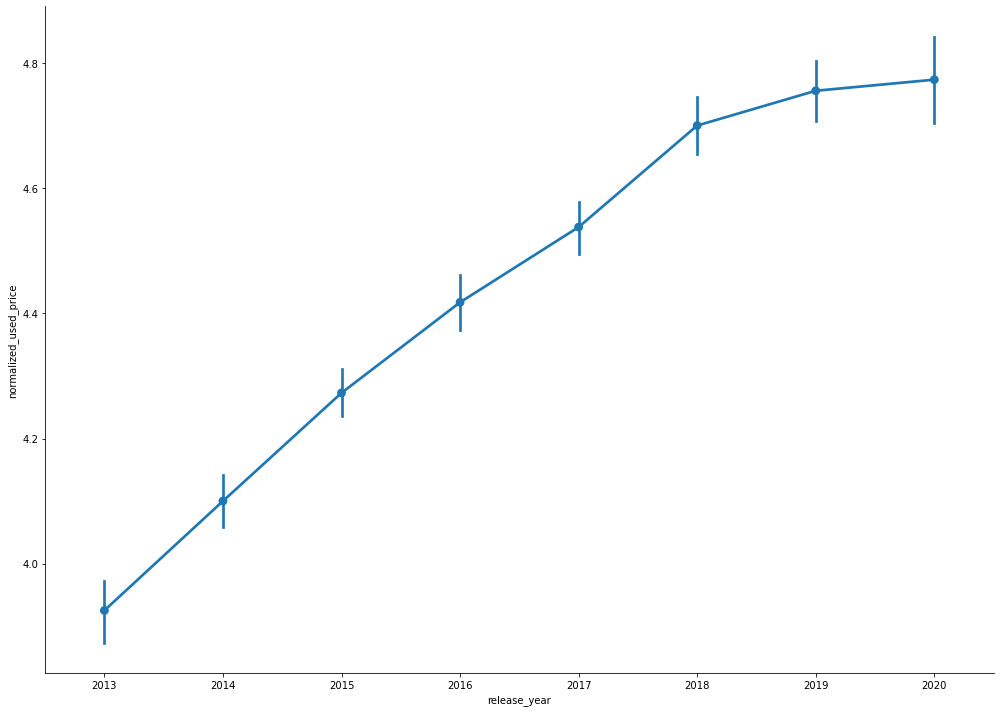

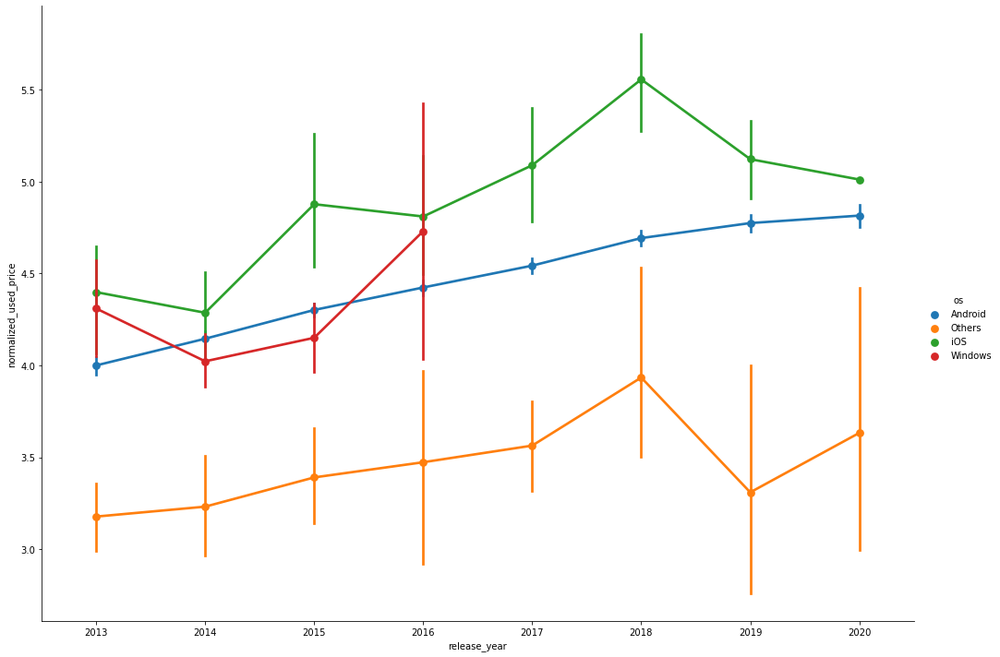

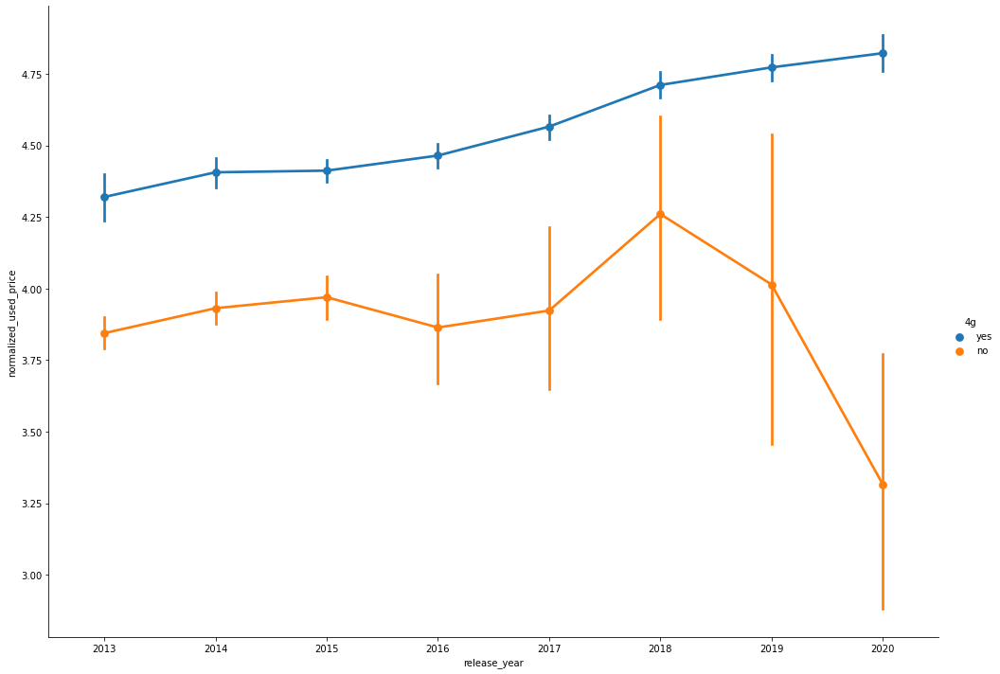

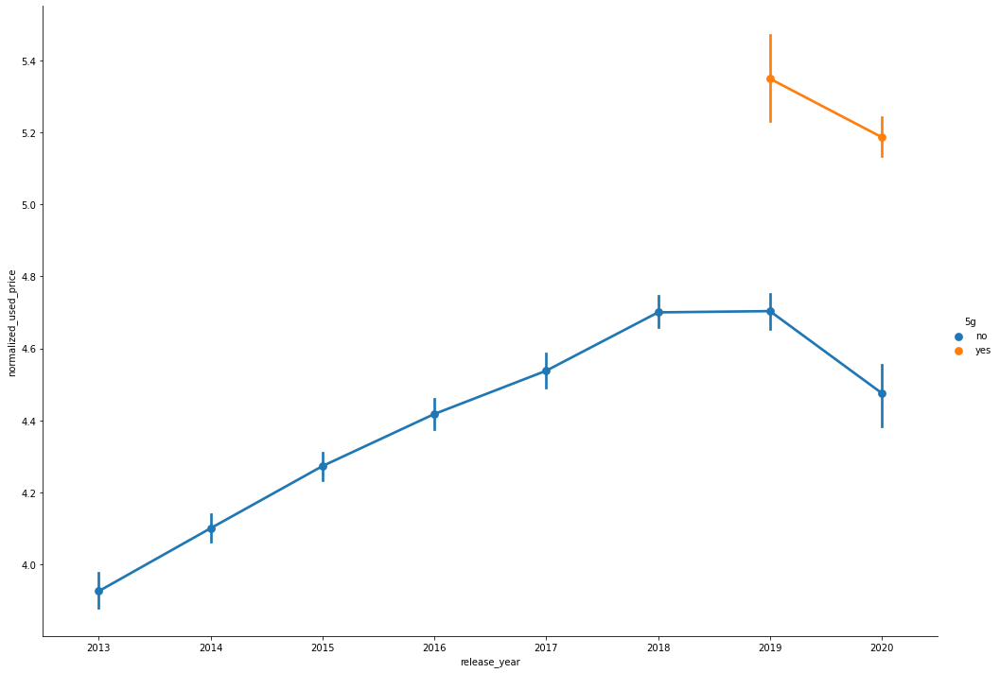

In [174]:
sns.catplot(data=df, kind="point", y="normalized_used_price", x="release_year",height=10, aspect=1.4)
plt.show()

sns.catplot(data=df, kind="point", y="normalized_used_price", x="release_year",hue='os',height=10, aspect=1.4)
plt.show()

sns.catplot(data=df, kind="point", y="normalized_used_price", x="release_year",hue='4g',height=10, aspect=1.4)
plt.show()

sns.catplot(data=df, kind="point", y="normalized_used_price", x="release_year",hue='5g',height=10, aspect=1.4)
plt.show()

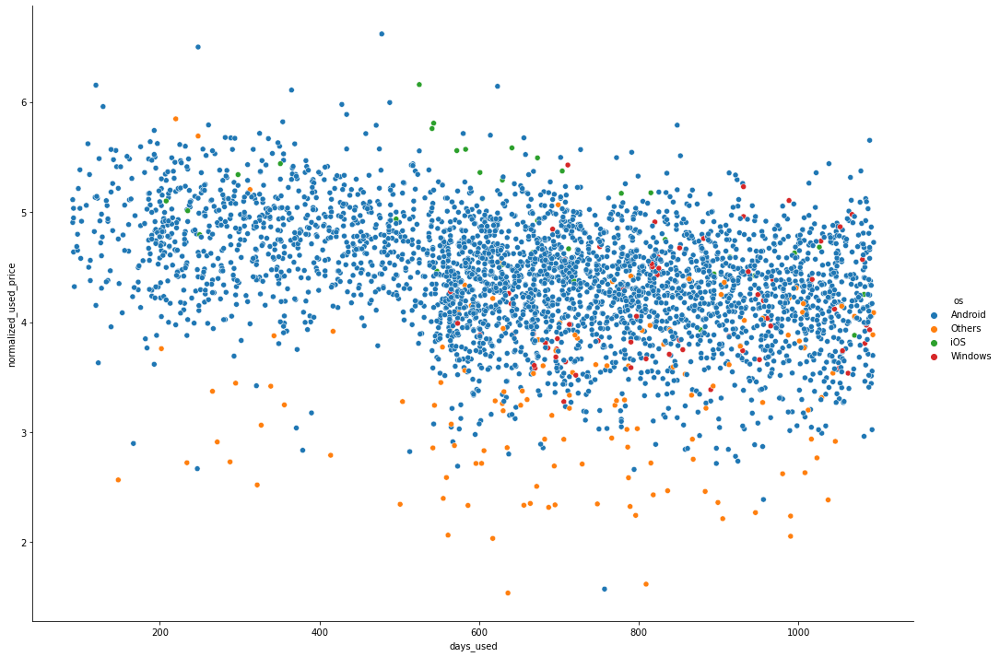

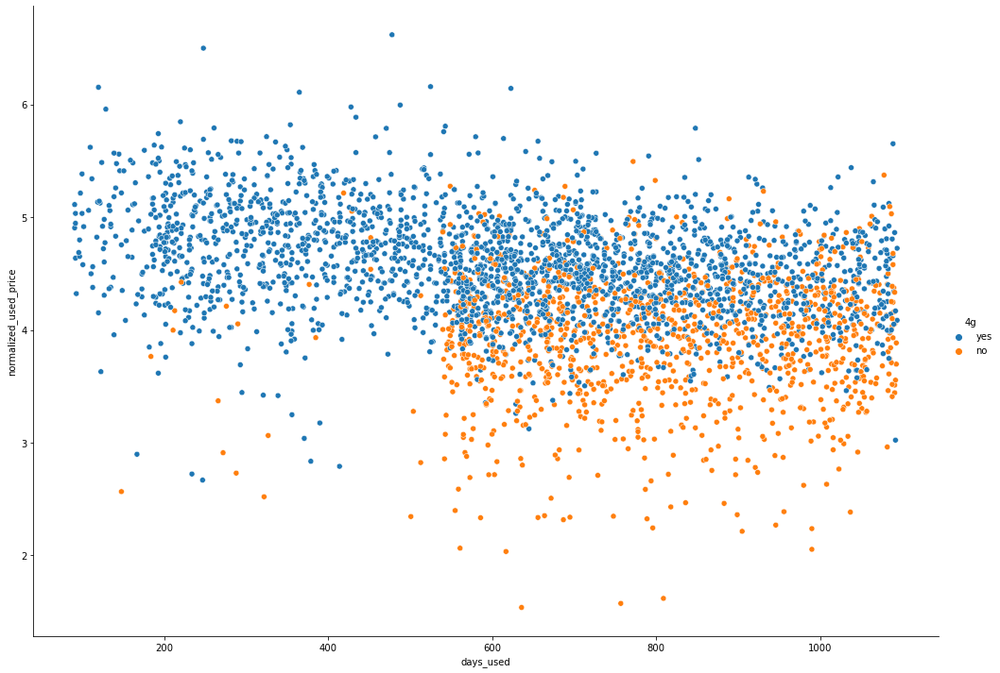

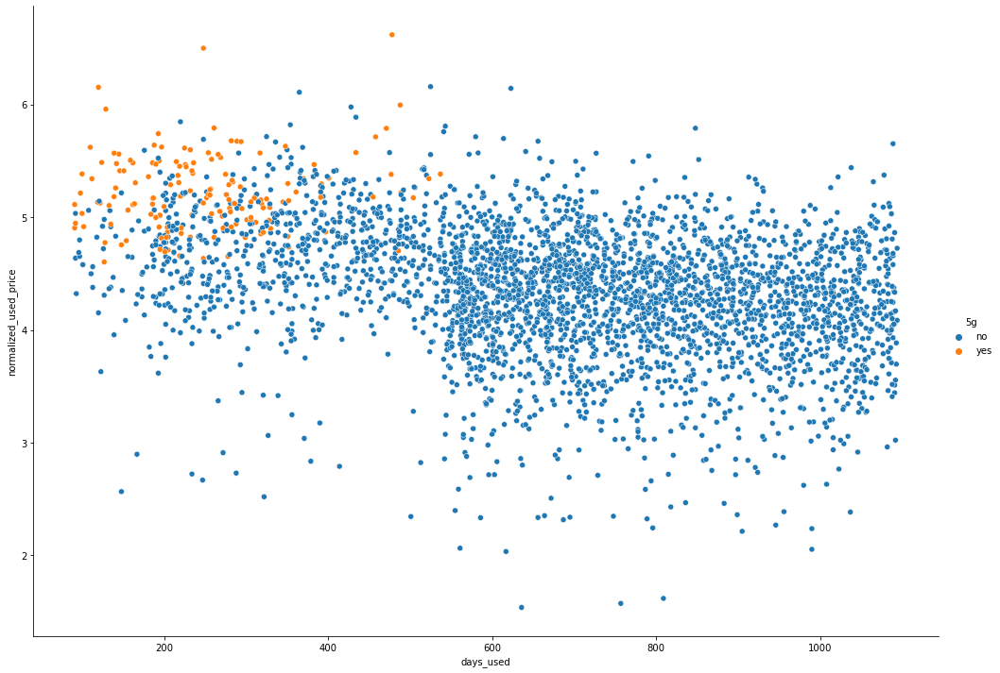

In [175]:
sns.relplot(data=df, y="normalized_used_price", x="days_used",hue='os',height=10, aspect=1.4)
plt.show()

sns.relplot(data=df, y="normalized_used_price", x="days_used",hue='4g',height=10, aspect=1.4)
plt.show()

sns.relplot(data=df, y="normalized_used_price", x="days_used",hue='5g',height=10, aspect=1.4)
plt.show()

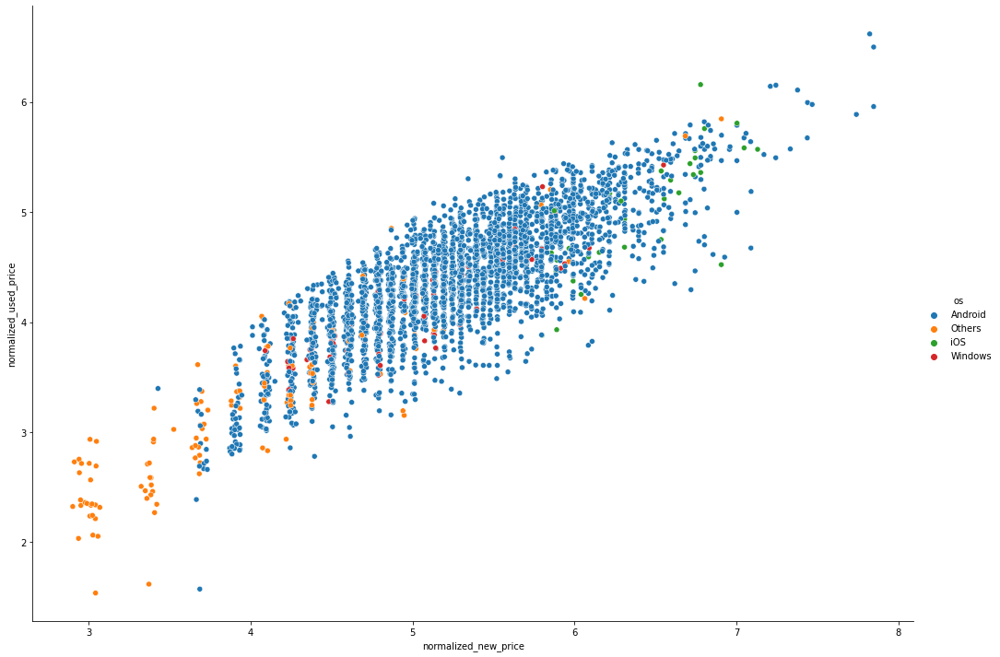

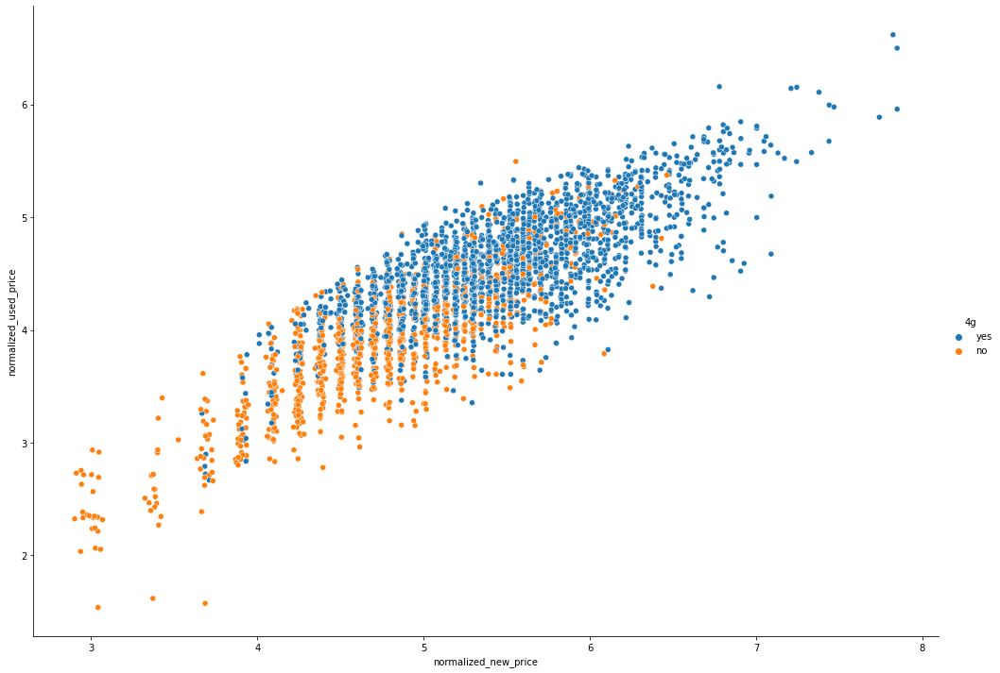

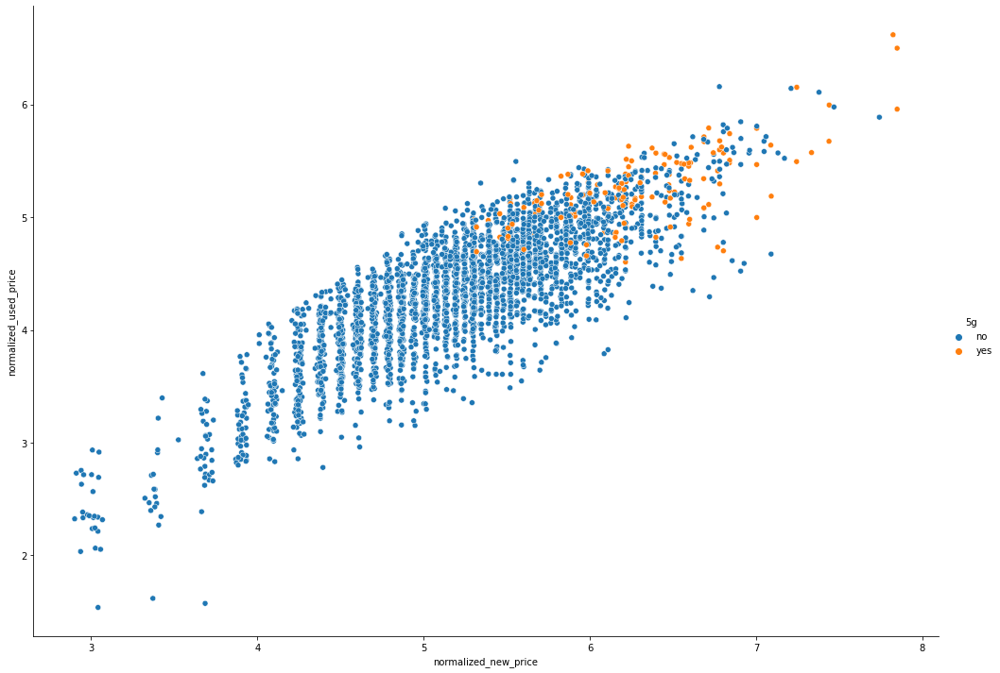

In [176]:
sns.relplot(data=df, y="normalized_used_price", x="normalized_new_price",hue='os',height=10, aspect=1.4)
plt.show()

sns.relplot(data=df, y="normalized_used_price", x="normalized_new_price",hue='4g',height=10, aspect=1.4)
plt.show()

sns.relplot(data=df, y="normalized_used_price", x="normalized_new_price",hue='5g',height=10, aspect=1.4)
plt.show()

#### Observations:

`brand_name` vs `normalized_used_price`
- Across all brands, the normalized price is generally between 4.00 to 5.00 euro. The top brands are ranging close to 4.50 euro.

`screen_size` vs `normalized_used_price`
- An upward trend can be seen on the line plot.
- Large concentration of used devices is of size between 10 and 20 cm, where majority of them has 4g.
- It can also be seen that used devices that has 5g only has sizes between 15 to 20 cm.

`4g`/`5g` vs `normalized_used_price`
- We can see that there are more used devices, by a considerable amount, that has 4g then those didn't have, swarming between 4.00 to 5.00 euro.
- Meanwhile majority of the used devices doesn't has 5g, though still swarming between 4.00 to 5.00 euro.

`main_camera_mp`/`selfie_camera_mp` vs `normalized_used_price`
- Both rear and front camera has an upward trend of price as the resolution increases but starts to flatten out at a price of 5.00 euro
- Prices are generally between 3.00 to 5.00 euro, swarming close to 4.50 euro.

`int_memory` vs `normalized_used_price`
- A lot of used devices are sold in a given amount of memory, namely 16, 32, 64, and 128GB. 
- The line plot does show a slight upward trend.

`ram` vs `normalized_used_price`
- Another upward trend as ram increases.
- A significantly large concentration of used devices has 4GB of RAM, priced at an average of around 4.30 euro.
- Used devices that has 5G only has RAM of at least 6GB and above.

`battery` vs `normalized_used_price`
- A steady upward trend of price as batter capacity increases and then stabilize around 5.00 euro

`weight` vs `normalized_used_price`
- Similar to `battery`, price increases as weight increases but stabilizes at 5.00 euro.
- Additionally, a large cluster of used devices weigh between 100 to 300 grams.

`release_year` vs `normalized_used_price`
- It can be seen that price increased over the years. But it does show signs of flattening on year 2019 onwards.
- Price were ups and downs for IOS devices but generally upward trend.
- A steady upwards for Androids.
- After the year 2018, price increasingly differs depending whether 4g is available or not.
- However, whether 5g is available or not, prices seems to be decreasing after the year 2018. 

`days_used` vs `normalized_used_price`
- No signs of patterns detected.
- Devices, whether it has 4g available or not, are mostly priced between 3.00 to 6.00 euro. 
- Devices that has 5g has at most 600 of days used.

`normalized_new_price` vs `normalized_used_price`
- A positvely linear relationship can be seen.










**Some further domain-knowledge analysis:**

(3) How does the amount of RAM vary with the brand?

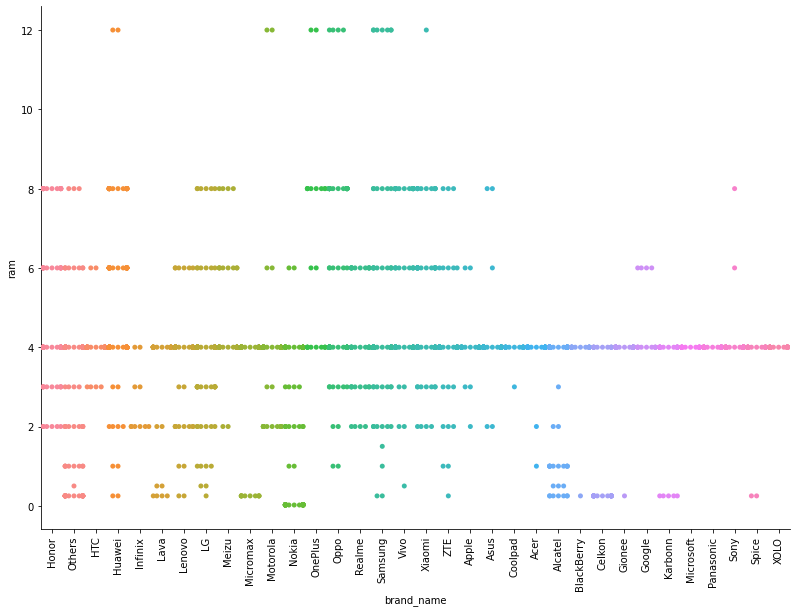

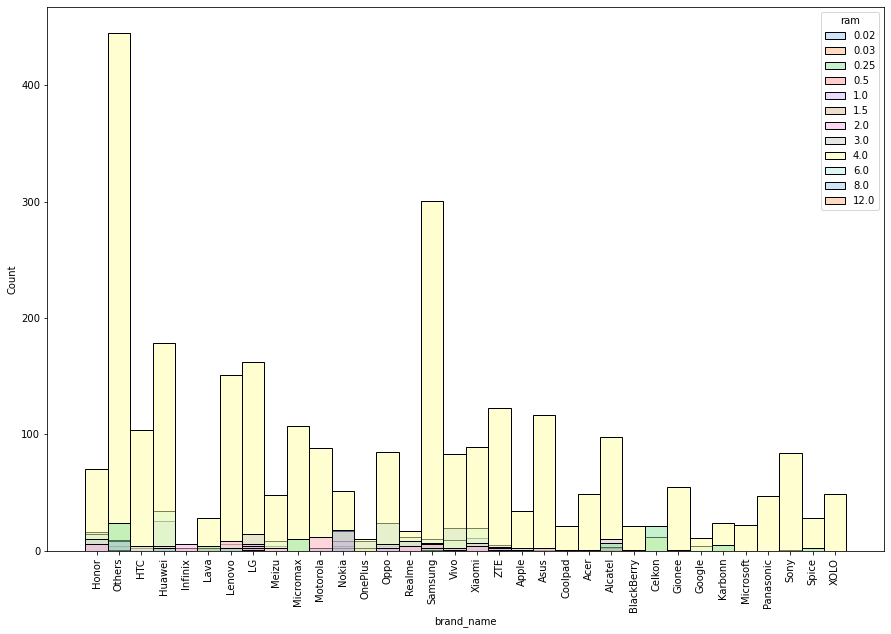

In [177]:
sns.catplot(data=df, kind="swarm", y="ram", x="brand_name",height=8, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(15,10));
sns.histplot(data=df,x='brand_name',hue='ram',palette='pastel')
plt.xticks(rotation=90);
plt.show();

In [178]:
df['ram'].value_counts()

4.00     2815
6.00      154
8.00      130
2.00       90
0.25       83
3.00       81
1.00       34
12.00      18
0.02       18
0.03       17
0.50        9
1.50        1
Name: ram, dtype: int64

(4) How does the weight vary for phones and tablets offering large batteries (more than 4500 mAh)?

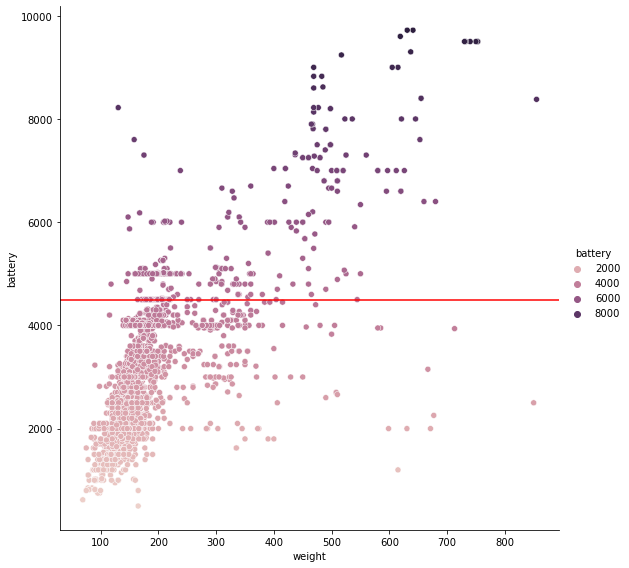

In [179]:
sns.relplot(data=df,x="weight", y="battery", hue="battery",height=8,aspect=1)
plt.axhline(4500,color='red')
plt.show()

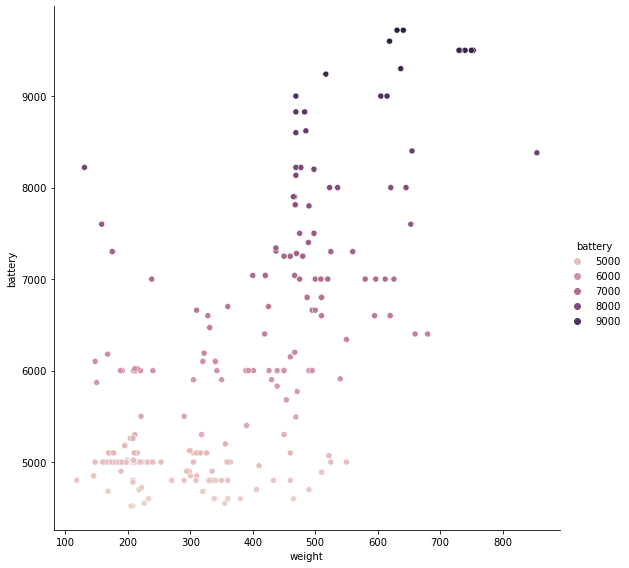

In [180]:
df4500mah = df[df['battery']>4500]

sns.relplot(data=df4500mah,x="weight", y="battery", hue="battery",height=8,aspect=1)
plt.show();

(5) How many phones and tablets are available across different brands with a screen size larger than 6 inches?

In [181]:
df6inch = df[df['screen_size'] > 15.24]
df6inch['brand_name'].value_counts()

Huawei       149
Samsung      119
Others        99
Vivo          80
Honor         72
Oppo          70
Xiaomi        69
Lenovo        69
LG            59
Motorola      42
Asus          41
Realme        40
Alcatel       26
Apple         24
Acer          19
ZTE           17
Meizu         17
OnePlus       16
Nokia         15
Sony          12
Infinix       10
HTC            7
Micromax       7
Google         4
Coolpad        3
Gionee         3
XOLO           3
Karbonn        2
Panasonic      2
Spice          2
Microsoft      1
Name: brand_name, dtype: int64

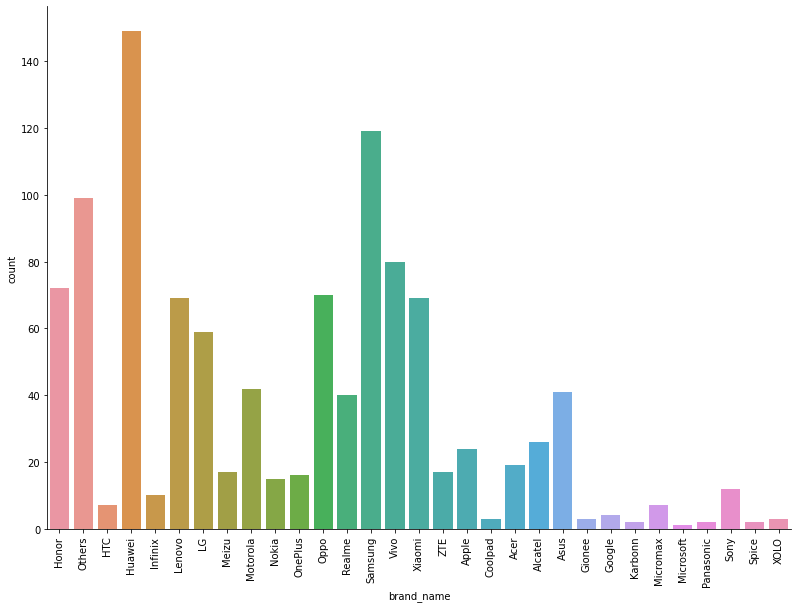

In [182]:
sns.catplot(data=df6inch, kind="count",x='brand_name',height=8, aspect=1.4);
plt.xticks(rotation=90)
plt.show();

In [183]:
df6inch['brand_name'].value_counts().sum()

1099

(6) What is the distribution of devices offering greater than 8MP selfie cameras across brands?

In [184]:
df8MP = df[df['selfie_camera_mp']>8]
df8MP['brand_name'].value_counts()

Huawei        87
Vivo          78
Oppo          75
Xiaomi        63
Samsung       57
Honor         41
Others        34
LG            32
Motorola      26
Meizu         24
HTC           20
ZTE           20
Realme        18
OnePlus       18
Lenovo        14
Sony          14
Nokia         10
Asus           6
Infinix        4
Gionee         4
Coolpad        3
BlackBerry     2
Micromax       2
Panasonic      2
Acer           1
Name: brand_name, dtype: int64

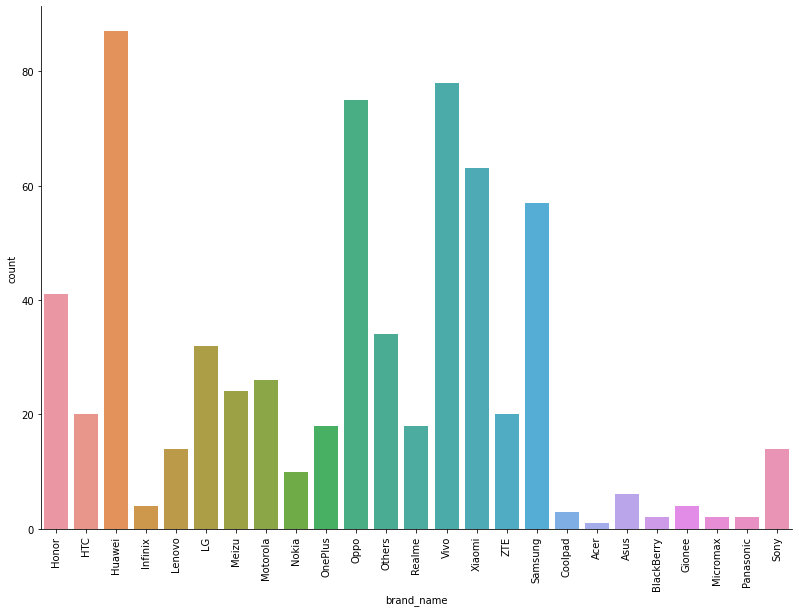

In [185]:
sns.catplot(data=df8MP, kind="count",x='brand_name',height=8, aspect=1.4);
plt.xticks(rotation=90)
plt.show();

In [186]:
df8MP['brand_name'].value_counts().sum()

655

(7) Which attributes are highly correlated with the normalized price of a used device?

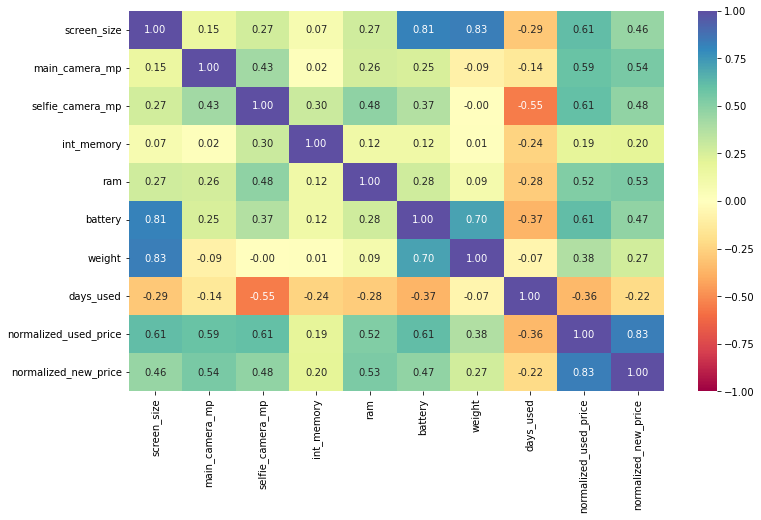

In [187]:
num_cols = df.select_dtypes(include=np.number).columns.tolist()
num_cols.remove("release_year")
plt.figure(figsize=(12, 7))
sns.heatmap(
    df[num_cols].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral"
)
plt.show()

#### Observations

(3)
- Across all the `brand_name` most of the used phones/tablets has 4GB RAM, 2815 of the devices.
- The top number of devices being 'Others', followed by 'Samsung'.

(4)
- There is a slightly strong positive linear relationship between battery and weight.
- We can also see the smooth change of the colour intensity, showing that the larger the battery capacity the heavier the phone/tablet is.
- Cutting out battery capacity that has more than 4500mAh and plot it, we see again positively linear relationship.

(5)
- Huawei has the most phones, 149 used phones/tablets, that has screen size larger than 6 inches.
- Samsung comes after with a total of 119 used phones/tablets.
- Notable brands, which are in fact known brands, Honor, Lenovo, Vivo, Xiaomi, Oppo, and Others have considerable amount of phones/tablets with screen size larger than 6 inches.
- A total of 1099 phones/tablets has more than 6 inches screen size.

(6)
- Again notable known brands are Huawei, Vivo, Oppo, Xiaomi, Samsung, Honor and Others, have a good amount of phones/tablets' selfie camera with more than 8MP.

(7)
- `normalized_used_price` is highly positively correlated with `normalized_new_price`.
- `screen_size`, `main_camera_mp`, `selfie_camera_mp`, `ram`, `battery` also show slightly strong positive linear relationship with `normalized_used_price`.
- In addition, `screen_size` is highly positively correlated with `battery` and `weight`.
- Similarly, `battery` is slightly strong positively correlated with `weight`.
- `selfie_camera_mp` is slightly negatively correlated with `days_used`.


## Data Preprocessing

#### 1) Missing value treatment

In [5]:
# counting the number of missing values and also shows its percentage of the total
pd.DataFrame({'Count':df.isnull().sum()[df.isnull().sum()>0],'Percentage':(df.isnull().sum()[df.isnull().sum()>0]/df.shape[0])*100})

,Count,Percentage
main_camera_mp,179,5.182397
selfie_camera_mp,2,0.057904
int_memory,4,0.115808
ram,4,0.115808
battery,6,0.173712
weight,7,0.202664


In [6]:
df.isnull().sum()

brand_name                 0
os                         0
screen_size                0
4g                         0
5g                         0
main_camera_mp           179
selfie_camera_mp           2
int_memory                 4
ram                        4
battery                    6
weight                     7
release_year               0
days_used                  0
normalized_used_price      0
normalized_new_price       0
dtype: int64

First looking at the nature of the data.

In [7]:
df.loc[df['main_camera_mp'].isnull()==True]

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
59,Infinix,Android,17.32,yes,no,NaN,8.0,32.0,2.0,6000.0,209.0,2020,245,4.282068,4.597642
60,Infinix,Android,15.39,yes,no,NaN,8.0,64.0,4.0,5000.0,185.0,2020,173,4.363608,4.711780
61,Infinix,Android,15.39,yes,no,NaN,8.0,32.0,2.0,5000.0,185.0,2020,256,4.181439,4.505460
62,Infinix,Android,15.39,yes,no,NaN,16.0,32.0,3.0,4000.0,178.0,2019,316,4.555244,4.602166
63,Infinix,Android,15.29,yes,no,NaN,16.0,32.0,2.0,4000.0,165.0,2019,468,4.416670,4.871297
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3411,Realme,Android,15.34,yes,no,NaN,16.0,64.0,4.0,4000.0,183.0,2019,503,4.570475,5.159974
3412,Realme,Android,15.32,yes,no,NaN,16.0,64.0,4.0,4035.0,184.0,2019,433,4.521027,5.074424
3413,Realme,Android,15.32,yes,no,NaN,25.0,64.0,4.0,4045.0,172.0,2019,288,4.778199,4.966753
3448,Asus,Android,16.74,yes,no,NaN,24.0,128.0,8.0,6000.0,240.0,2019,325,5.715316,7.059317


In [191]:
df.loc[df['selfie_camera_mp'].isnull()==True]

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
1080,Google,Android,15.32,yes,no,12.2,NaN,64.0,4.0,3430.0,184.0,2018,475,5.573826,6.865974
1081,Google,Android,12.83,yes,no,12.2,NaN,64.0,4.0,2915.0,148.0,2018,424,4.464988,6.745083


In [192]:
df.loc[df['int_memory'].isnull()==True]

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
117,Nokia,Others,5.18,yes,no,0.3,0.0,NaN,0.02,1200.0,86.5,2019,234,2.721295,3.688379
2035,Nokia,Others,5.18,no,no,5.0,0.0,NaN,0.03,1020.0,157.0,2019,501,2.343727,3.420346
2064,Nokia,Others,5.18,no,no,0.3,0.0,NaN,0.02,1100.0,78.4,2015,559,2.587012,3.378611
2092,Nokia,Others,7.62,no,no,5.0,0.0,NaN,0.02,1010.0,100.0,2013,1043,3.535728,4.370586


In [193]:
df.loc[df['ram'].isnull()==True]

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
114,Nokia,Others,5.18,no,no,0.3,0.0,0.06,NaN,1020.0,91.3,2020,288,2.729159,2.911263
335,Nokia,Others,5.18,no,no,0.3,0.0,0.10,NaN,1200.0,88.2,2020,327,3.062924,3.689129
2059,Nokia,Others,5.18,no,no,0.3,0.0,0.06,NaN,NaN,82.6,2016,1023,2.765060,3.657905
2090,Nokia,Others,7.62,no,no,5.0,0.0,0.06,NaN,1200.0,111.4,2013,1001,3.827771,4.605770


In [194]:
df.loc[df['battery'].isnull()==True]

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
1829,Meizu,Android,12.83,yes,no,13.0,5.0,16.00,4.00,NaN,145.0,2014,986,4.177919,4.863604
1831,Meizu,Android,12.83,yes,no,20.7,5.0,16.00,4.00,NaN,158.0,2014,1043,4.878855,5.990639
1832,Meizu,Android,13.61,yes,no,20.7,2.0,16.00,4.00,NaN,147.0,2014,1007,4.742320,5.826118
1962,Microsoft,Windows,25.55,no,no,5.0,3.5,32.00,4.00,NaN,675.9,2013,931,5.230574,5.802753
2058,Nokia,Others,5.18,no,no,0.3,0.0,0.06,0.02,NaN,81.0,2016,815,2.718660,3.374511
2059,Nokia,Others,5.18,no,no,0.3,0.0,0.06,NaN,NaN,82.6,2016,1023,2.765060,3.657905


In [195]:
df.loc[df['weight'].isnull()==True]

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
3002,XOLO,Android,12.70,yes,no,13.0,5.0,32.0,4.0,2400.0,NaN,2015,576,4.165890,4.930437
3003,XOLO,Android,12.83,yes,no,8.0,5.0,16.0,4.0,3200.0,NaN,2015,800,4.282068,5.189228
3004,XOLO,Android,12.70,no,no,8.0,2.0,32.0,4.0,2100.0,NaN,2015,878,3.879706,4.081090
3005,XOLO,Android,10.29,no,no,5.0,0.3,32.0,4.0,1800.0,NaN,2015,1036,3.823847,4.396053
3006,XOLO,Android,12.70,no,no,5.0,0.3,16.0,4.0,2500.0,NaN,2015,679,3.837084,4.347176
3007,XOLO,Windows,12.70,no,no,8.0,2.0,32.0,4.0,2200.0,NaN,2015,838,3.707210,4.791733
3008,XOLO,Android,12.70,no,no,8.0,5.0,32.0,4.0,2500.0,NaN,2015,1045,4.184642,4.785406


- Dropping rows containing missing values might not be preferred especially for `main_camera_mp` variable. Main reason, based on personal judgement, is that these phones/tablets has considerable amount of days used which can be valuable data to our objective of interest.
- Based on observations above we will impute missing values with the median value after grouping by release year and brand name. Since brands tends to change or introduce new specs/designs every year or so and each brand has its own uniqueness.

In [8]:
imputeddf = data.copy()

# columns to impute
cols_impute = ['main_camera_mp', 'selfie_camera_mp','int_memory','ram','battery','weight']

In [9]:
# groupby release year and brand name
for col in cols_impute:
    imputeddf[col] = imputeddf[col].fillna(
        value=imputeddf.groupby(['release_year', 'brand_name'])[col].transform("median")
    ) 

In [198]:
# check remaining missing values
imputeddf.isnull().sum()

brand_name                 0
os                         0
screen_size                0
4g                         0
5g                         0
main_camera_mp           179
selfie_camera_mp           2
int_memory                 0
ram                        0
battery                    6
weight                     7
release_year               0
days_used                  0
normalized_used_price      0
normalized_new_price       0
dtype: int64

- There are still missing values, we will then group by brand name only and impute the column median.

In [10]:
# groupby brand name
for col in cols_impute:
    imputeddf[col] = imputeddf[col].fillna(
        value=imputeddf.groupby(['brand_name'])[col].transform("median")
    )

In [200]:
# check remaining missing values
imputeddf.isnull().sum()

brand_name                0
os                        0
screen_size               0
4g                        0
5g                        0
main_camera_mp           10
selfie_camera_mp          0
int_memory                0
ram                       0
battery                   0
weight                    0
release_year              0
days_used                 0
normalized_used_price     0
normalized_new_price      0
dtype: int64

- Last remaining missing values will be imputed by its median column.

In [11]:
# fill in median
imputeddf["main_camera_mp"] = imputeddf["main_camera_mp"].fillna(imputeddf["main_camera_mp"].median())

In [202]:
# check remaining missing values
imputeddf.isnull().sum()

brand_name               0
os                       0
screen_size              0
4g                       0
5g                       0
main_camera_mp           0
selfie_camera_mp         0
int_memory               0
ram                      0
battery                  0
weight                   0
release_year             0
days_used                0
normalized_used_price    0
normalized_new_price     0
dtype: int64

- All missing values are imputed accordingly.

#### 2) Feature Engineering

- It will be interesting to see the number of years of the used device since released. Moreover, the data was collected in the year 2021, hence we will calculate the total year uptil year 2021.

In [12]:
imputeddf["years_since_release"] = 2021 - imputeddf["release_year"]
imputeddf.drop("release_year", axis=1, inplace=True)
imputeddf["years_since_release"].describe()

count    3454.000000
mean        5.034742
std         2.298455
min         1.000000
25%         3.000000
50%         5.500000
75%         7.000000
max         8.000000
Name: years_since_release, dtype: float64

#### 3) Outlier detection and treatment

- Seen in our univariate analysis there are considerable amount of outliers.
- However, outliers will be treated as true values hence no treatment taken.

#### 4) Data preperation for modelling

In [204]:
# categorize independent and dependent variable(s)
y = imputeddf["normalized_used_price"]
X = imputeddf.drop(["normalized_used_price"],axis=1)

In [205]:
# convert categorical variables into dummy variables
X = pd.get_dummies(
    X,
    columns=X.select_dtypes(include=['object','category']).columns.to_list(),
    drop_first=True)

In [206]:
# add a constant coefficient column
X = sm.add_constant(X)

In [207]:
# split data into 70:30 ratio for training and testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

## EDA

Checking the boxplot and histogram of the variables that has been imputed.

<Figure size 1080x1080 with 0 Axes>

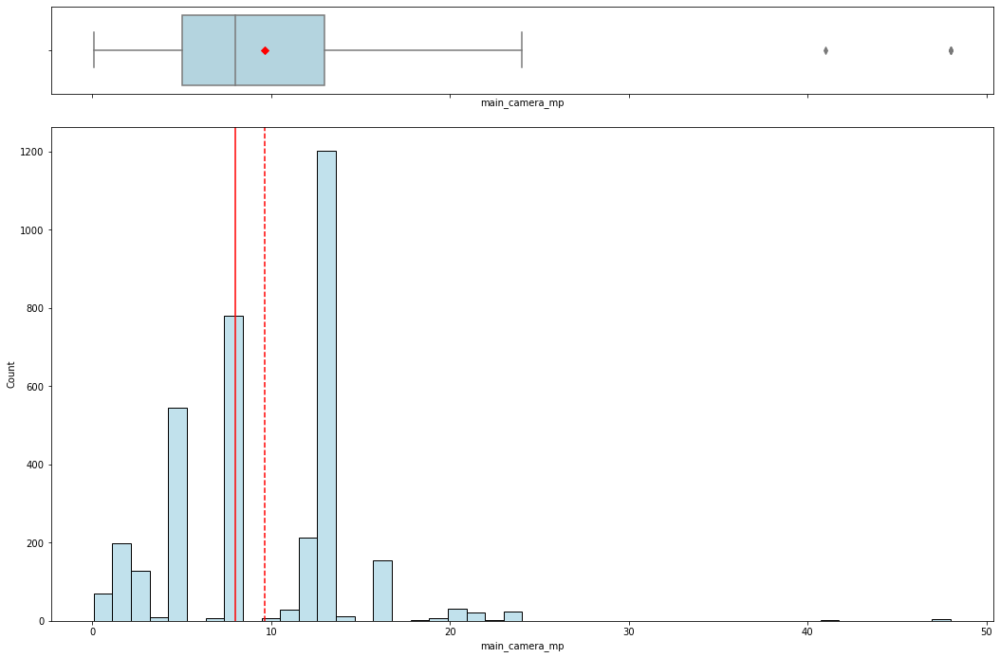

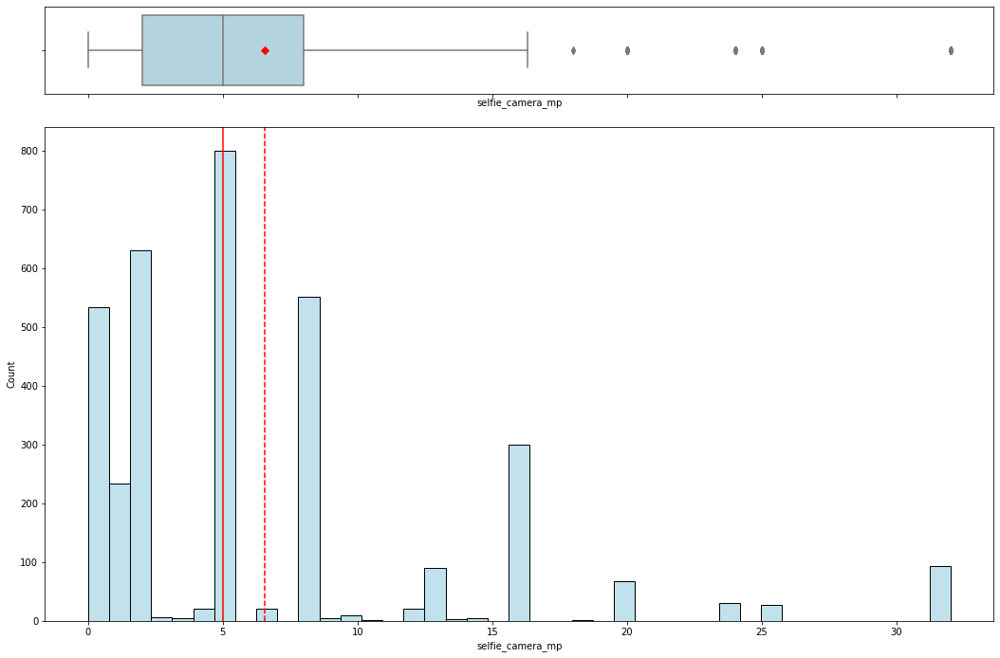

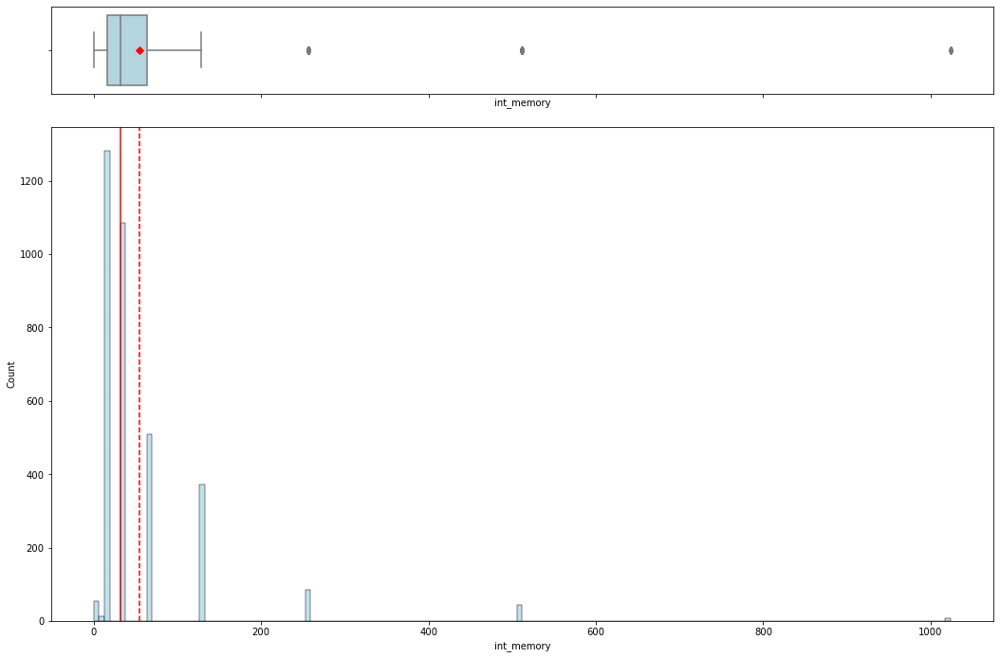

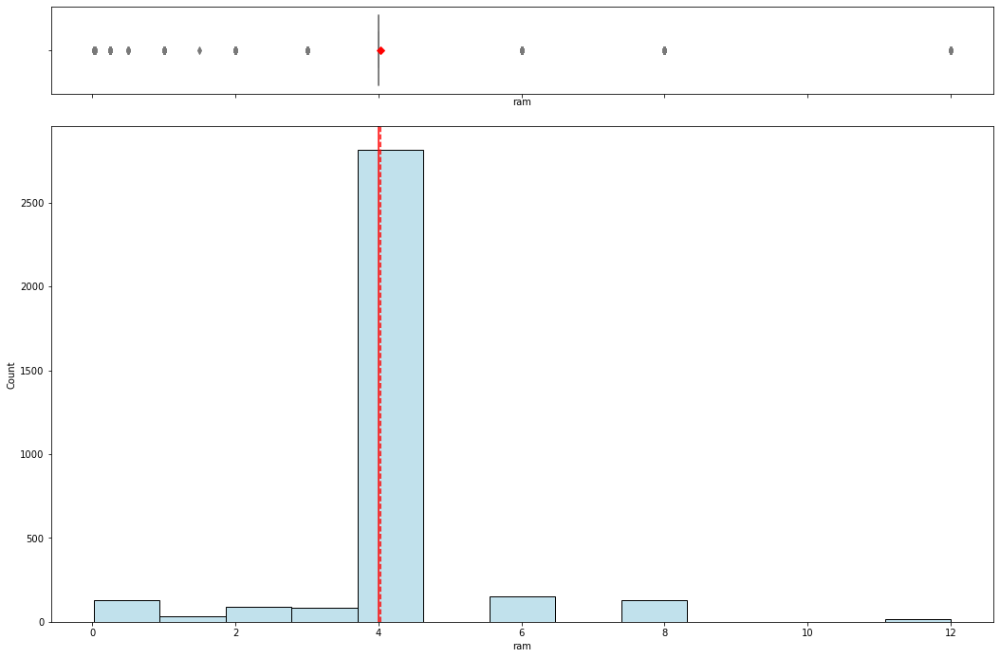

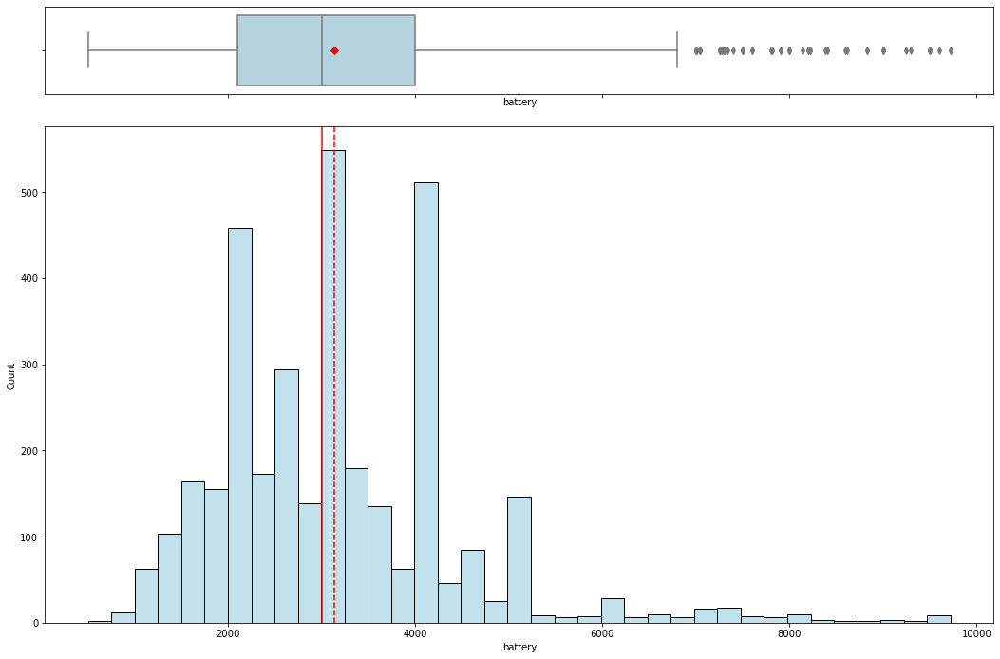

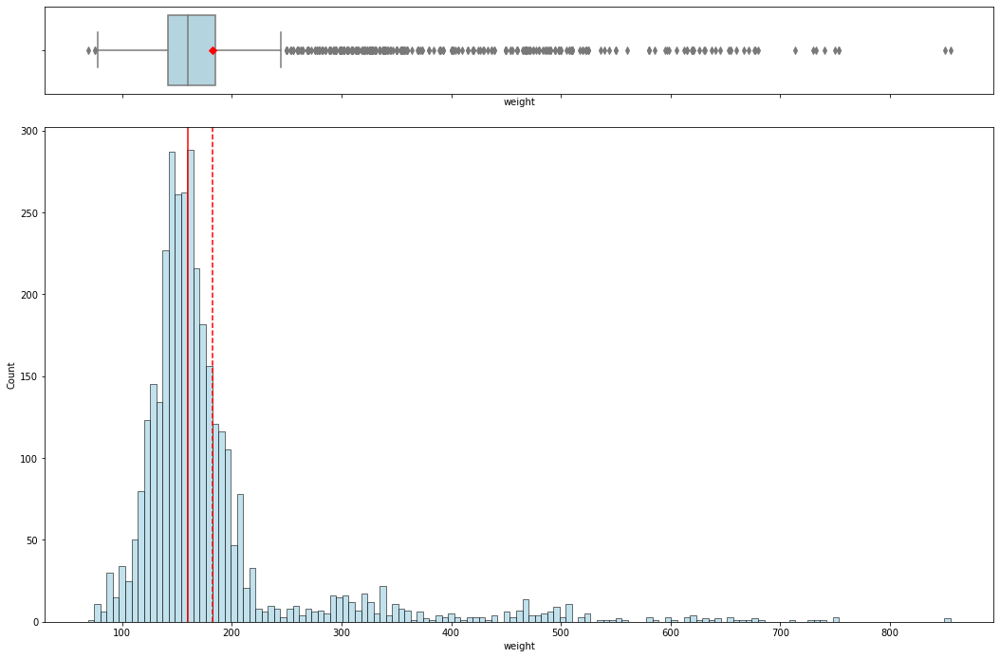

In [208]:
cols_impute = ['main_camera_mp', 'selfie_camera_mp','int_memory','ram','battery','weight']

plt.figure(figsize=(15, 15))

for i, variable in enumerate(cols_impute):
    histogram_boxplot(imputeddf,variable)
    plt.tight_layout(pad=2)

plt.show()

- No significant changes in terms of distribution. Hence we proceed with model building.

Brief look at `years_since_release`

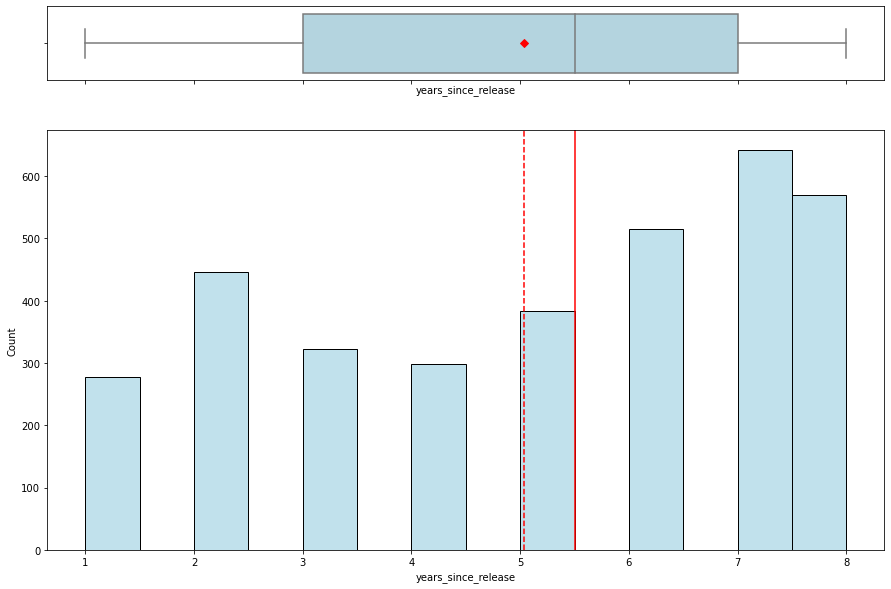

In [209]:
histogram_boxplot(imputeddf,'years_since_release')

- The distribution is slightly left-skewed.
- More on appendix for multivariate analysis.

## Model Building - Linear Regression

Starting with initial full model.

In [213]:
model1 = sm.OLS(y_train, X_train).fit()
print(model1.summary())

                              OLS Regression Results                             
Dep. Variable:     normalized_used_price   R-squared:                       0.845
Model:                               OLS   Adj. R-squared:                  0.842
Method:                    Least Squares   F-statistic:                     268.7
Date:                   Sun, 31 Jul 2022   Prob (F-statistic):               0.00
Time:                           20:03:27   Log-Likelihood:                 123.85
No. Observations:                   2417   AIC:                            -149.7
Df Residuals:                       2368   BIC:                             134.0
Df Model:                             48                                         
Covariance Type:               nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------


- Our initial model explains 84.5% of the variance in the training set, which is pretty good. 
- The value of our constant coefficient is 1.3393.

In [214]:
# checking model performance on train set
print("Training Performance\n")
model1_train_perf = model_performance_regression(model1, X_train, y_train)
model1_train_perf

Training Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.229884,0.180326,0.844886,0.841675,4.326841


In [215]:
# checking model performance on test set 
print("Test Performance\n")
model1_test_perf = model_performance_regression(model1, X_test, y_test)
model1_test_perf

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.238358,0.184749,0.842479,0.834659,4.501651


- Looking at the $R^2$ between training and testing, our initial model doesn't seem to be underfitting
- The RMSE and MAE between them being low and comparable, not showing signs of overfitting.
- Our initial model can predict `normalized_used_price` within a mean error of 0.185 (MAE) on the test data
- In addition, we are able to predict within 4.50% (MAPE) of `normalized_used_price` in the test data.


However we have to check for multicollinearity.

In [216]:
checking_vif(X_train)

,feature,VIF
0,const,227.744081
1,screen_size,7.677290
2,main_camera_mp,2.285051
3,selfie_camera_mp,2.812473
4,int_memory,1.364152
5,ram,2.282352
6,battery,4.081780
7,weight,6.396749
8,days_used,2.660269
9,normalized_new_price,3.119430


- 'brand_name_Apple' and 'os_iOS' has high value of VIF.

We will use our pre-defined function to remove features that has VIF > 10, but in a step-by-step fashion.

In [217]:
col_list = ["brand_name_Apple", "os_iOS"]

res = treating_multicollinearity(X_train, y_train, col_list)
res

,col,Adj. R-squared after_dropping col,RMSE after dropping col
0,brand_name_Apple,0.841809,0.232201
1,os_iOS,0.841795,0.232211


- Our $adjusted R^2$ doesn't change much after dropping either one of those features, so we choose to drop 'brand_name_Apple' first.

In [218]:
# dropping 'brand_name_Apple'
col_to_drop = "brand_name_Apple"
X_train2 = X_train.loc[:, ~X_train.columns.str.startswith(col_to_drop)]
X_test2 = X_test.loc[:, ~X_test.columns.str.startswith(col_to_drop)]

# Check VIF now
vif = checking_vif(X_train2)
print("VIF after dropping ", col_to_drop)
vif

VIF after dropping  brand_name_Apple


,feature,VIF
0,const,227.303871
1,screen_size,7.643583
2,main_camera_mp,2.284429
3,selfie_camera_mp,2.791121
4,int_memory,1.364138
5,ram,2.273686
6,battery,4.079720
7,weight,6.394014
8,days_used,2.659799
9,normalized_new_price,3.102417


- All features are all below VIF value of 10. We proceed with modelling.

In [219]:
model2 = sm.OLS(y_train, X_train2).fit()
print(model2.summary())

                              OLS Regression Results                             
Dep. Variable:     normalized_used_price   R-squared:                       0.845
Model:                               OLS   Adj. R-squared:                  0.842
Method:                    Least Squares   F-statistic:                     274.5
Date:                   Sun, 31 Jul 2022   Prob (F-statistic):               0.00
Time:                           20:03:28   Log-Likelihood:                 123.85
No. Observations:                   2417   AIC:                            -151.7
Df Residuals:                       2369   BIC:                             126.2
Df Model:                             47                                         
Covariance Type:               nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------


- $adjusted R^2$ did not change between our initial model and current model so the dropped feature did not affect the model.
- Since multicollinearity has been dealt, we move on to the significance of the features.

We will be using a step-wise algorithm that first removes the feature that has the highest p-value, then fit the model. Then search for the next highest p-value and remove it. Repeating the process until all features has p-value of less than 0.05.

In [220]:
# initial list of columns
predictors = X_train2.copy()
cols = predictors.columns.tolist()

# setting an initial max p-value
max_p_value = 1

while len(cols) > 0:
    # defining the train set
    X_train_aux = predictors[cols]

    # fitting the model
    model = sm.OLS(y_train, X_train_aux).fit()

    # getting the p-values and the maximum p-value
    p_values = model.pvalues
    max_p_value = max(p_values)

    # name of the variable with maximum p-value
    feature_with_p_max = p_values.idxmax()

    if max_p_value > 0.05:
        cols.remove(feature_with_p_max)
    else:
        break

selected_features = cols
print(selected_features)

['const', 'screen_size', 'main_camera_mp', 'selfie_camera_mp', 'ram', 'battery', 'weight', 'normalized_new_price', 'years_since_release', 'brand_name_Lenovo', 'brand_name_Nokia', 'brand_name_Xiaomi', 'os_Others', '4g_yes']


In [221]:
X_train3 = X_train2[selected_features]
X_test3 = X_test2[selected_features]

In [222]:
model3 = sm.OLS(y_train, X_train3).fit()
print(model3.summary())

                              OLS Regression Results                             
Dep. Variable:     normalized_used_price   R-squared:                       0.842
Model:                               OLS   Adj. R-squared:                  0.842
Method:                    Least Squares   F-statistic:                     988.1
Date:                   Sun, 31 Jul 2022   Prob (F-statistic):               0.00
Time:                           20:03:28   Log-Likelihood:                 104.71
No. Observations:                   2417   AIC:                            -181.4
Df Residuals:                       2403   BIC:                            -100.4
Df Model:                             13                                         
Covariance Type:               nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
co

- All selected features now has p-value of less than 0.05, so model3 will be our final model with features in X_train3.

## Model Performance Check

In [223]:
# checking model performance on train set
print("Training Performance\n")
model3_train_perf = model_performance_regression(model3, X_train3, y_train)
model3_train_perf

Training Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.231712,0.181763,0.842409,0.841491,4.359962


In [224]:
# checking model performance on test set 
print("Test Performance\n")
model3_test_perf = model_performance_regression(model3, X_test3, y_test)
model3_test_perf

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.236807,0.18348,0.844523,0.842393,4.467055


- $R^2$ between training and testing shows no difference so no sign of underfitting.
- Also no sign of overfitting comparing RMSE and MAE.
- Our model is able to explain ~84.2% of the variance, which was the same as our initial model before. Hence no effect were seen after features were dropped.

## Checking Linear Regression Assumptions

In [225]:
# Creating a dataframe with actual, fitted and residual values
df_pred = pd.DataFrame()

df_pred["Actual Values"] = y_train  # actual values
df_pred["Fitted Values"] = model3.fittedvalues  # predicted values
df_pred["Residuals"] = model3.resid  # residuals

df_pred.head()

,Actual Values,Fitted Values,Residuals
3026,4.087488,3.855243,0.232245
1525,4.448399,4.628813,-0.180413
1128,4.315353,4.280778,0.034574
3003,4.282068,4.206270,0.075798
2907,4.456438,4.470315,-0.013877


****Linearity and Independence assumptions****

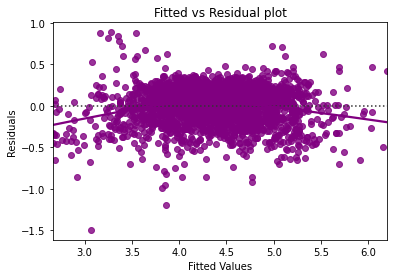

In [226]:
# Plotting the fitted values vs residuals

sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

- No signs of pattern can be seen, so linearity and independence assumption is satisfied.

****Normality assumption****

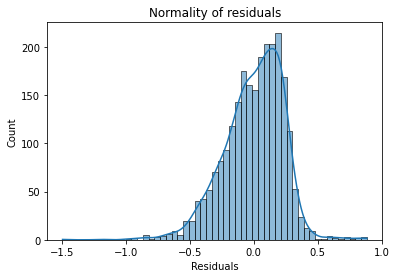

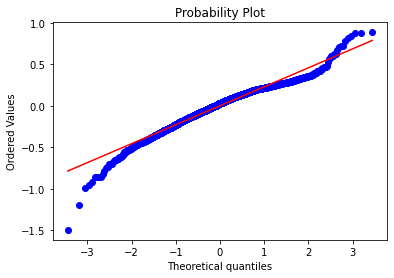

In [227]:
sns.histplot(data=df_pred, x="Residuals", kde=True)
plt.title("Normality of residuals")
plt.show()

stats.probplot(df_pred["Residuals"], dist="norm", plot=pylab)
plt.show()

- The histogram is slightly bell-shaped
- In QQ-plot, the residuals are mostly following the red straight line except both the tails.

In [228]:
stats.shapiro(df_pred["Residuals"])

ShapiroResult(statistic=0.9690961837768555, pvalue=2.130726936518395e-22)

- The p-value is less than 0.05, hence Shapiro-Wilk test shows evidence that our residuals is not normally distributed.
- However for simplicity, it can be considered approximately normal. Hence we take the assumption of normality to be satisfied.

****Homoscedasticity assumption****

In [229]:
name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(df_pred["Residuals"], X_train3)
lzip(name, test)

[('F statistic', 1.0438035947010251), ('p-value', 0.22944475832467995)]

- The p-value is greater then 0.05, hence evidence shows that the residuals are homoscedastic, so assumption is satisfied.


## Final Model

In [230]:
X_train_final = X_train3.copy()
X_test_final = X_test3.copy()

In [231]:
model_final = sm.OLS(y_train, X_train_final).fit()
print(model_final.summary())

                              OLS Regression Results                             
Dep. Variable:     normalized_used_price   R-squared:                       0.842
Model:                               OLS   Adj. R-squared:                  0.842
Method:                    Least Squares   F-statistic:                     988.1
Date:                   Sun, 31 Jul 2022   Prob (F-statistic):               0.00
Time:                           20:03:29   Log-Likelihood:                 104.71
No. Observations:                   2417   AIC:                            -181.4
Df Residuals:                       2403   BIC:                            -100.4
Df Model:                             13                                         
Covariance Type:               nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
co

In [232]:
# checking model performance on train set
print("Training Performance\n")
model_final_train_perf = model_performance_regression(model_final, X_train_final, y_train)
model_final_train_perf

Training Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.231712,0.181763,0.842409,0.841491,4.359962


In [233]:
# checking model performance on test set 
print("Test Performance\n")
model_final_test_perf = model_performance_regression(model_final, X_test_final, y_test)
model_final_test_perf

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.236807,0.18348,0.844523,0.842393,4.467055


- The final model can explain 84.2% of the variance in the data, which seems to be very good.
- The RMSE and MAE between training and test sets are low and comparable. So, our model is not suffering from overfitting.
- We are able to predict within an average difference, between actual and predicted value, of 4.47% (MAPE) of the `normalized_used_price` on the test set. The lower the value the better, which means our model is doing very well.

Model prediction.

In [234]:
# predictions on the test set
pred = model3.predict(X_test3)

df_pred_test = pd.DataFrame({"Actual": y_test, "Predicted": pred})
df_pred_test.sample(10, random_state=1)

,Actual,Predicted
1995,4.566741,4.373741
2341,3.696103,3.962922
1913,3.592093,3.690961
688,4.306495,4.116687
650,4.522115,5.137917
2291,4.259294,4.395249
40,4.997685,5.434104
1884,3.875359,4.054845
2538,4.206631,4.047439
45,5.380450,5.276715


- model_final returns a pretty decent prediction result, actual and predicted being very comparable.
- The model_final not only has good prediction but will also be great for inference purposes.

In [235]:
# Writing out the model_final equation
Equation = "normalized_used_price ="
print(Equation, end=" ")
for i in range(len(X_train3.columns)):
    if i == 0:
        print(model3.params[i], "+", end=" ")
    elif i != len(X_train3.columns) - 1:
        print(
            model3.params[i],
            "* (",
            X_train3.columns[i],
            ")",
            "+",
            end="  ",
        )
    else:
        print(model3.params[i], "* (", X_train3.columns[i], ")")

normalized_used_price = 1.3776788797811572 + 0.025631196662160606 * ( screen_size ) +  0.021211718390245778 * ( main_camera_mp ) +  0.013967722528346185 * ( selfie_camera_mp ) +  0.01747711978090722 * ( ram ) +  -1.5070246941587023e-05 * ( battery ) +  0.0009318614026860403 * ( weight ) +  0.42220450592737907 * ( normalized_new_price ) +  -0.019949882335778112 * ( years_since_release ) +  0.04915989542555471 * ( brand_name_Lenovo ) +  0.0674952282302751 * ( brand_name_Nokia ) +  0.08926855858699971 * ( brand_name_Xiaomi ) +  -0.0703946881100669 * ( os_Others ) +  0.049896454801587775 * ( 4g_yes )


## Actionable Insights and Recommendations 

Insights:

- model_final is able to explain 84.2% of the variation in the data and predicts within 4.47% of normalized used price on the test data. A very good model in terms of prediction and inference.
- An increase of a unit centimetres in screen size **increases** normalized used price by 0.0256 units, all other variables held constant.
- An increase of a unit megapixels in main camera **increases** normalized used price by 0.0212 units, all other variables held constant.
- An increase of a unit megapixels in selfie camera **increases** normalized used price by 0.0140 units, all other variables held constant.
- An increase of a unit GB in RAM **increases** normalized used price by 0.0175 units, all other variables held constant.
- An increase of a unit mAh in battery **decreases** normalized used price by 1.507 units, all other variables held constant.
- An increase of a unit gram in weight **increases** normalized used price by 0.0009 units, all other variables held constant.
- An increase of a unit euro in normalized new price **increases** normalized used price by 0.4222 units, all other variables held constant.
- An increase of a unit year in years since release **decreases** normalized used price by 0.0199 units, all other variables held constant.
- If the used device is Lenovo, normalized used price is **increased** by 0.0492 units, all other variables held constant.
- If the device is Nokia normalized used price is **increased** by 0.0675 units, all other variables held constant.
- If the device is Xiaomi normalized used price is **increased** by 0.0893 units, all other variables held constant.
- If the os of the device is 'Others' normalized used price is **decreased** by 0.0704 units, all other variables held constant.
- If the device has 4G available normalized used price is **increased** by 0.0499 units, all other variables held constant.

Recommendations:

- In terms of the magnitude of the effect, large battery capacity is not favored which directs to devices that has large battery consumption. Although in our analysis, the weight of the device does increase the value but it is by a significantly small margin. So ReCell should look for used devices which doesn't require large amount of battery power. 
- However, new devices those are expensive does increase the value of used devices.
- The higher the megapixels of either main or selfie camera, the higher the price are for used device. Evidently shows that population desire for clearer photography or videos, something that ReCell should look into.
- Larger screens and higher RAM also increases the value of the device.
- However, ReCell should be wary at devices that has been used for a long time since release as inference shows that the value will be decreased over the years.
- In terms of brands, Lenovo, Nokia, and Xiaomi devices has better value in the market.
- Devices which runs OS other than Android, iOS, and Windows will be less valuable.
- Last but not least is an interesting finding, the availability of 4G is preferrable in our analysis.

___

## Appendix

### Extra Multivariate Analysis

****We will be using imputeddf throughout this section****

1) First looking at matrix scatterplot.

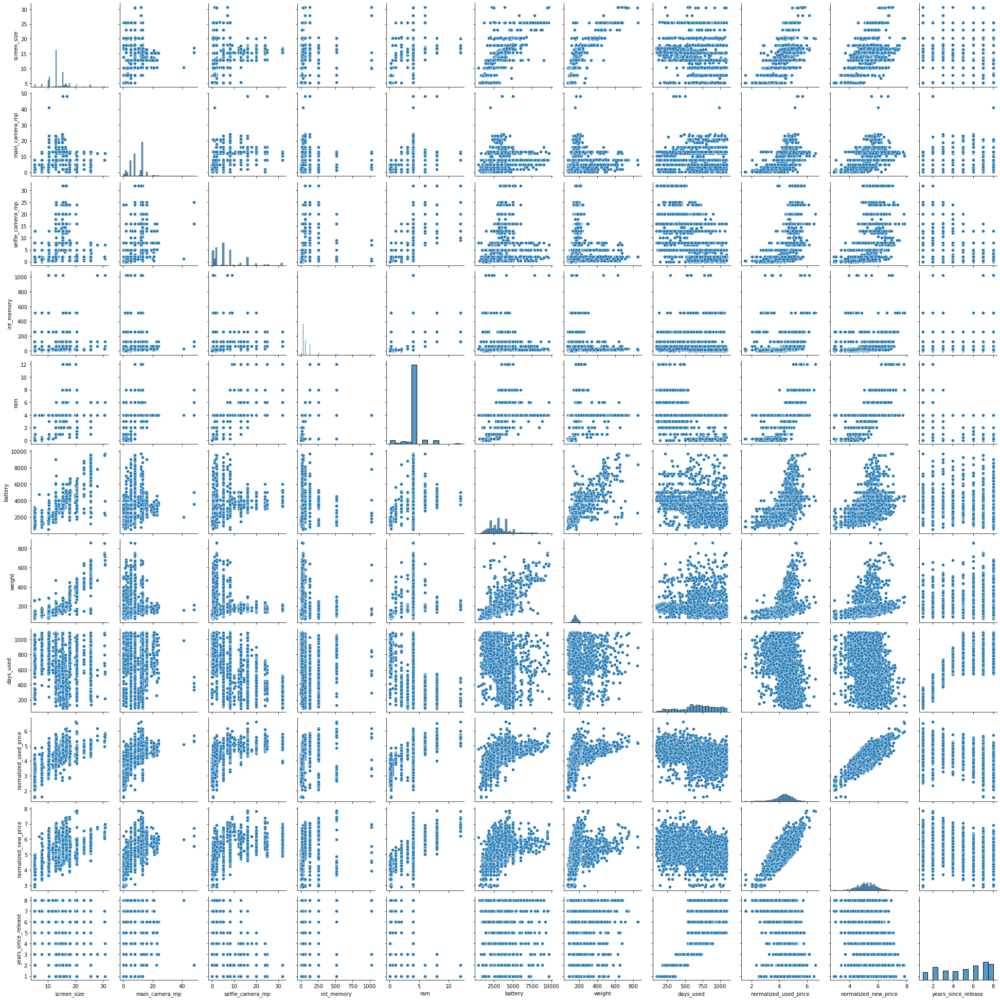

In [236]:
sns.pairplot(data= imputeddf)
plt.show()

- We have seen mostly from analysis above.

2) Study on `brand_name`

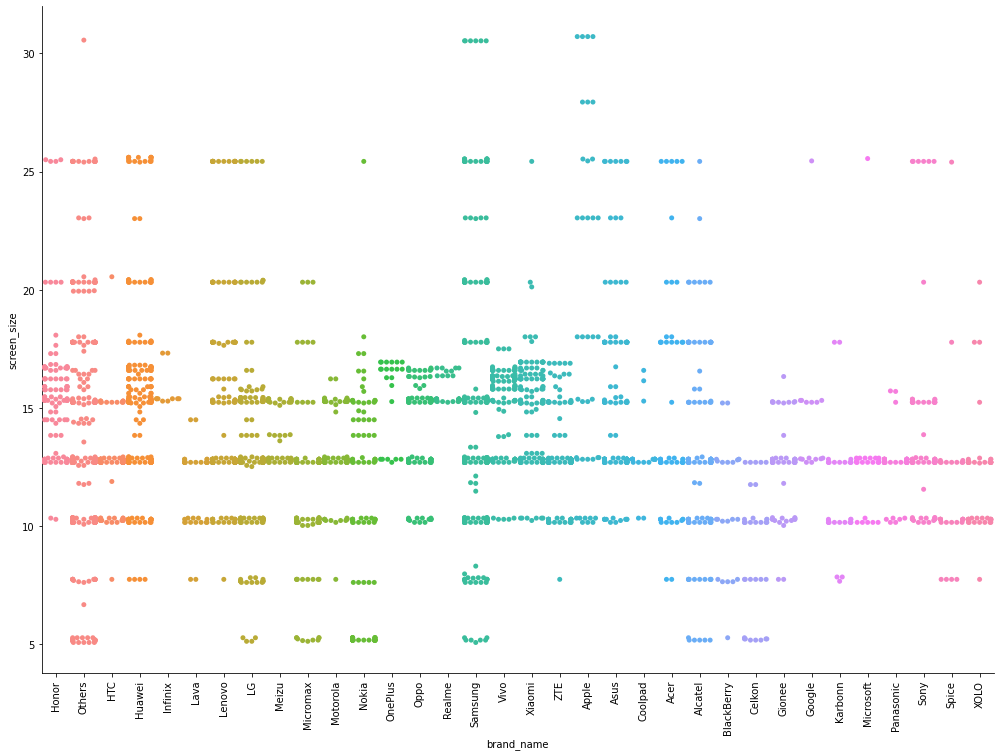

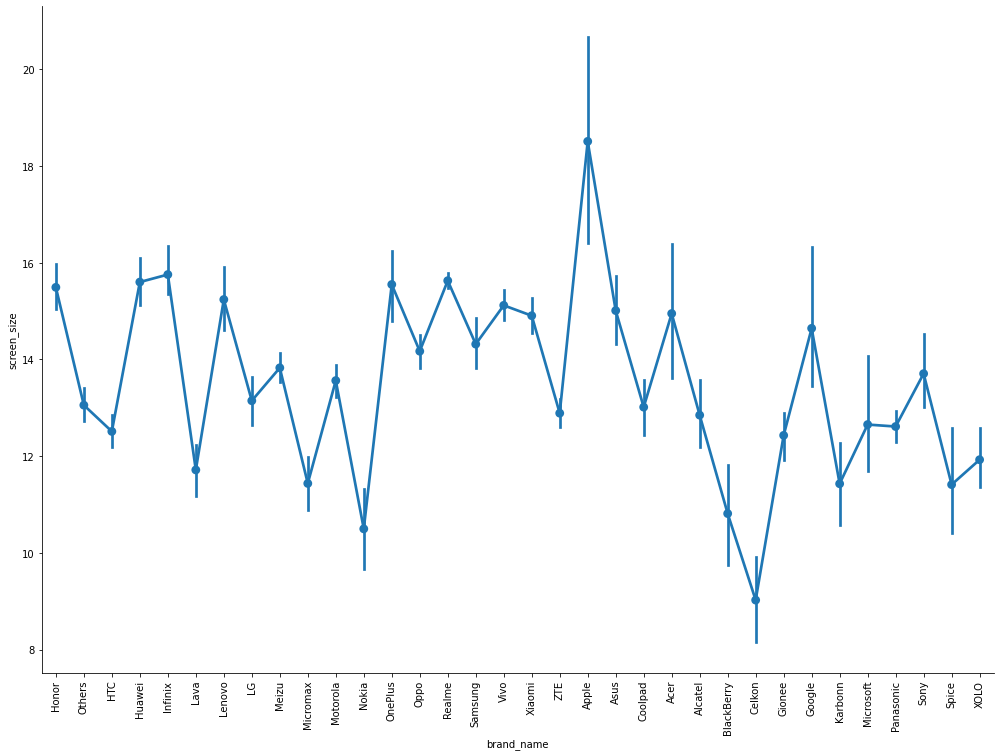

In [237]:
sns.catplot(data=imputeddf, kind="swarm", y="screen_size", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=imputeddf, kind="point", y="screen_size", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- Devices are mostly concentrated between 10 to 20cm.
- Apple has the highest average screen size while Celkon has the lowest average.

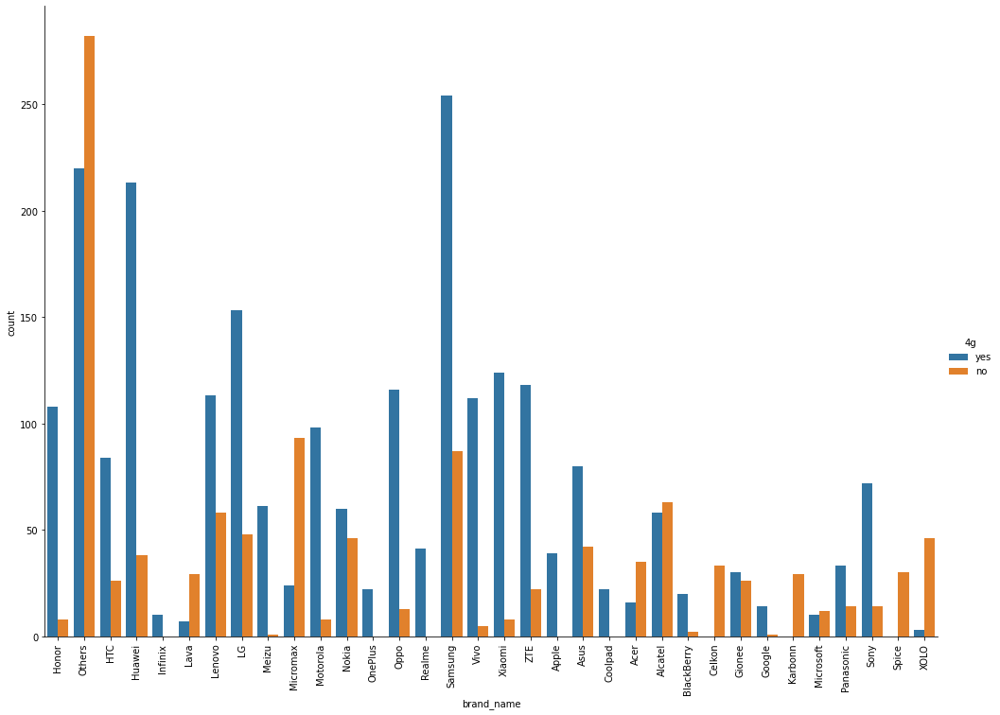

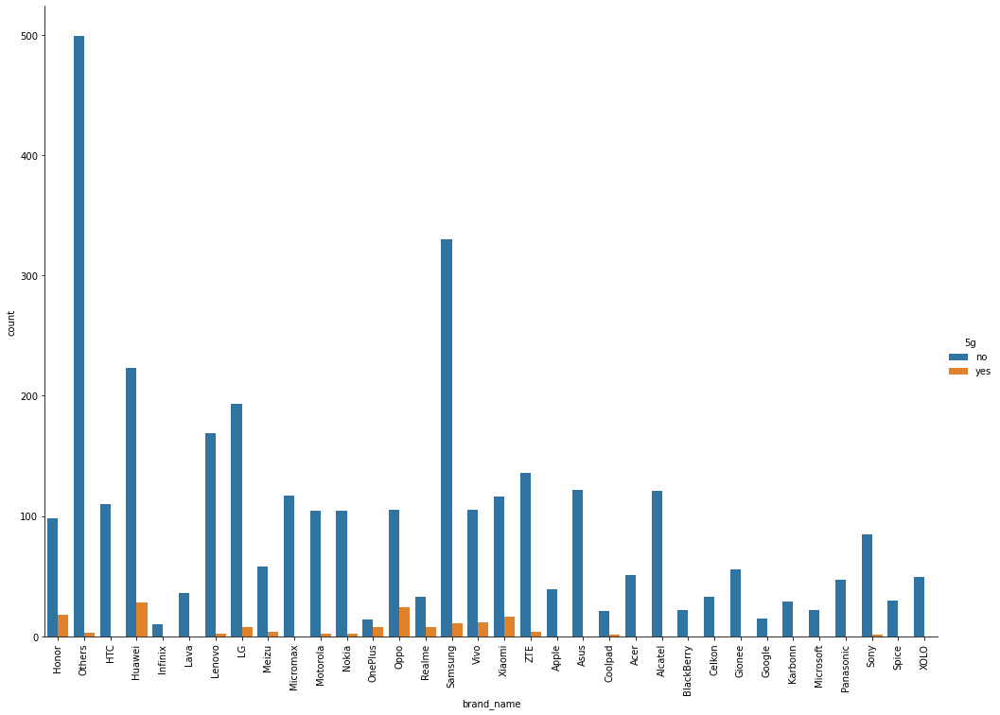

In [238]:
sns.catplot(data=imputeddf, kind="count", x="brand_name",hue='4g',height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=imputeddf, kind="count", x="brand_name",hue='5g',height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- Apart from 'Others' brand, most the brands offer devices that has 4G available.
- Interestingly, not all has 5G available.

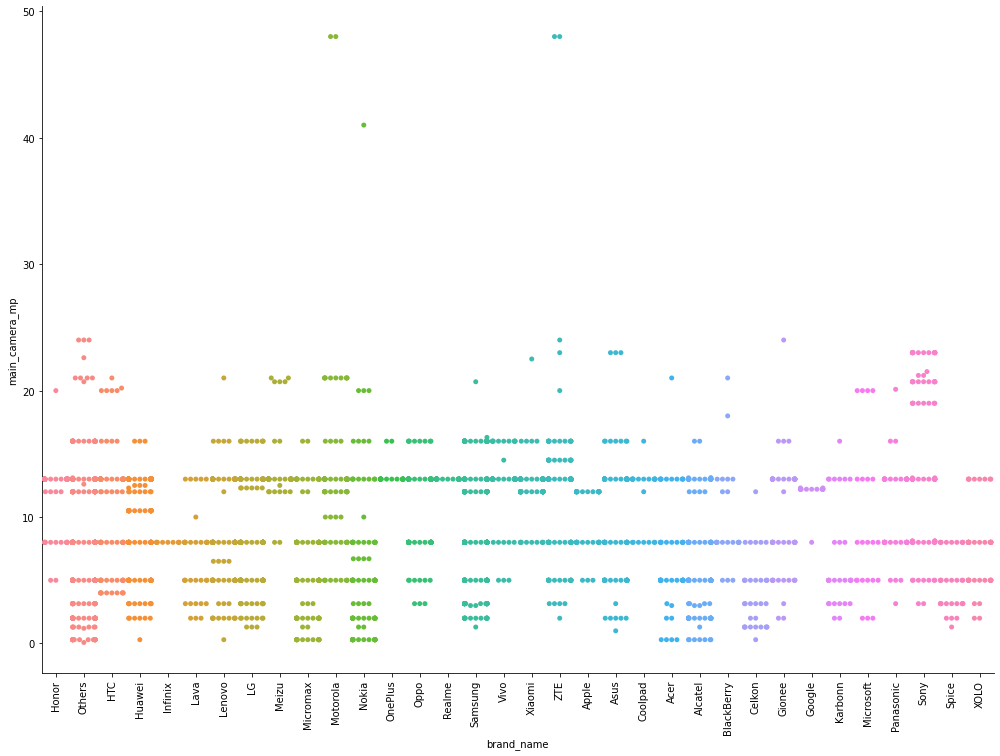

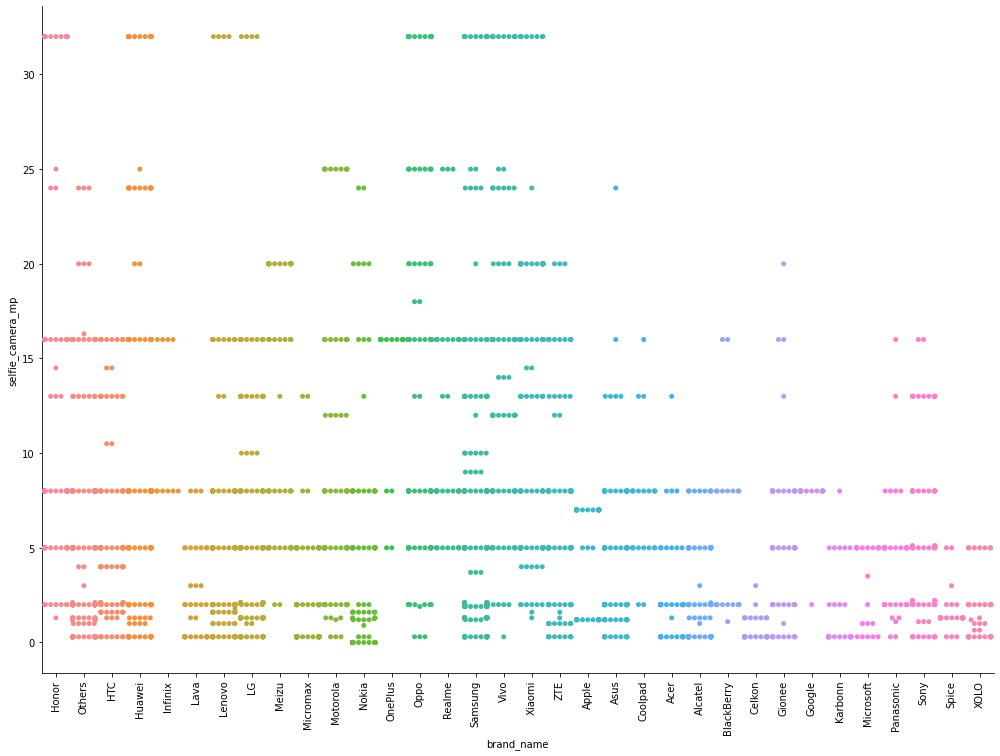

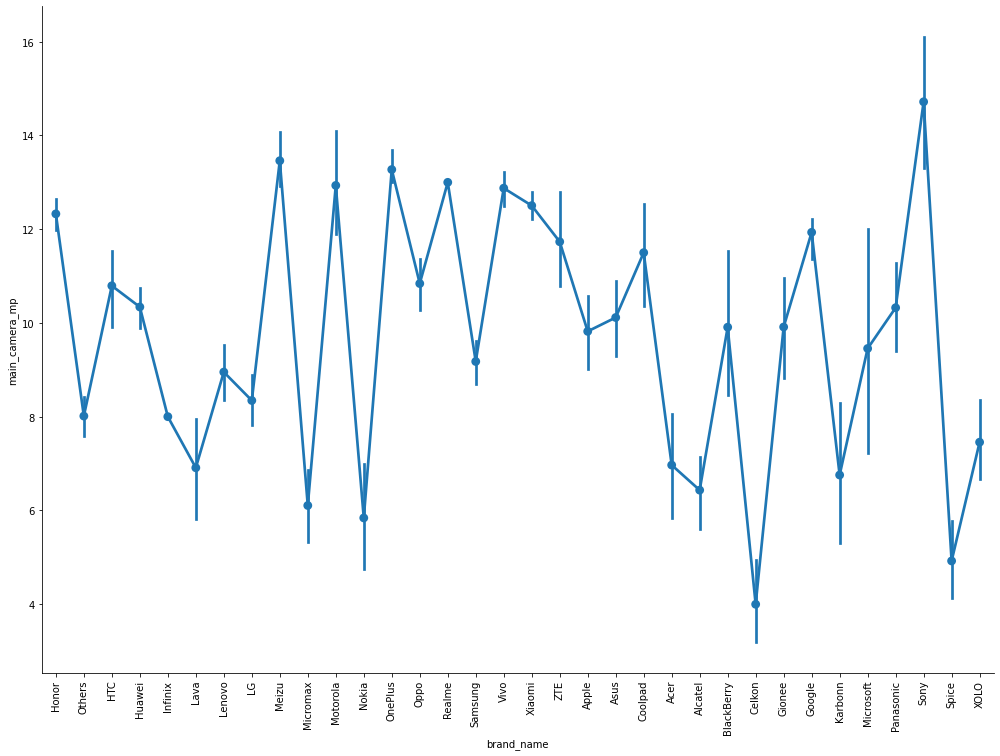

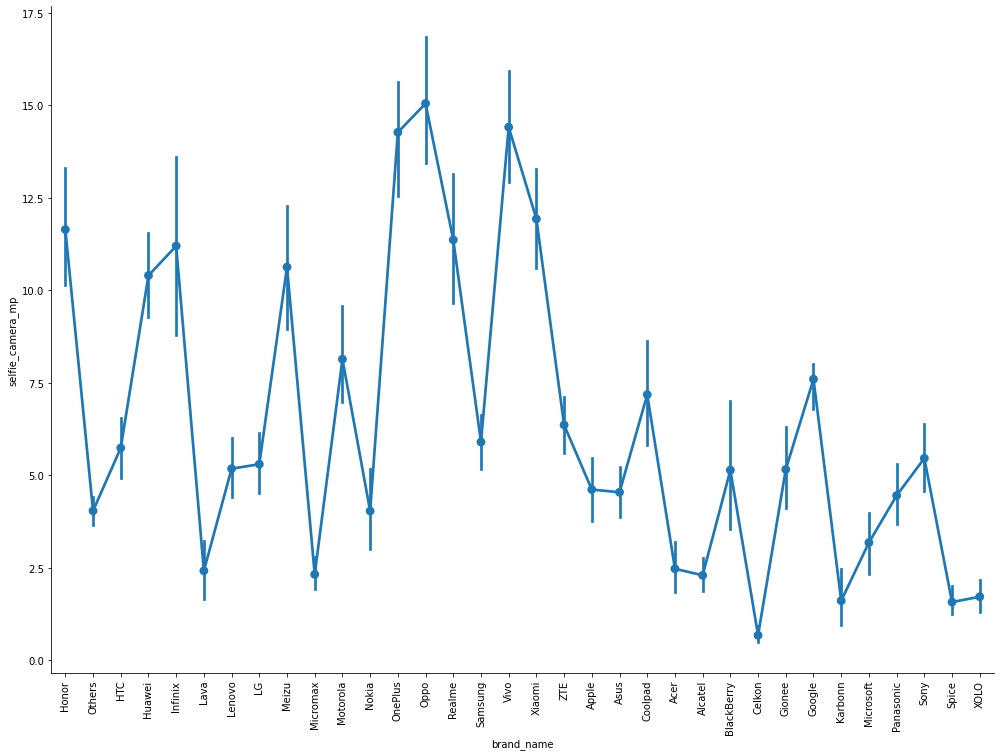

In [239]:
sns.catplot(data=imputeddf, kind="swarm", y="main_camera_mp", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=imputeddf, kind="swarm", y="selfie_camera_mp", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=imputeddf, kind="point", y="main_camera_mp", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=imputeddf, kind="point", y="selfie_camera_mp", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- Most devices has main camera resolution of less than 30mp.
- Sony has the highest average main camera resolutions. OnePlus comes after then Motorola and then Meizu.
- Similarly, selfie camera resolutions are mostly less than 30mp.
- Oppo, OnePlus and Vivo are the top 3 highest in average selfie camera resolution.

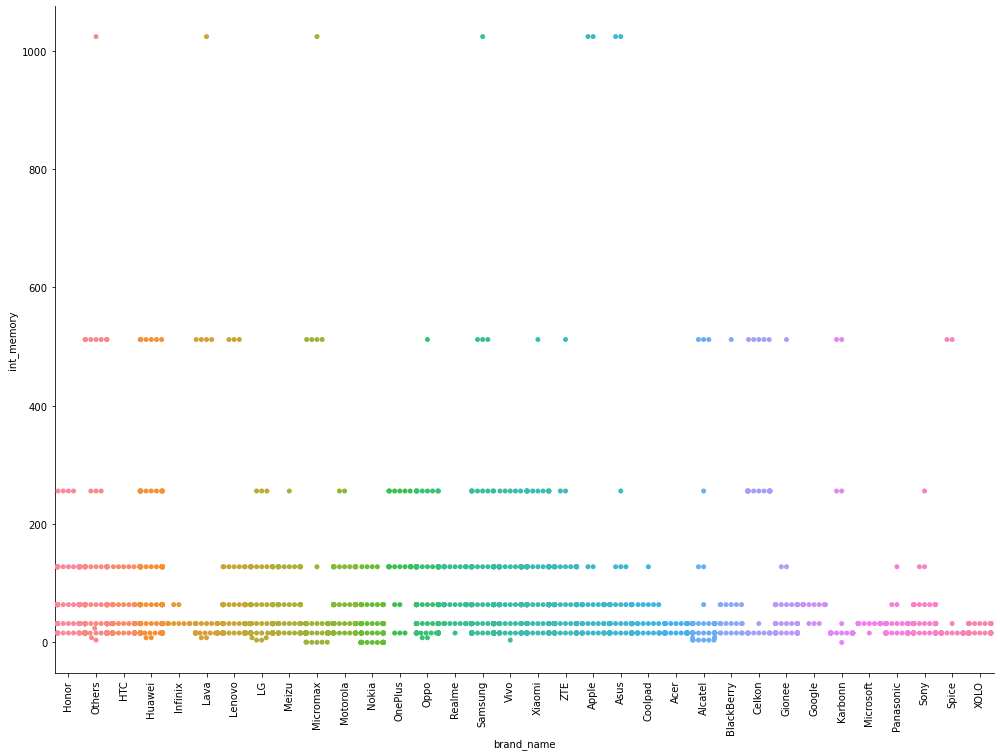

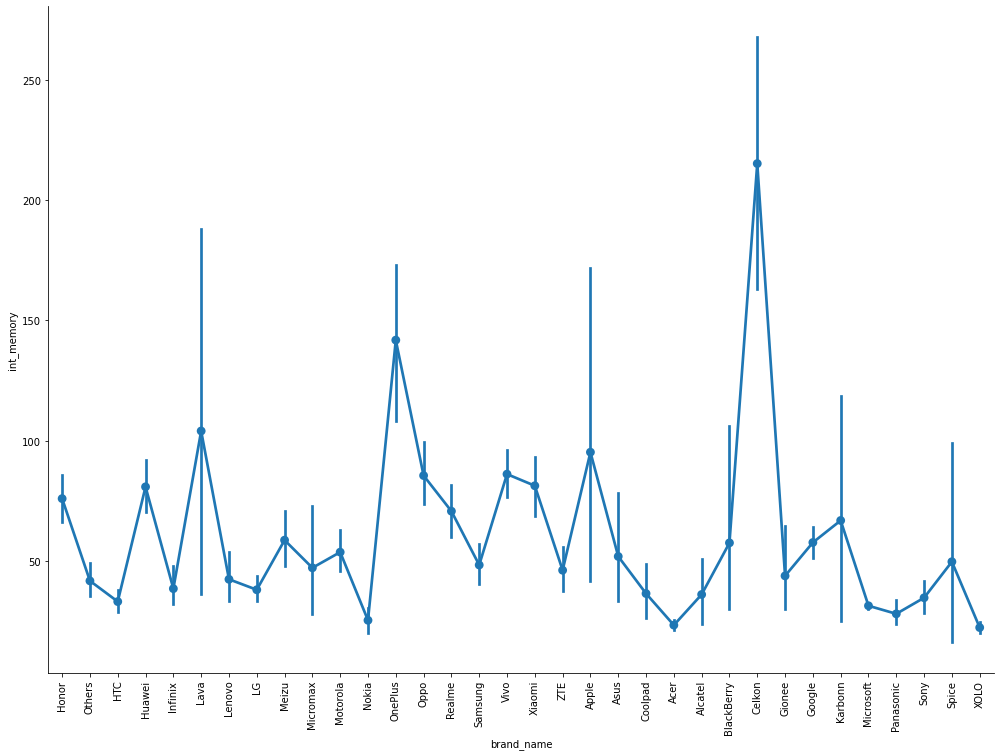

In [240]:
sns.catplot(data=imputeddf, kind="swarm", y="int_memory", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=imputeddf, kind="point", y="int_memory", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- Most devices are below 200GB of internal memory.
- Celkon has large internal memory on average, and then OnePlus being second.

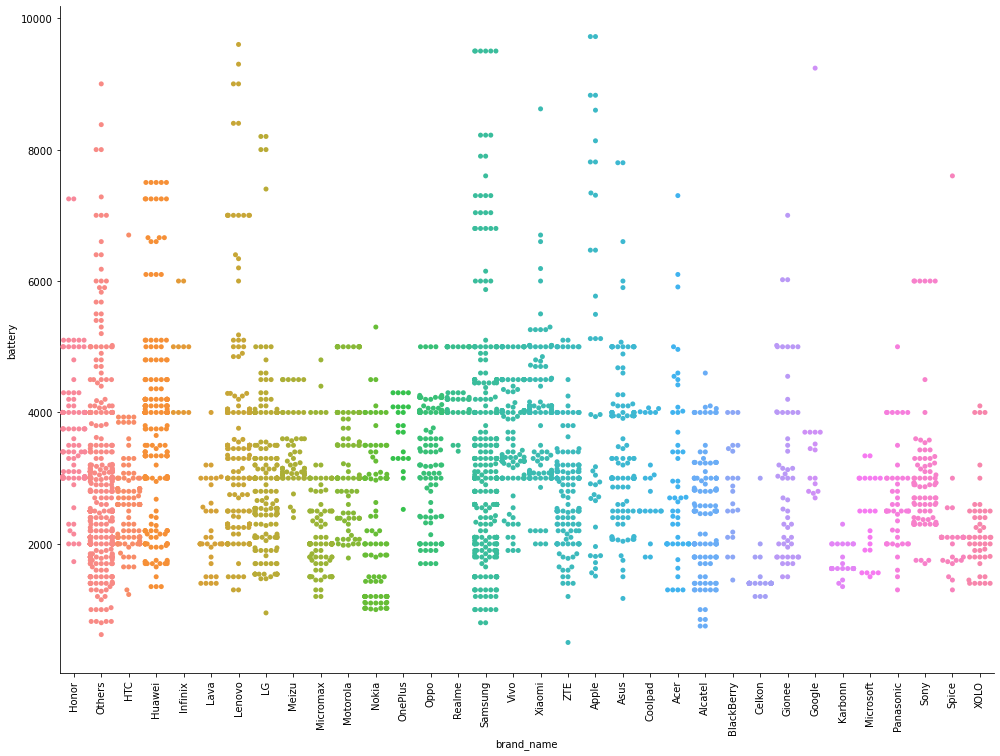

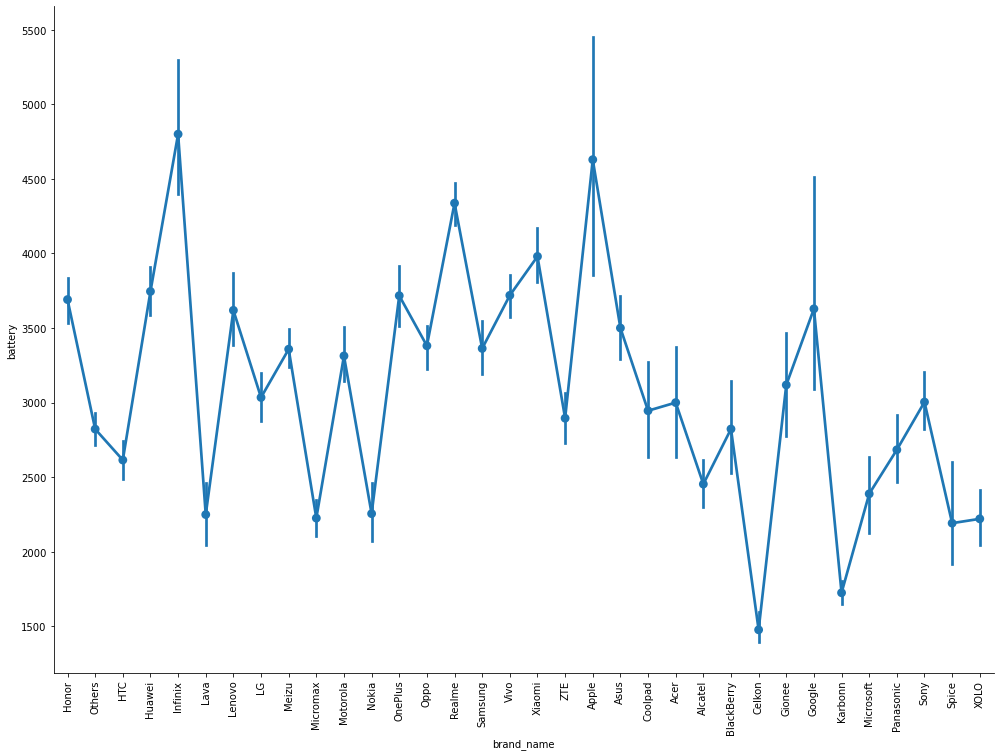

In [241]:
sns.catplot(data=imputeddf, kind="swarm", y="battery", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=imputeddf, kind="point", y="battery", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- Most devices are below 6000mAh of battery capacity.
- Infinix, Apple and Realme has large average battery capacity.

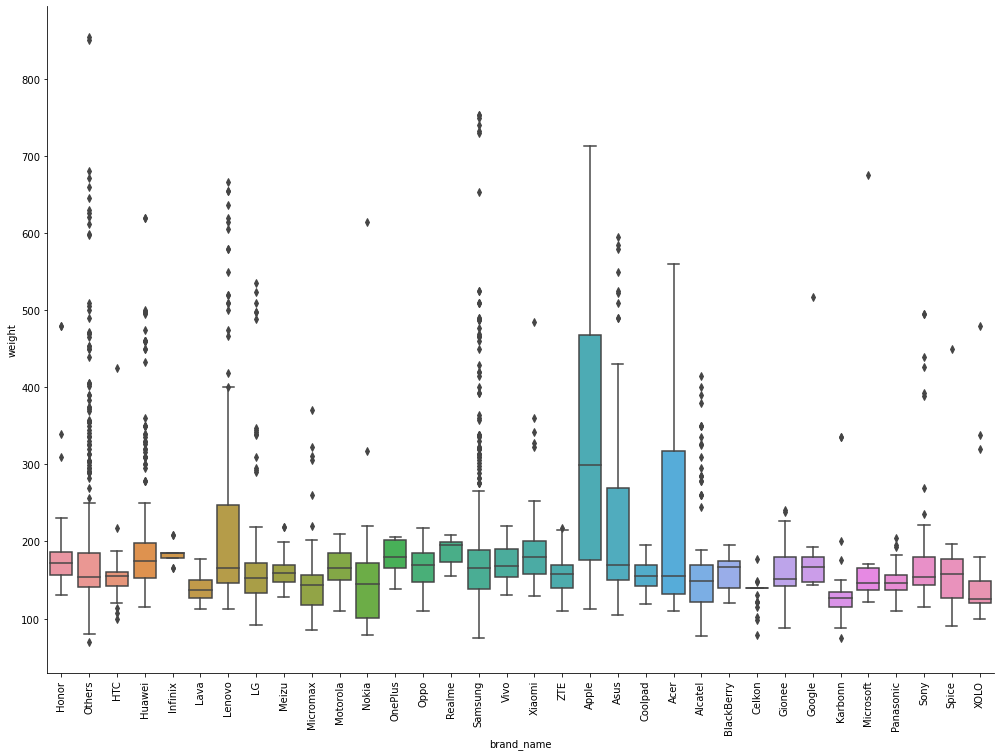

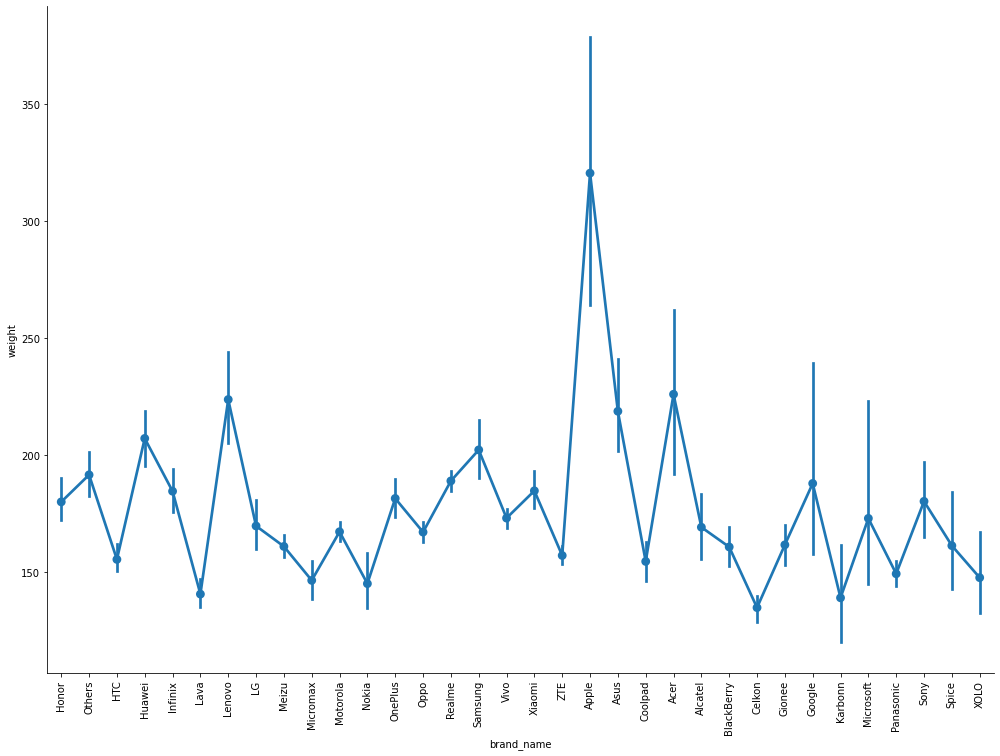

In [242]:
sns.catplot(data=imputeddf, kind="box", y="weight", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()
sns.catplot(data=imputeddf, kind="point", y="weight", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- Apple is averagely heaviest among the other brand, which can be related due to the large battery capacity.

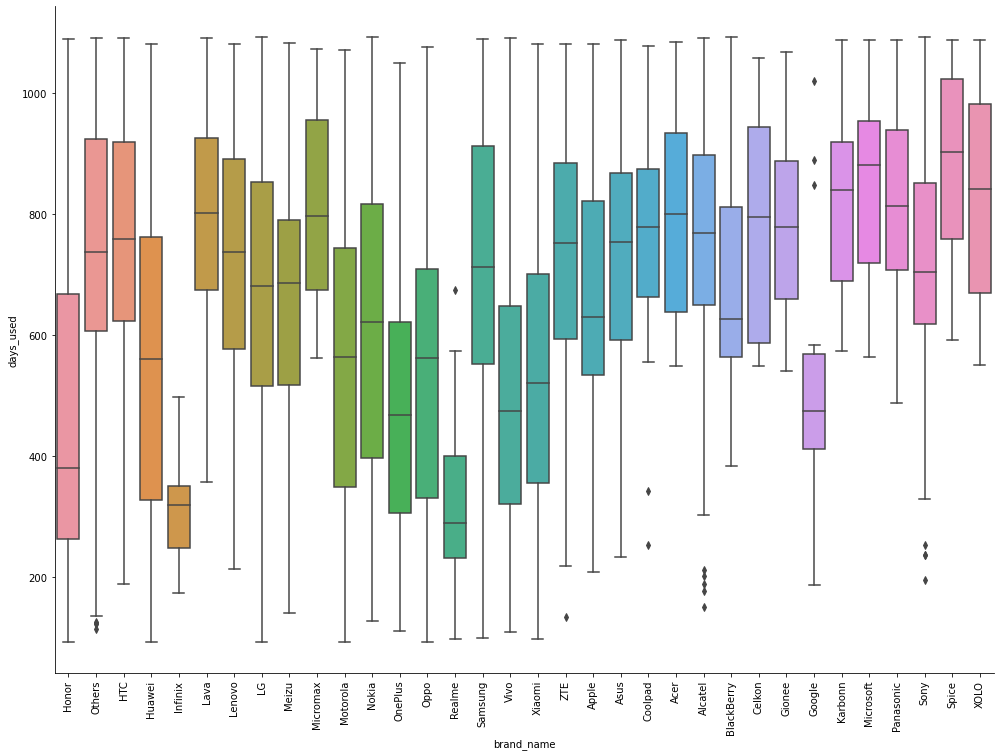

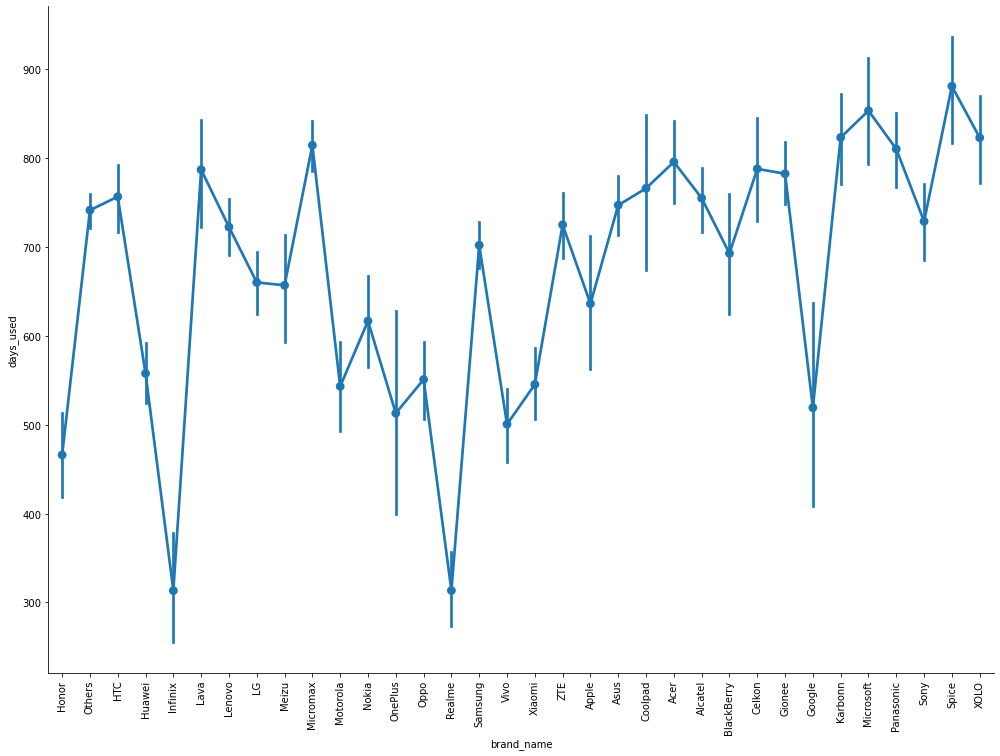

In [243]:
sns.catplot(data=imputeddf, kind="box", y="days_used", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=imputeddf, kind="point", y="days_used", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- The number of days used of the used devices are generally between 500 to 800 days.
- Realme, Infinix and Honor being the lowest.
- Known brands mostly has similar amount of days used.

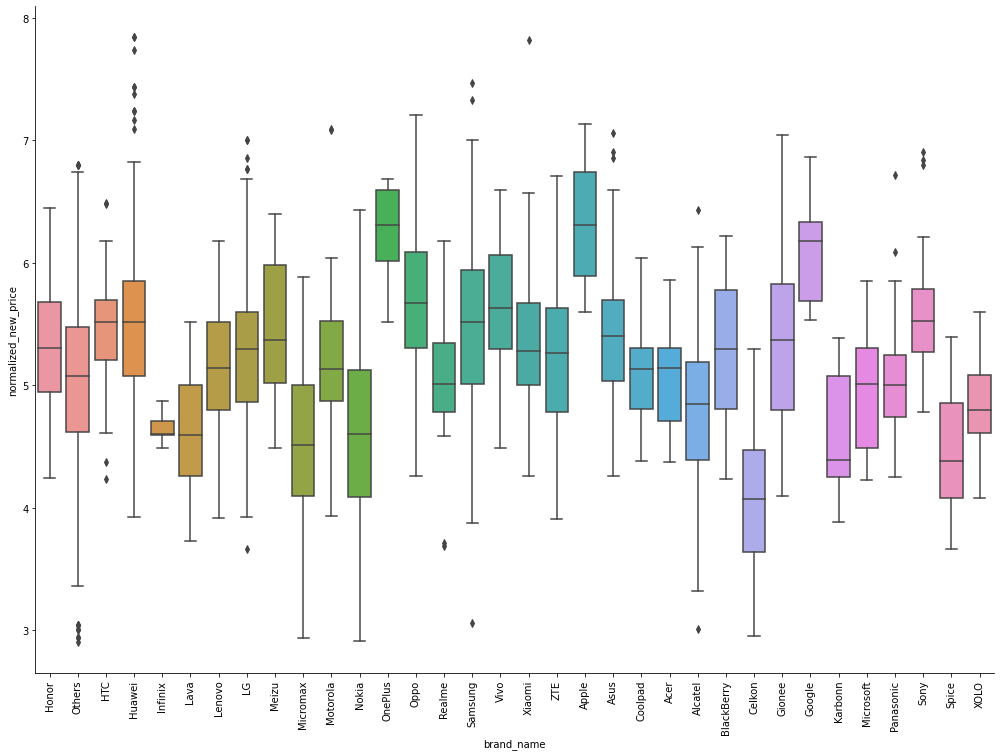

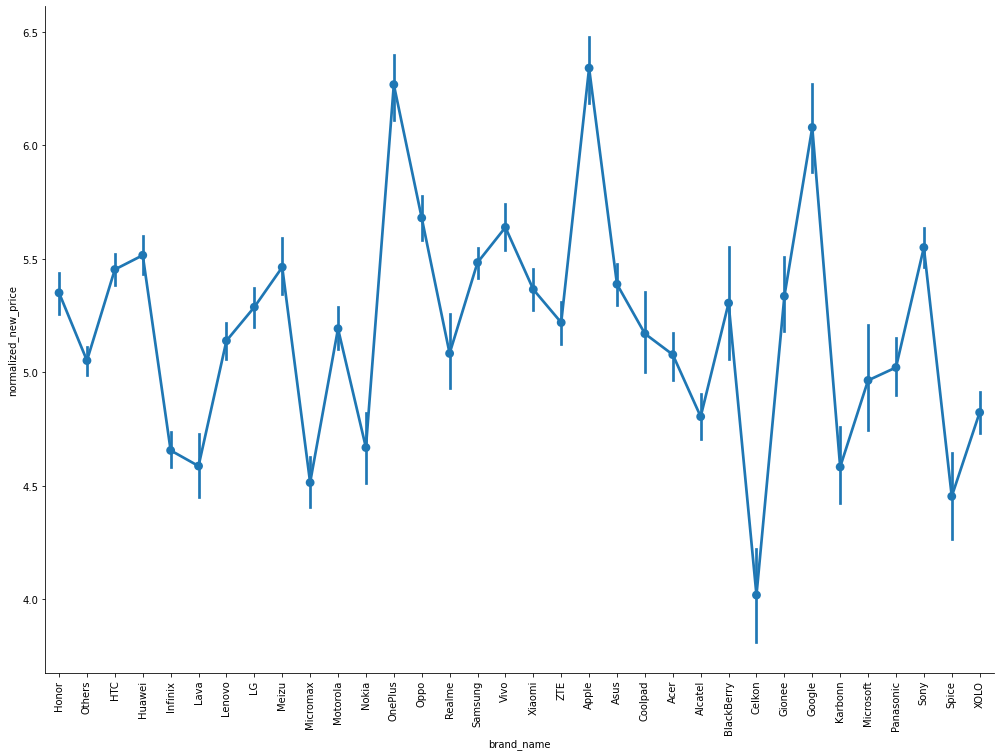

In [244]:
sns.catplot(data=imputeddf, kind="box", y="normalized_new_price", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=imputeddf, kind="point", y="normalized_new_price", x="brand_name",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- Apple, Oneplus and Google are the most expensive brand among others.

3) Study on `years_since_release`

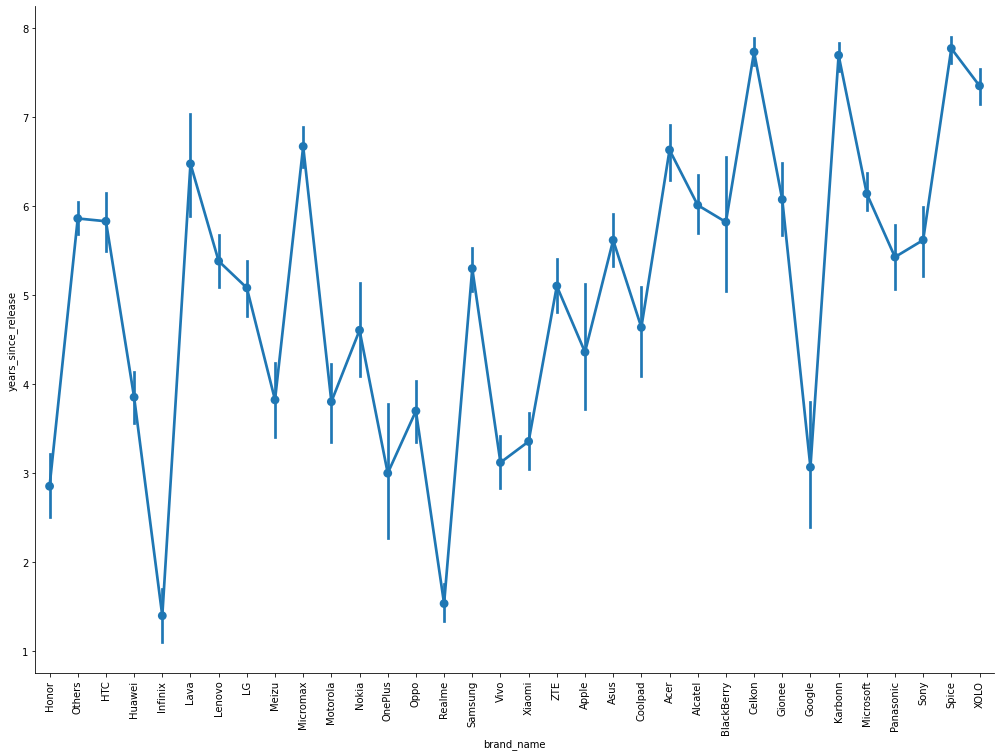

In [245]:
sns.catplot(data=imputeddf, kind="point", x="brand_name", y="years_since_release",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- Celkon, Karbonn and Spice are oldest among others. Newer ones are Infinix and Realme.

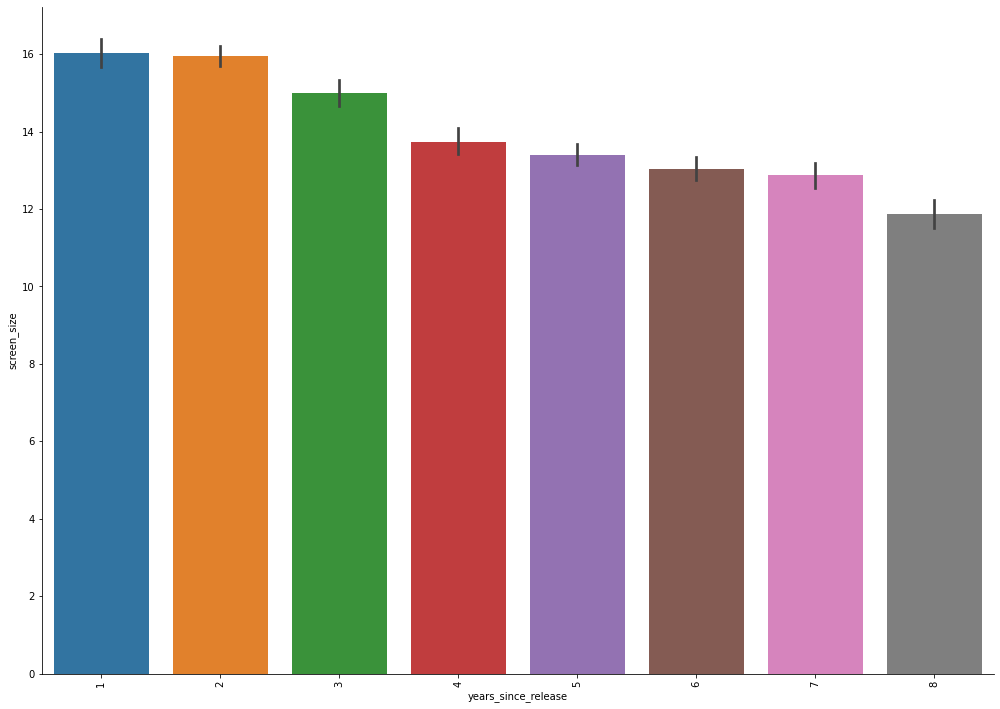

In [246]:
sns.catplot(data=imputeddf, kind="bar", y="screen_size", x="years_since_release",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- Screen size increases over the years.

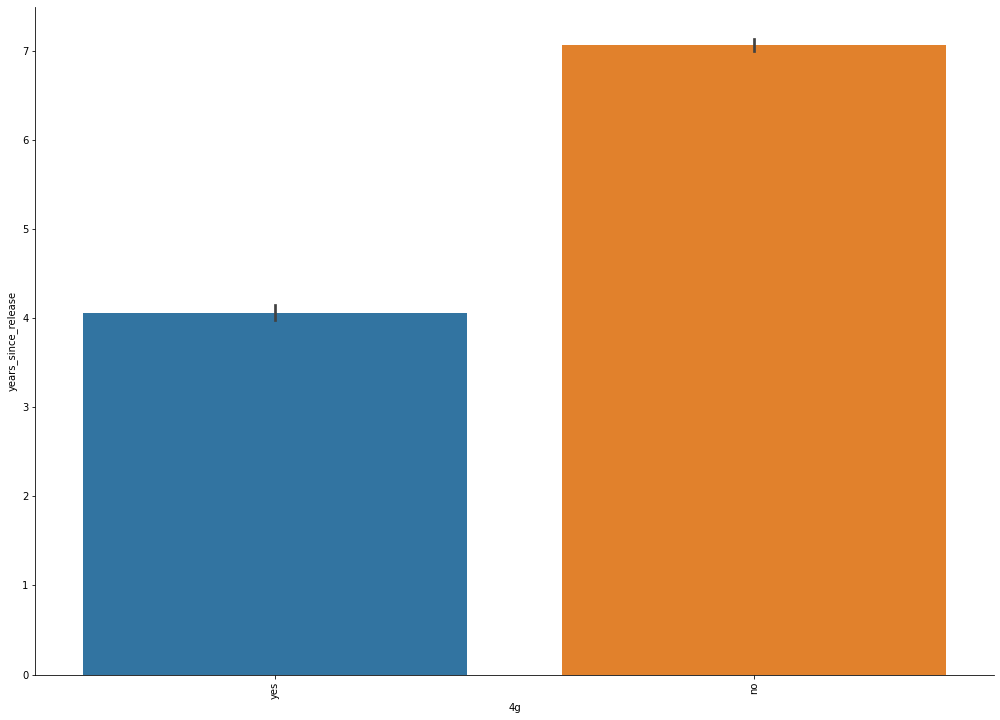

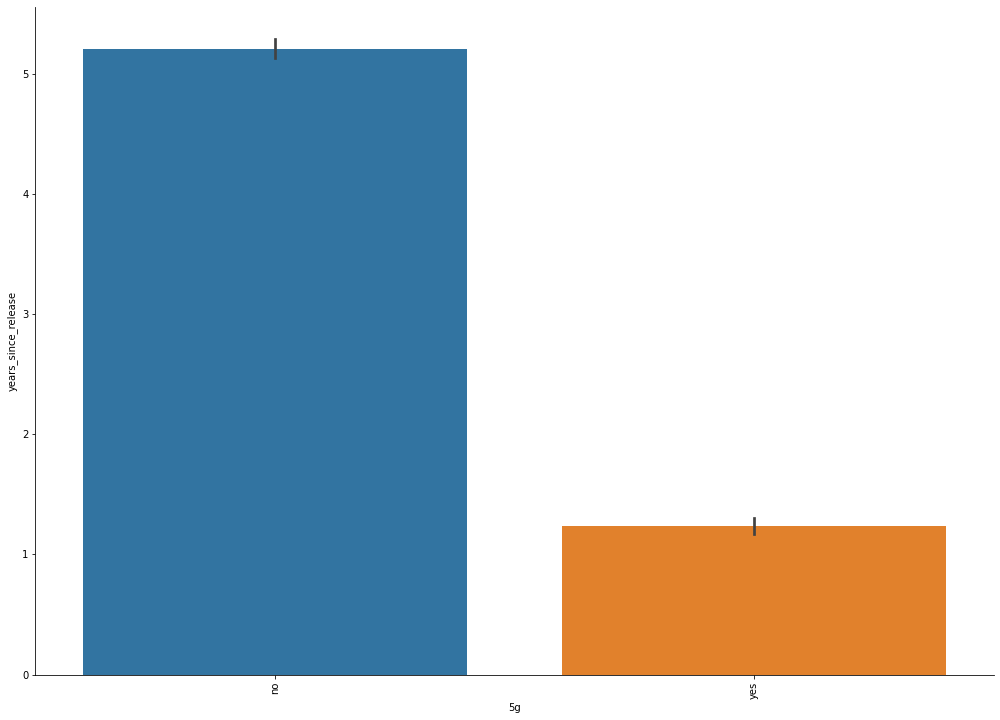

In [247]:
sns.catplot(data=imputeddf, kind="bar", x="4g", y="years_since_release",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=imputeddf, kind="bar", x="5g", y="years_since_release",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- The plots depicts the evolution of the strength of telecommunications within the decade.

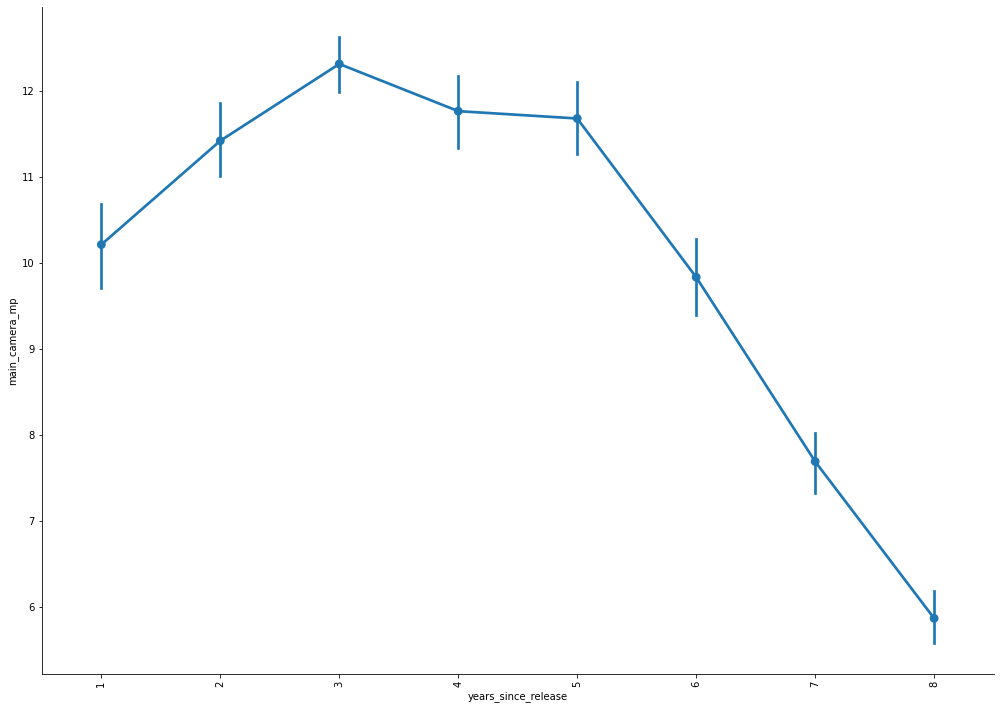

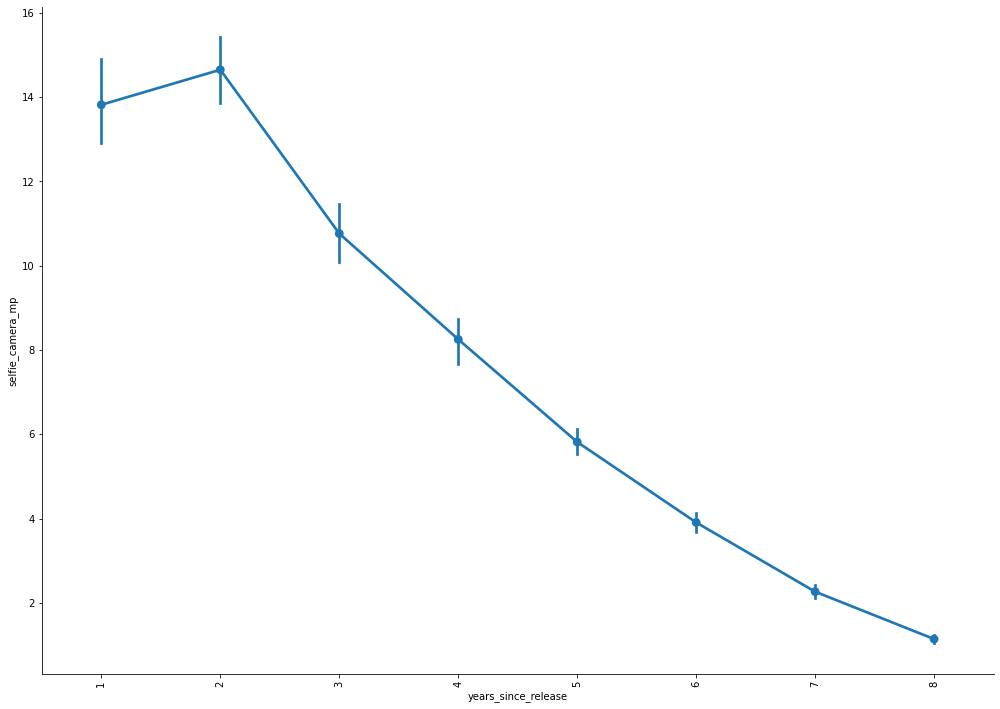

In [248]:
sns.catplot(data=imputeddf, kind="point", y="main_camera_mp", x="years_since_release",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=imputeddf, kind="point", y="selfie_camera_mp", x="years_since_release",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- It can be seen that both main and selfie camera has a shift in improvement of resolution, newer device offering better resolution.

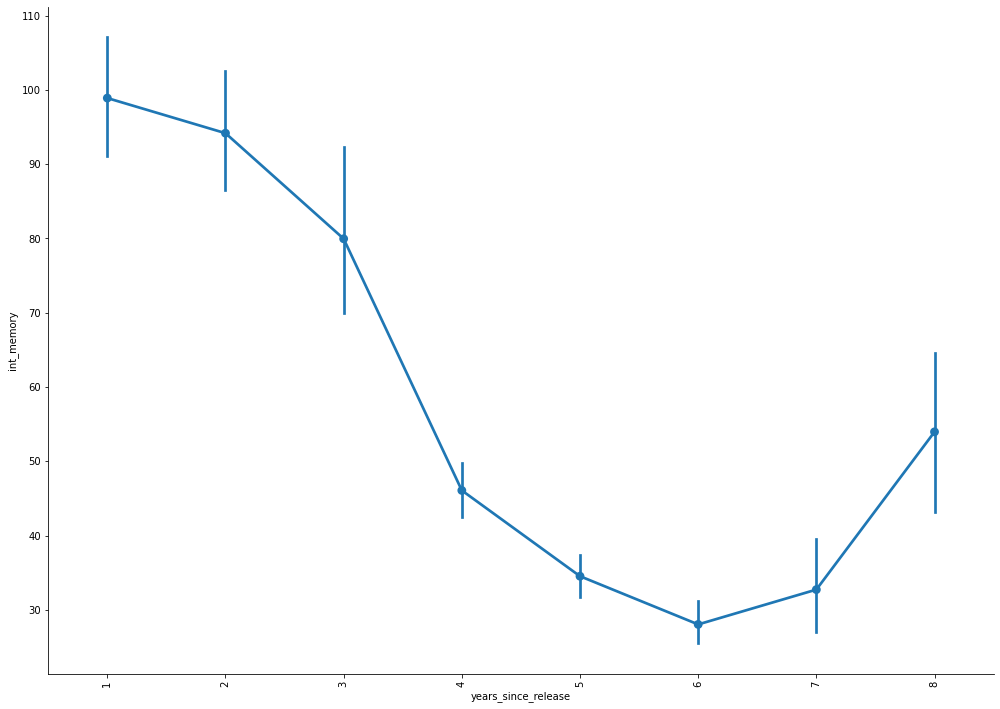

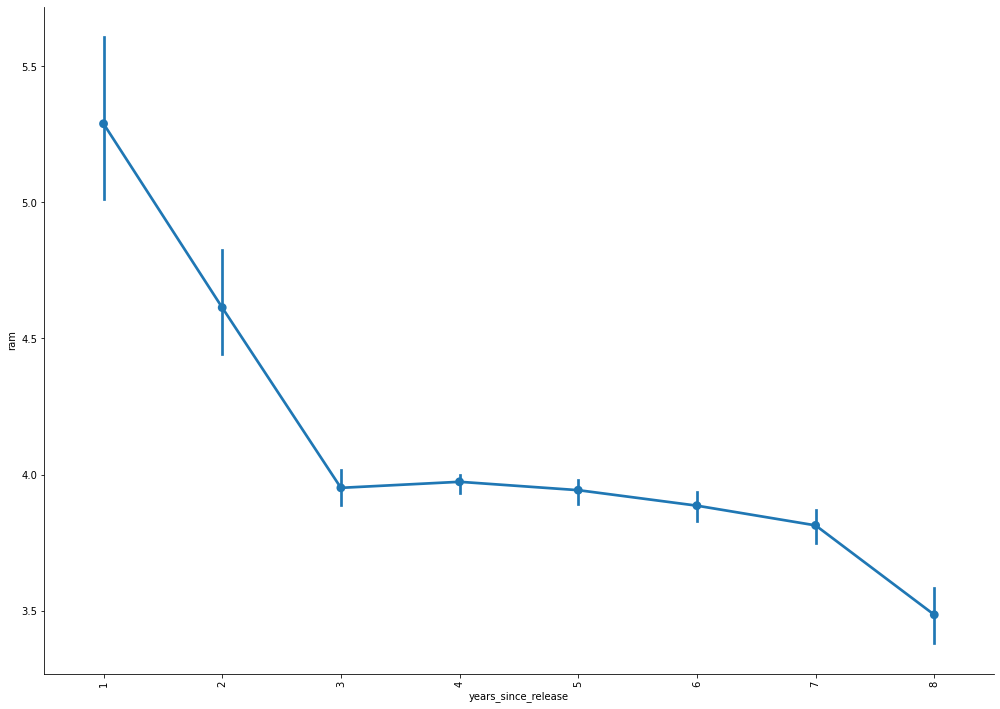

In [249]:
sns.catplot(data=imputeddf, kind="point", y="int_memory", x="years_since_release",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=imputeddf, kind="point", y="ram", x="years_since_release",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- Again we see the improvements over the years, larger RAM and internal memory available over the years.

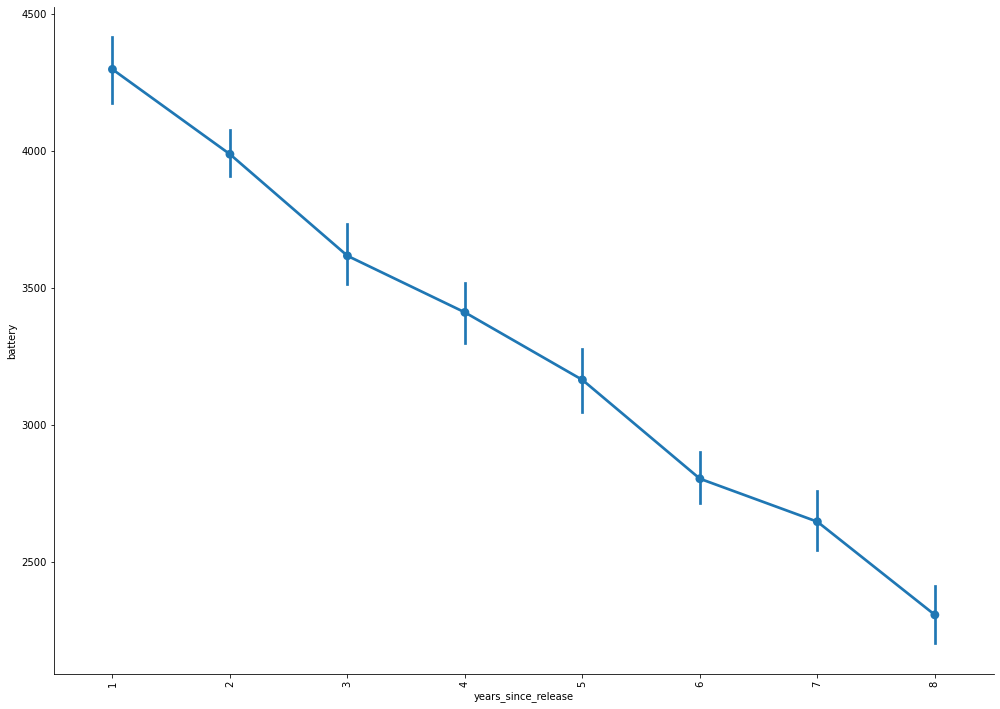

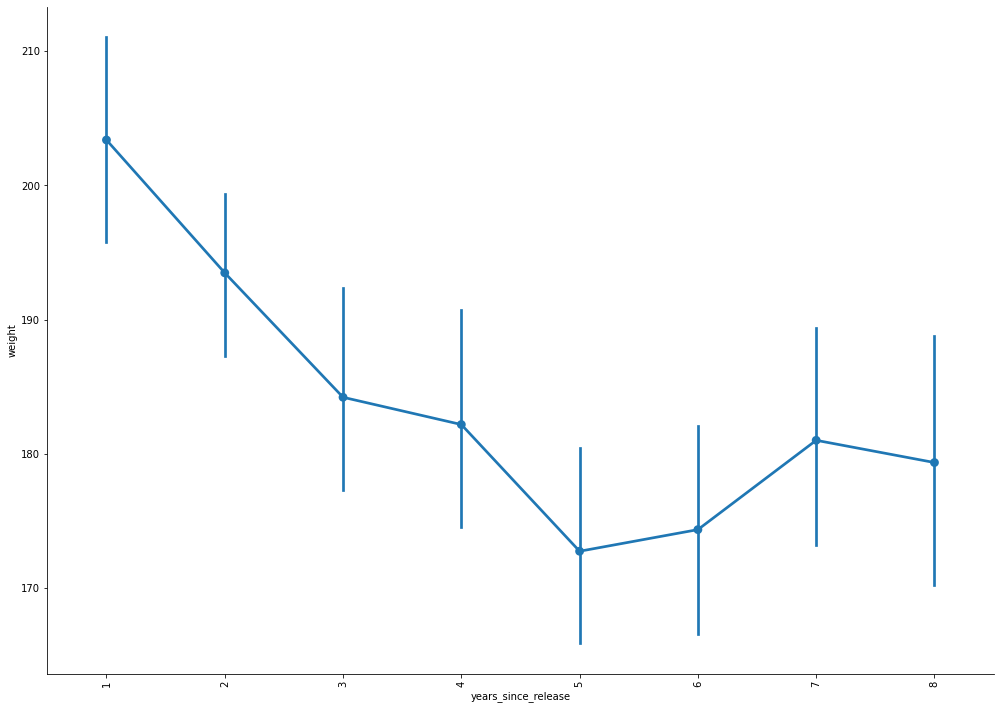

In [250]:
sns.catplot(data=imputeddf, kind="point", y="battery", x="years_since_release",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

sns.catplot(data=imputeddf, kind="point", y="weight", x="years_since_release",height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- Battery capacity gets larger and larger as years go by, which corresponds to increasing weights of the device.

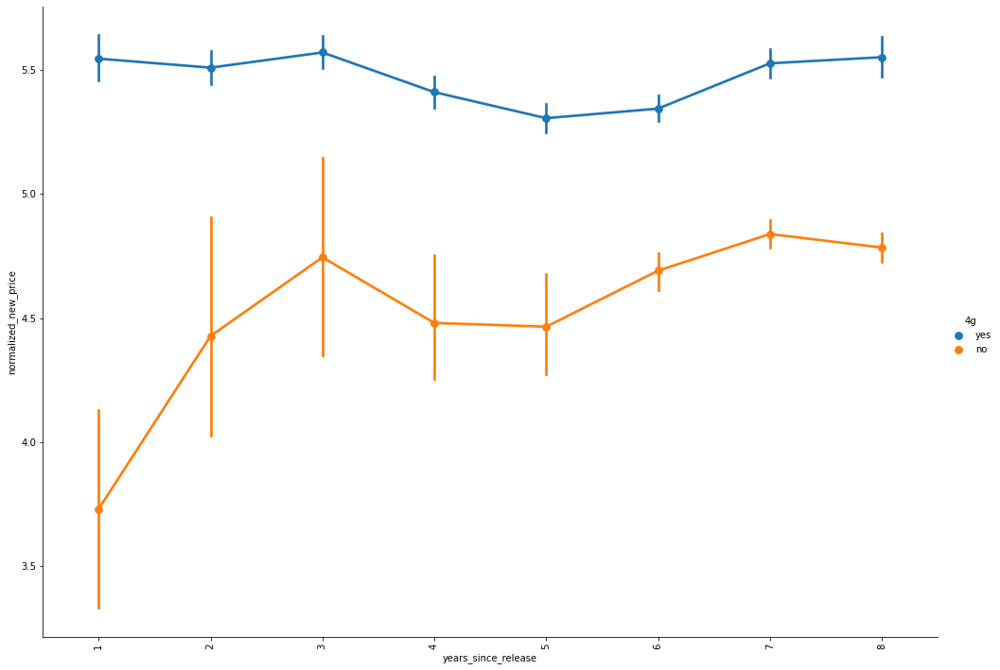

In [251]:
sns.catplot(data=imputeddf, kind="point", y="normalized_new_price", x="years_since_release",hue='4g',height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

(Seen similar for `normalized_used_price`)
- Newer devices gets more expensive year by year. 
- However in the recent years, availability of 4G or 5G affects the value of the device. Depicting that internet through devices are widely used.

4) Some more selected analysis

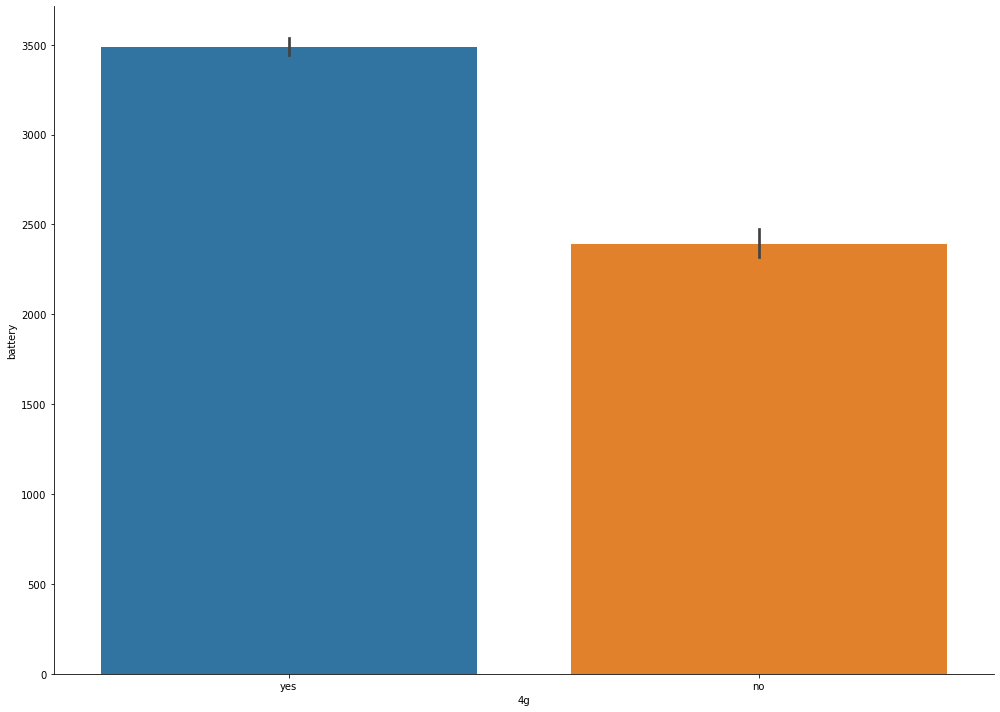

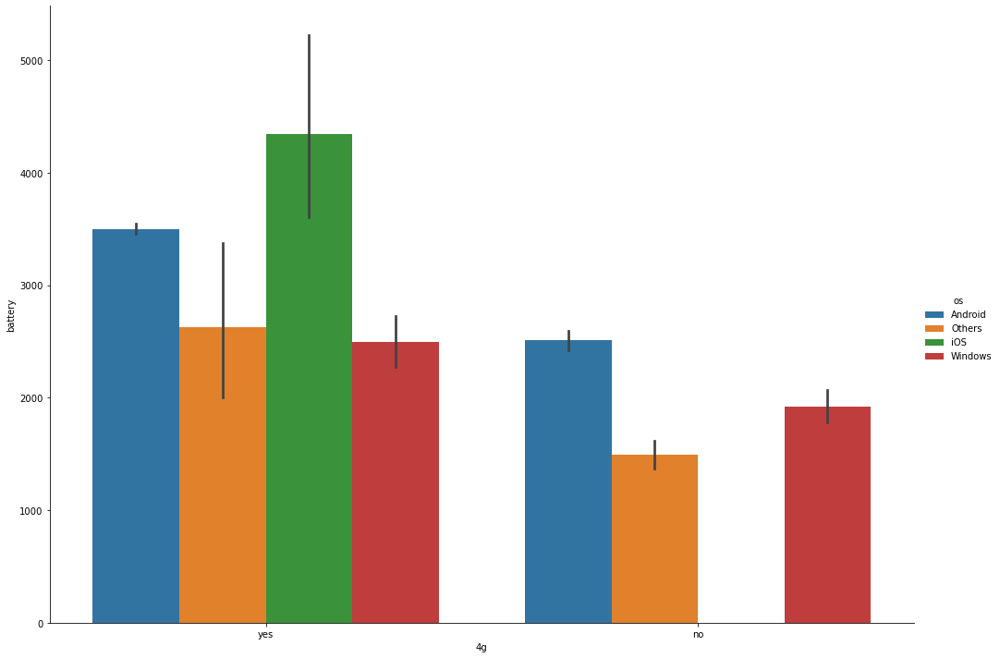

In [252]:
sns.catplot(data=imputeddf, kind='bar', x='4g', y='battery',height=10, aspect=1.4)
plt.show()

sns.catplot(data=imputeddf, kind='bar', x='4g', y='battery',hue='os',height=10, aspect=1.4)
plt.show()

- It can be seen that 4G requires larger batter capacity.
- It appears also that iOS on average has largest battery capacity for 4G devices.

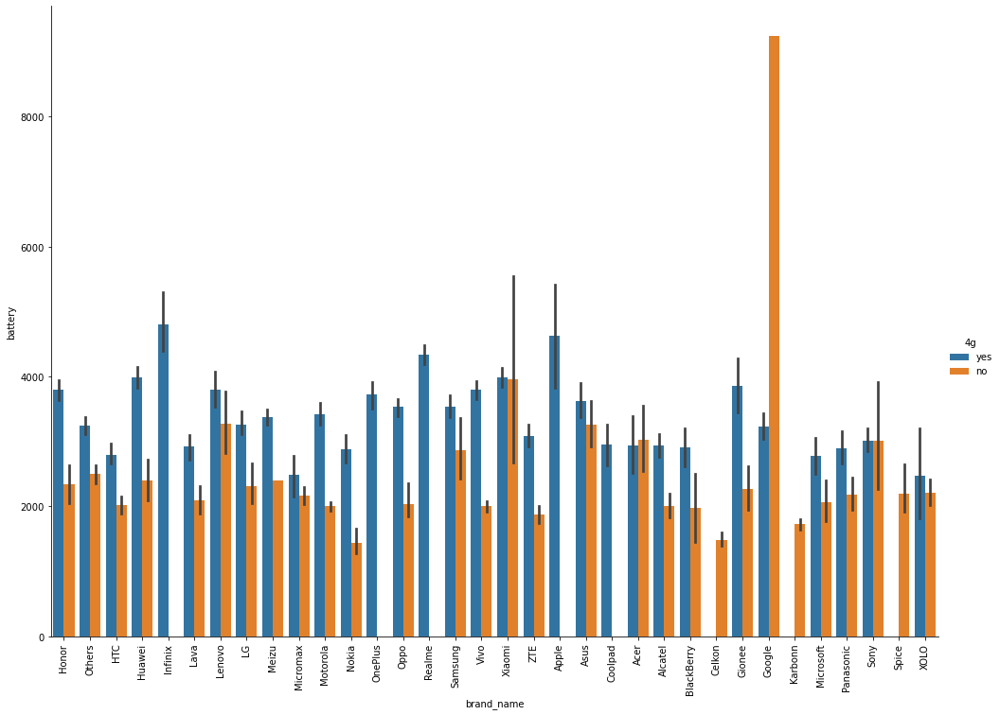

In [253]:
sns.catplot(data=imputeddf, kind='bar', x='brand_name', y='battery',hue='4g',height=10, aspect=1.4)
plt.xticks(rotation=90)
plt.show()

- Again 4G devices mostly has larger capacity than no 4G. Except for possibly an outlier for Google devices.

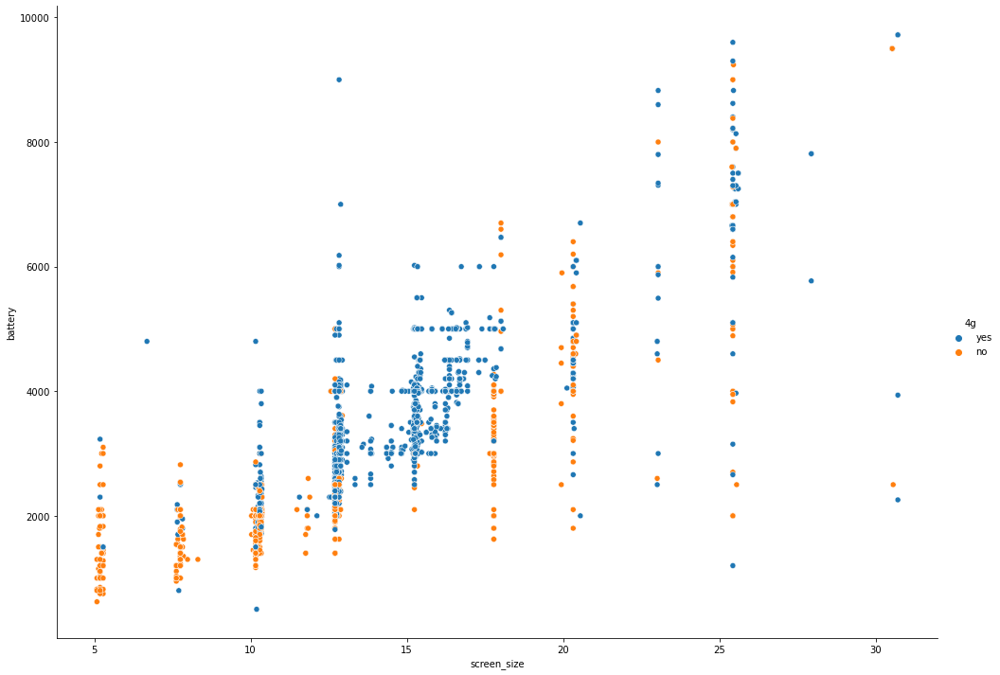

In [254]:
sns.relplot(data=imputeddf, x='screen_size',y='battery',hue='4g',height=10,aspect=1.4)
plt.show()

- A vague positive linear relationship pattern can be seen, showing larger screen size tends to have larger battery capacity.

***End of Appendix.***